In [1]:
import os
import glob

basedir = 'vehicles/'

img_types = os.listdir(basedir)
cars = []
for img_type in img_types:
    cars.extend(glob.glob(basedir+img_type+'/*'))
    
print('Number of Vehicle Images Found:', len(cars))

with open('cars.txt', 'w') as f:
    for fn in cars:
        f.write(fn+'/n')
        
basedir = 'non-vehicles/'

img_types = os.listdir(basedir)
notcars = []
for img_type in img_types:
    notcars.extend(glob.glob(basedir+img_type+'/*'))

print('Number if Non-Vehicle Images Found:', len(notcars))

with open('notcars.txt', 'w') as f:
    for fn in notcars:
        f.write(fn+'/n')

Number of Vehicle Images Found: 8792
Number if Non-Vehicle Images Found: 8968


In [2]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import cv2
import time
from skimage.feature import hog
from sklearn.svm import LinearSVC
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from scipy.ndimage.measurements import label
from moviepy.editor import VideoFileClip
from collections import deque

In [3]:
def get_hog_features(img, orient, pix_per_cell, cell_per_block, 
                        vis=False, feature_vec=True):
    # Call with two outputs if vis==True
    if vis == True:
        features, hog_image = hog(img, orientations=orient, 
                                  pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block), 
                                  transform_sqrt=True, 
                                  visualise=vis, feature_vector=feature_vec)
        return features, hog_image
    # Otherwise call with one output
    else:      
        features = hog(img, orientations=orient, 
                       pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block), 
                       transform_sqrt=True, 
                       visualise=vis, feature_vector=feature_vec)
        return features
    
def bin_spatial(img, color_space='RGB', size=(64, 64)):
    # Convert image to new color space (if specified)
    if color_space != 'RGB':
        if color_space == 'HSV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
        elif color_space == 'LUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
        elif color_space == 'HLS':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
        elif color_space == 'YUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
        elif color_space == 'YCrCb':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    else: feature_image = np.copy(img)             
    # Use cv2.resize().ravel() to create the feature vector
    features = cv2.resize(feature_image, size).ravel() 
    # Return the feature vector
    return features

# Define a function to compute color histogram features  
def color_hist(img, nbins=32):
    # Compute the histogram of the RGB channels separately
    rhist = np.histogram(img[:,:,0], bins=nbins)
    ghist = np.histogram(img[:,:,1], bins=nbins)
    bhist = np.histogram(img[:,:,2], bins=nbins)
    # Generating bin centers
    bin_edges = rhist[1]
    bin_centers = (bin_edges[1:]  + bin_edges[0:len(bin_edges)-1])/2
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((rhist[0], ghist[0], bhist[0]))
    # Return the individual histograms, bin_centers and feature vector
    return hist_features

# Define a function to extract features from a list of images
# Have this function call bin_spatial() and color_hist()
def extract_features(imgs, color_space='RGB', spatial_size=(32, 32),
                        hist_bins=32, orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=True, hist_feat=True, hog_feat=True, 
                        viz=False, viz_only=False, hog_viz_name="", viz_title="HOG Viz"):
    # Create a list to append feature vectors to
    features = []
    # Iterate through the list of images
    for file in imgs:
        file_features = []
        # Read in each one by one
        image = mpimg.imread(file)
        # apply color conversion if other than 'RGB'
        if color_space != 'RGB':
            if color_space == 'HSV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
            elif color_space == 'LUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
            elif color_space == 'HLS':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
            elif color_space == 'YUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
            elif color_space == 'YCrCb':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
        else: feature_image = np.copy(image)      

        if spatial_feat == True:
            spatial_features = bin_spatial(feature_image, size=spatial_size)
            file_features.append(spatial_features)
        if hist_feat == True:
            # Apply color_hist()
            hist_features = color_hist(feature_image, nbins=hist_bins)
            file_features.append(hist_features)
        if hog_feat == True:
        # Call get_hog_features() with vis=False, feature_vec=True
            if viz == True:
                if hog_channel == 'ALL':
                    hog_features = []
                    for channel in range(feature_image.shape[2]):
                        hog_feature, hog_image = get_hog_features(feature_image[:,:,channel], 
                                            orient, pix_per_cell, cell_per_block, 
                                            vis=True, feature_vec=True)
                        hog_features.append(hog_feature)
                    hog_features = np.ravel(hog_features)        
                else:
                    hog_features, hog_image = get_hog_features(feature_image[:,:,hog_channel], orient, 
                                pix_per_cell, cell_per_block, vis=True, feature_vec=True)
                # Plot HOG visualisation
                
                if viz_only == True:
                    fig = plt.figure()
                    plt.imshow(hog_image)
                    plt.title(viz_title)
                    plt.savefig(hog_viz_name, bbox_inches='tight')
                    
                else:
                    fig = plt.figure()
                    plt.subplot(121)
                    plt.imshow(image)
                    plt.title('Example Image')
                    plt.subplot(122)
                    plt.imshow(hog_image)
                    plt.title('Example HOG viz')
                    plt.savefig(hog_viz_name + "_double", bbox_inches='tight')
                
            else:
                if hog_channel == 'ALL':
                    hog_features = []
                    for channel in range(feature_image.shape[2]):
                        hog_feature = get_hog_features(feature_image[:,:,channel], 
                                            orient, pix_per_cell, cell_per_block, 
                                            vis=False, feature_vec=True)
                        hog_features.append(hog_feature)
                    hog_features = np.ravel(hog_features)        
                else:
                    hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                                pix_per_cell, cell_per_block, vis=False, feature_vec=True)
            # Append the new feature vector to the features list
            file_features.append(hog_features)
        features.append(np.concatenate(file_features))
    # Return list of feature vectors
    return features

def slide_window(img, x_start_stop=[None, None], y_start_stop=[None, None], 
                    xy_window=(64, 64), xy_overlap=(0.5, 0.5)):
    # If x and/or y start/stop positions not defined, set to image size
    if x_start_stop[0] == None:
        x_start_stop[0] = 0
    if x_start_stop[1] == None:
        x_start_stop[1] = img.shape[1]
    if y_start_stop[0] == None:
        y_start_stop[0] = 0
    if y_start_stop[1] == None:
        y_start_stop[1] = img.shape[0]
    # Compute the span of the region to be searched    
    xspan = x_start_stop[1] - x_start_stop[0]
    yspan = y_start_stop[1] - y_start_stop[0]
    # Compute the number of pixels per step in x/y
    nx_pix_per_step = np.int(xy_window[0]*(1 - xy_overlap[0]))
    ny_pix_per_step = np.int(xy_window[1]*(1 - xy_overlap[1]))
    # Compute the number of windows in x/y
    nx_buffer = np.int(xy_window[0]*(xy_overlap[0]))
    ny_buffer = np.int(xy_window[1]*(xy_overlap[1]))
    nx_windows = np.int((xspan-nx_buffer)/nx_pix_per_step) 
    ny_windows = np.int((yspan-ny_buffer)/ny_pix_per_step) 
    # Initialize a list to append window positions to
    window_list = []
    # Loop through finding x and y window positions
    # Note: you could vectorize this step, but in practice
    # you'll be considering windows one by one with your
    # classifier, so looping makes sense
    for ys in range(ny_windows):
        for xs in range(nx_windows):
            # Calculate window position
            startx = xs*nx_pix_per_step + x_start_stop[0]
            endx = startx + xy_window[0]
            starty = ys*ny_pix_per_step + y_start_stop[0]
            endy = starty + xy_window[1]
            # Append window position to list
            window_list.append(((startx, starty), (endx, endy)))
    # Return the list of windows
    return window_list

def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):
    # Make a copy of the image
    imcopy = np.copy(img)
    random_color = False
    # Iterate through the bounding boxes
    for bbox in bboxes:
        if color == 'random' or random_color:
            color = (np.random.randint(0,255), np.random.randint(0,255), np.random.randint(0,255))
            random_color = True
        # Draw a rectangle given bbox coordinates
        cv2.rectangle(imcopy, bbox[0], bbox[1], color, thick)
    # Return the image copy with boxes drawn
    return imcopy

def single_img_features(img, color_space='RGB', spatial_size=(32, 32),
                        hist_bins=32, orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=True, hist_feat=True, hog_feat=True, vis=False):    
    #1) Define an empty list to receive features
    img_features = []
    #2) Apply color conversion if other than 'RGB'
    if color_space != 'RGB':
        if color_space == 'HSV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
        elif color_space == 'LUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
        elif color_space == 'HLS':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
        elif color_space == 'YUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
        elif color_space == 'YCrCb':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    else: feature_image = np.copy(img)      
    #3) Compute spatial features if flag is set
    if spatial_feat == True:
        spatial_features = bin_spatial(feature_image, size=spatial_size)
        #4) Append features to list
        img_features.append(spatial_features)
    #5) Compute histogram features if flag is set
    if hist_feat == True:
        hist_features = color_hist(feature_image, nbins=hist_bins)
        #6) Append features to list
        img_features.append(hist_features)
    #7) Compute HOG features if flag is set
    if hog_feat == True:
        if hog_channel == 'ALL':
            hog_features = []
            for channel in range(feature_image.shape[2]):
                hog_features.extend(get_hog_features(feature_image[:,:,channel], 
                                    orient, pix_per_cell, cell_per_block, 
                                    vis=False, feature_vec=True))      
        else:
            if vis == True:
                hog_features, hog_image = get_hog_features(feature_image[:,:,hog_channel], orient,
                                pix_per_cell, cell_per_block, vis=True, feature_vec=True)
            else:
                hog_features = get_hog_features(feature_image[:,:,hog_channel], orient,
                            pix_per_cell, cell_per_block, vis=False, feature_vec=True)
        img_features.append(hog_features)
    if vis == True:
        return np.concatenate(img_features), hog_image 
    else:
        return np.concatenate(img_features)

def search_windows(img, windows, clf, scaler, color_space='RGB', 
                    spatial_size=(32, 32), hist_bins=32, 
                    hist_range=(0, 256), orient=9, 
                    pix_per_cell=8, cell_per_block=2, 
                    hog_channel=0, spatial_feat=True, 
                    hist_feat=True, hog_feat=True):

    #1) Create an empty list to receive positive detection windows
    on_windows = []
    #2) Iterate over all windows in the list
    for window in windows:
        #3) Extract the test window from original image
        test_img = cv2.resize(img[window[0][1]:window[1][1], window[0][0]:window[1][0]], (64, 64))      
        #4) Extract features for that window using single_img_features()
        features = single_img_features(test_img, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)
        #5) Scale extracted features to be fed to classifier
        test_features = scaler.transform(np.array(features).reshape(1, -1))
        #6) Predict using your classifier
        prediction = clf.predict(test_features)
        #7) If positive (prediction == 1) then save the window
        if prediction == 1:
            on_windows.append(window)
    #8) Return windows for positive detections
    return on_windows

def visualize(fig, rows, cols, imgs, titles):
    for i, img in enumerate(imgs):
        plt.subplot(rows, cols, i+1)
        plt.title(i+1)
        img_dims = len(img.shape)
        if img_dims < 3:
            plt.imshow(img, cmap='hot')
            plt.title(titles[i])
        else:
            plt.imshow(img)
            plt.title(titles[i])
        

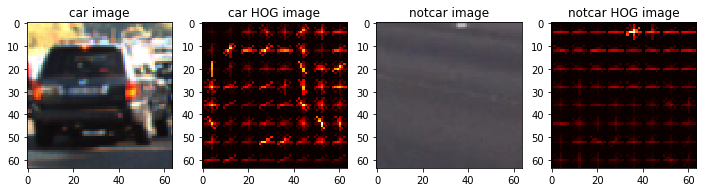

In [4]:
%matplotlib inline

car_ind = np.random.randint(0, len(cars))
notcar_ind = np.random.randint(0, len(notcars))

car_image = mpimg.imread(cars[car_ind])
notcar_image = mpimg.imread(notcars[notcar_ind])

color_space = 'RGB'
orient = 6
pix_per_cell = 8
cell_per_block = 2
hog_channel = 0 
spatial_size = (16,16)
hist_bins = 16
spatial_feat = True
hist_feat = True 
hog_feat = True

car_features, car_hog_image = single_img_features(car_image, color_space=color_space, spatial_size=spatial_size,
                        hist_bins=hist_bins, orient=orient,
                        pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, hog_channel=hog_channel,
                        spatial_feat=spatial_feat, hist_feat=hist_feat, hog_feat=hog_feat, vis=True)
notcar_features, notcar_hog_image = single_img_features(notcar_image, color_space=color_space, spatial_size=spatial_size,
                        hist_bins=hist_bins, orient=orient,
                        pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, hog_channel=hog_channel,
                        spatial_feat=spatial_feat, hist_feat=hist_feat, hog_feat=hog_feat, vis=True)

images = [car_image, car_hog_image, notcar_image, notcar_hog_image]
titles = ['car image', 'car HOG image', 'notcar image', 'notcar HOG image']
fig = plt.figure(figsize=(12,3))
visualize(fig, 1, 4, images, titles)

In [5]:
color_space = 'YCrCb'
orient = 9
pix_per_cell = 8
cell_per_block = 2
hog_channel = 'ALL'
spatial_size = (64, 64)
hist_bins = 32
spatial_feat = True
hist_feat = True
hog_feat = True

t = time.time()
n_samples = 1000
random_idxs = np.random.randint(0, len(cars), n_samples)
test_cars = cars #np.array(cars)[random_idxs]
test_notcars = notcars #np.array(notcars)[random_idxs]

car_features = extract_features(test_cars, color_space=color_space, spatial_size=spatial_size,
                        hist_bins=hist_bins, orient=orient,
                        pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, hog_channel=hog_channel,
                        spatial_feat=spatial_feat, hist_feat=hist_feat, hog_feat=hog_feat)
notcar_features = extract_features(test_notcars, color_space=color_space, spatial_size=spatial_size,
                        hist_bins=hist_bins, orient=orient,
                        pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, hog_channel=hog_channel,
                        spatial_feat=spatial_feat, hist_feat=hist_feat, hog_feat=hog_feat)

print(time.time()-t, 'Seconds to compute features...')

X = np.vstack((car_features, notcar_features)).astype(np.float64)
X_scaler = StandardScaler().fit(X)
scaled_X = X_scaler.transform(X)

y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))

rand_state = np.random.randint(0, 100)
X_train, X_test, y_train, y_test = train_test_split(
    scaled_X, y, test_size=0.1, random_state=rand_state)

print('Using:',orient,'orientations,',pix_per_cell,
     'pixels per cell, ', cell_per_block, 'cells per block, ',
     hist_bins, 'histogram bins, and', spatial_size, 'spatial sampling')
print('Feature vector length:', len(X_train[0]))

svc = LinearSVC()

t=time.time()
svc.fit(X_train, y_train)
print(round(time.time()-t, 2), 'Seconds to train SVC...')
print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))


96.35904622077942 Seconds to compute features...
Using: 9 orientations, 8 pixels per cell,  2 cells per block,  32 histogram bins, and (64, 64) spatial sampling
Feature vector length: 17676
76.35 Seconds to train SVC...
Test Accuracy of SVC =  0.9927


0.0 1.0
0.7242097854614258 seconds to process one image searching 100 windows
0.0 1.0
0.531451940536499 seconds to process one image searching 100 windows
0.0 1.0
0.5380251407623291 seconds to process one image searching 100 windows
0.0 1.0
0.5254149436950684 seconds to process one image searching 100 windows
0.0 1.0
0.5158488750457764 seconds to process one image searching 100 windows
0.0 1.0
0.5455138683319092 seconds to process one image searching 100 windows


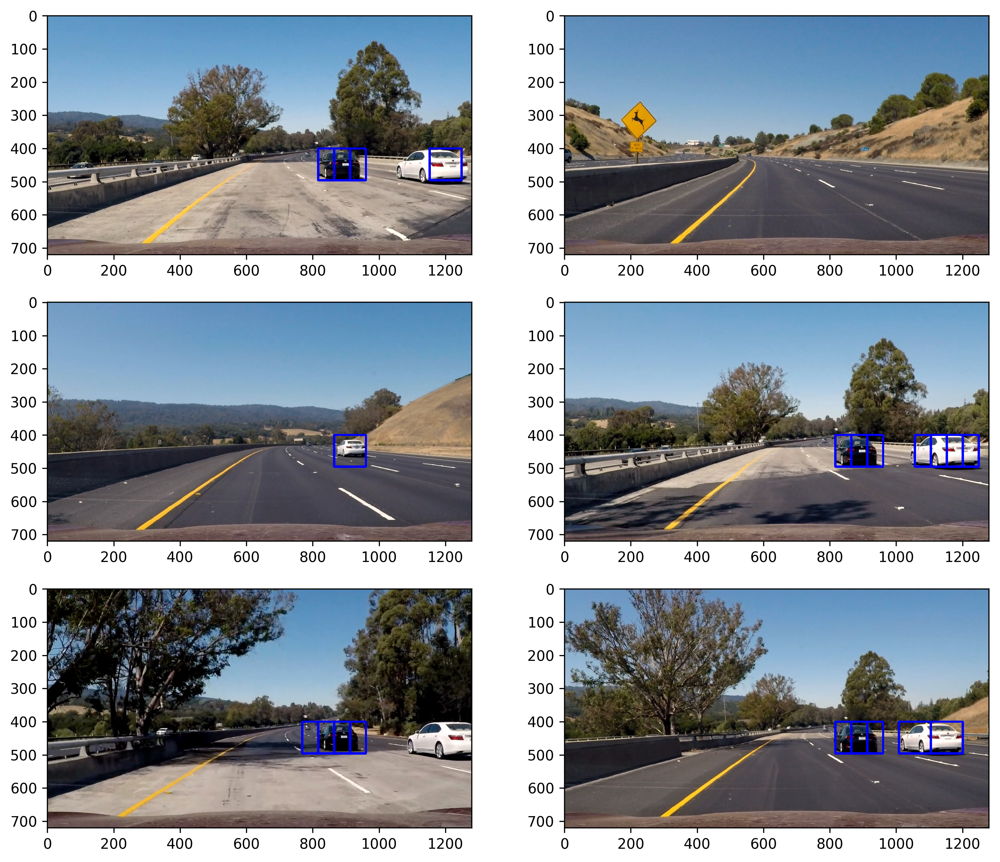

In [6]:
searchpath = 'test_images/*'
example_images = glob.glob(searchpath)
images = []
titles = []
y_start_stop = [400, 656]
overlap = 0.5
for img_src in example_images:
    t1 = time.time()
    img = mpimg.imread(img_src)
    draw_img = np.copy(img)
    img = img.astype(np.float32)/255
    print(np.min(img), np.max(img))

    windows = slide_window(img, x_start_stop=[None, None], y_start_stop=y_start_stop,
                        xy_window=(96, 96), xy_overlap=(overlap, overlap))

    hot_windows = search_windows(img, windows, svc, X_scaler, color_space=color_space,
                            spatial_size=spatial_size, hist_bins=hist_bins,
                            orient=orient, pix_per_cell=pix_per_cell,
                            cell_per_block=cell_per_block,
                            hog_channel=hog_channel, spatial_feat=spatial_feat,
                            hist_feat=hist_feat, hog_feat=hog_feat)

    window_img = draw_boxes(draw_img, hot_windows, color=(0,0,255), thick=6)
    images.append(window_img)
    titles.append('')
    print(time.time()-t1, 'seconds to process one image searching', len(windows), 'windows')

fig = plt.figure(figsize=(12,18), dpi=300)
visualize(fig, 5, 2, images, titles)

In [7]:
def convert_color(img, conv='RGB2YCrCb'):
    if conv == 'RGB2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    if conv == 'BGR2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    if conv == 'RGB2LUV':
        return cv2.cvtColor(img, cv2.COLOR_RGB2LUV)

0.5433268547058105 seconds to run, total windows =  294
0.7622339725494385 seconds to run, total windows =  294
0.8487939834594727 seconds to run, total windows =  294
0.4813508987426758 seconds to run, total windows =  294
0.4582059383392334 seconds to run, total windows =  294
0.492218017578125 seconds to run, total windows =  294


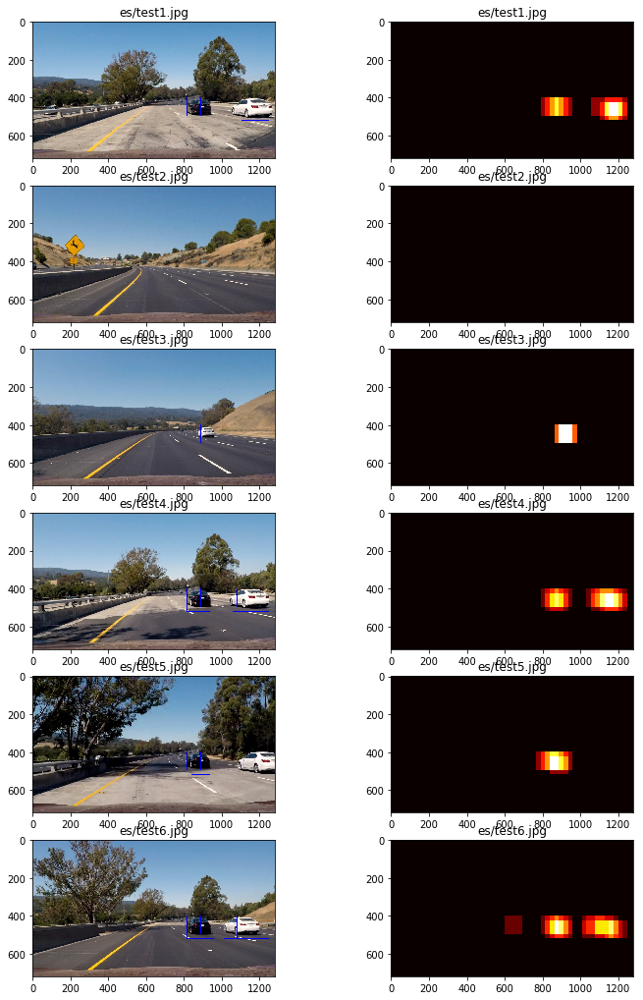

In [8]:
out_images = []
out_maps = []
out_titles = []
out_boxes = []

ystart = 400
ystop = 656
scale = 1.5
    
for img_src in example_images:
    img_boxes = []
    t = time.time()
    count = 0
    img = mpimg.imread(img_src)
    draw_img = np.copy(img)
    heatmap = np.zeros_like(img[:,:,0])
    img = img.astype(np.float32)/255
    
    img_tosearch = img[ystart:ystop,:, :]
    ctrans_tosearch = convert_color(img_tosearch, conv='RGB2YCrCb')
    if scale != 1:
        imshape= ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
        
    ch1 = ctrans_tosearch[:,:,0]
    ch2 = ctrans_tosearch[:,:,1]
    ch3 = ctrans_tosearch[:,:,2]
    
    nxblocks = (ch1.shape[1] // pix_per_cell) - 1
    nyblocks = (ch1.shape[0] // pix_per_cell) - 1
    nfeat_per_block = orient*cell_per_block**2
    window = 64
    nblocks_per_window = (window // pix_per_cell) - 1
    cells_per_step = 2
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step
    
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)
    
    for xb in range(nxsteps):
        for yb in range(nysteps):
            count += 1
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))
            
            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell
            
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))
            
            spatial_features = bin_spatial(subimg, size=spatial_size)
            hist_features = color_hist(subimg, nbins=hist_bins)
            
            test_features = X_scaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1))
            test_prediction = svc.predict(test_features)
            
            if test_prediction == 1:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                cv2.rectangle(draw_img,(xbox_left, ytop_draw+ystart), (xbox_left+win_draw, ytop_draw+win_draw+ystart), (0,0,255))
                img_boxes.append(((xbox_left, ytop_draw+ystart), (xbox_left+win_draw,ytop_draw+win_draw+ystart)))
                heatmap[ytop_draw+ystart:ytop_draw+win_draw+ystart, xbox_left:xbox_left+win_draw] += 1
                
    print(time.time()-t, 'seconds to run, total windows = ', count)
    
    out_images.append(draw_img)
    out_titles.append(img_src[-12:])
    out_titles.append(img_src[-12:])
    out_images.append(heatmap)
    out_maps.append(heatmap)
    out_boxes.append(img_boxes)
    
fig = plt.figure(figsize=(12,24))
visualize(fig, 8, 2, out_images, out_titles)

0.47263097763061523 seconds to run, total windows =  304
0.2855679988861084 seconds to run, total windows =  196
0.21471095085144043 seconds to run, total windows =  144


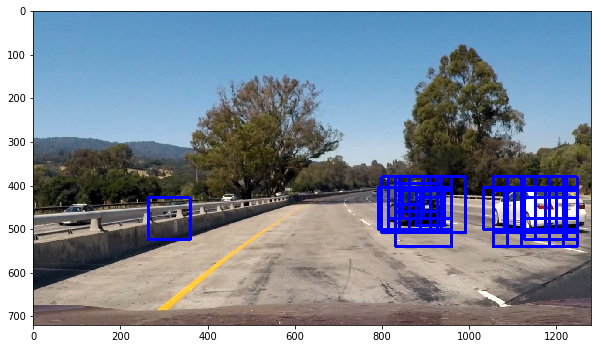

In [9]:
def find_cars (img, ystart, ystop, window, conv, orient, pix_per_cell, cell_per_block, scale):
    img_boxes = []
    t = time.time()
    count = 0
    draw_img = np.copy(img)
    img = img.astype(np.float32)/255
    
    img_tosearch = img[ystart:ystop,:, :]
    ctrans_tosearch = convert_color(img_tosearch, conv=conv)
    if scale != 1:
        imshape= ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
        
    ch1 = ctrans_tosearch[:,:,0]
    ch2 = ctrans_tosearch[:,:,1]
    ch3 = ctrans_tosearch[:,:,2]
    
    nxblocks = (ch1.shape[1] // pix_per_cell) - 1
    nyblocks = (ch1.shape[0] // pix_per_cell) - 1
    nfeat_per_block = orient*cell_per_block**2
    nblocks_per_window = (window // pix_per_cell) - 1
    cells_per_step = 2
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step
    
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)
    
    for xb in range(nxsteps):
        for yb in range(nysteps):
            count += 1
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))
            
            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell
            
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))
            
            spatial_features = bin_spatial(subimg, size=spatial_size)
            hist_features = color_hist(subimg, nbins=hist_bins)
            
            test_features = X_scaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1))
            test_prediction = svc.predict(test_features)
            
            if test_prediction == 1:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                cv2.rectangle(draw_img,(xbox_left, ytop_draw+ystart), (xbox_left+win_draw, ytop_draw+win_draw+ystart), (0,0,255))
                img_boxes.append(((xbox_left, ytop_draw+ystart), (xbox_left+win_draw,ytop_draw+win_draw+ystart)))
                
    print(time.time()-t, 'seconds to run, total windows = ', count)
    return(img_boxes)

car_rectangles = None
out_images = []
out_titles = []
all_rectangles = []
window = 64
orient = 9
pix_per_cell = 8
cell_per_block = 2
conv = 'RGB2YCrCb'
test_img = mpimg.imread('./test_images/test1.jpg')

ystart = 380
ystop = 508
scale = 1.0
car_rectangles = find_cars(test_img, ystart, ystop, window, conv, orient, pix_per_cell, cell_per_block, scale)
all_rectangles.append(car_rectangles)

ystart = 380
ystop = 572
scale = 1.5
car_rectangles = find_cars(test_img, ystart, ystop, window, conv, orient, pix_per_cell, cell_per_block, scale)
all_rectangles.append(car_rectangles)

scale = 2.0
ystart = 380
ystop = 636
scale = 2.0
car_rectangles = find_cars(test_img, ystart, ystop, window, conv, orient, pix_per_cell, cell_per_block, scale)
all_rectangles.append(car_rectangles)

rectangles = [item for sublist in all_rectangles for item in sublist]

img_final = draw_boxes(test_img, rectangles, color=(0,0,255), thick=6)
plt.figure(figsize=(10,10))
plt.imshow(img_final)


In [10]:
def add_heat_deque(heatmap, rectangles_deque):
    # Iterate through list of bboxes
    for bbox_list in rectangles_deque:
        for box in bbox_list:
            # Add += 1 for all pixels inside each bbox
            # Assuming each "box" takes the form ((x1, y1), (x2, y2))
            heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1
    # Return updated heatmap
    return heatmap

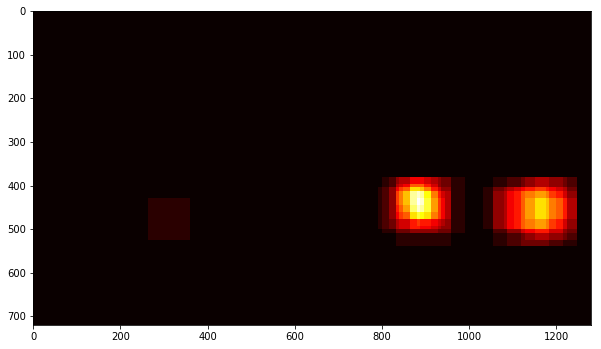

In [11]:
def add_heat(heatmap, bbox_list):
    # Iterate through list of bboxes
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1

    # Return updated heatmap
    return heatmap

heatmap_img = np.zeros_like(test_img[:,:,0])
heatmap_img = add_heat(heatmap_img, rectangles)
plt.figure(figsize=(10,10))
plt.imshow(heatmap_img, cmap='hot')

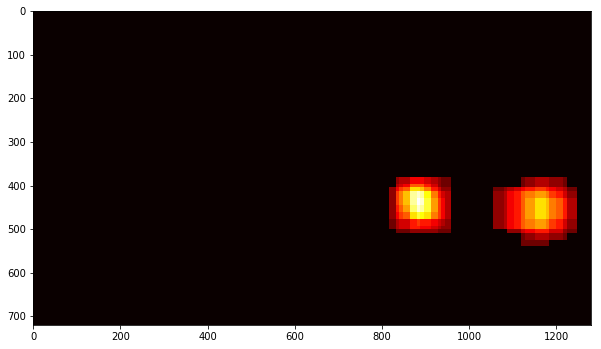

In [12]:
def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap

heatmap_img = apply_threshold(heatmap_img, 2)
plt.figure(figsize=(10,10))
plt.imshow(heatmap_img, cmap='hot')

2 cars found


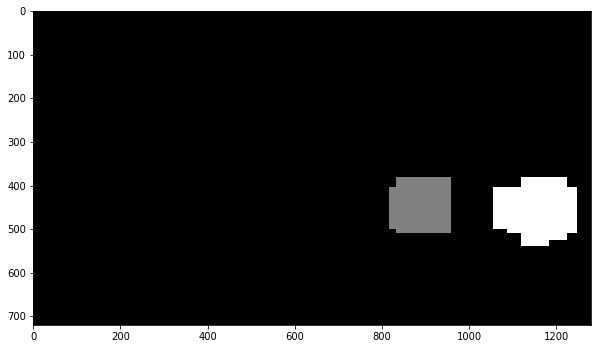

In [13]:
labels = label(heatmap_img)
plt.figure(figsize=(10,10))
plt.imshow(labels[0], cmap='gray')
print(labels[1], 'cars found')

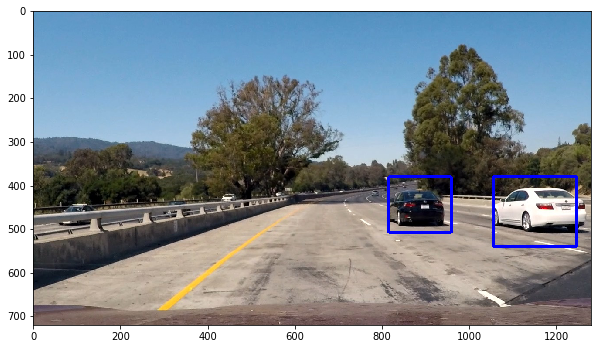

In [14]:
def draw_labeled_bboxes(img, labels):
    # Iterate through all detected cars
    rects = []
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        rects.append(bbox)
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), 6)
    # Return the image and final rectangles
    return img, rects

# Draw bounding boxes on a copy of the image
draw_img, rect = draw_labeled_bboxes(np.copy(test_img), labels)
# Display the image
plt.figure(figsize=(10,10))
plt.imshow(draw_img)

In [36]:


def process_img_pipeline(img):
    car_rectangles = None
    out_images = []
    out_titles = []
    all_rectangles = []
    window = 64
    orient = 9
    pix_per_cell = 8
    cell_per_block = 2
    conv = 'RGB2YCrCb'
    test_img = img

    ystart = 400
    ystop = 528
    scale = 1.0
    car_rectangles = find_cars(test_img, ystart, ystop, window, conv, orient, pix_per_cell, cell_per_block, scale)
    all_rectangles.append(car_rectangles)

    ystart = 400
    ystop = 592
    scale = 1.5
    car_rectangles = find_cars(test_img, ystart, ystop, window, conv, orient, pix_per_cell, cell_per_block, scale)
    all_rectangles.append(car_rectangles)

    scale = 2.0
    ystart = 400
    ystop = 656
    scale = 2.0
    car_rectangles = find_cars(test_img, ystart, ystop, window, conv, orient, pix_per_cell, cell_per_block, scale)
    all_rectangles.append(car_rectangles)

    rectangles = [item for sublist in all_rectangles for item in sublist]
    
    rectangles_deque.append(rectangles)
    heatmap_img = np.zeros_like(test_img[:,:,0])
    heatmap_img = add_heat_deque(heatmap_img, rectangles_deque)
    
    heatmap_img = apply_threshold(heatmap_img,7)
    
    labels = label(heatmap_img)
    
    draw_img, rect = draw_labeled_bboxes(np.copy(test_img), labels)
    
    return draw_img

In [37]:
rectangles_deque = deque(maxlen=8)
clip_out_file = 'test_video_out.mp4'
clip_test = VideoFileClip('test_video.mp4')
clip_test_out = clip_test.fl_image(process_img_pipeline)
%time clip_test_out.write_videofile(clip_out_file, audio=False)

0.36730504035949707 seconds to run, total windows =  304
0.29831981658935547 seconds to run, total windows =  196
0.177048921585083 seconds to run, total windows =  144
[MoviePy] >>>> Building video test_video_out.mp4
[MoviePy] Writing video test_video_out.mp4



  0%|          | 0/39 [00:00<?, ?it/s]

0.4033498764038086 seconds to run, total windows =  304
0.2743191719055176 seconds to run, total windows =  196



  3%|▎         | 1/39 [00:00<00:36,  1.05it/s]

0.24696803092956543 seconds to run, total windows =  144


0.4430861473083496 seconds to run, total windows =  304
0.33308887481689453 seconds to run, total windows =  196
0.18515491485595703 seconds to run, total windows =  144



  5%|▌         | 2/39 [00:01<00:35,  1.03it/s]

0.44744110107421875 seconds to run, total windows =  304



  8%|▊         | 3/39 [00:02<00:34,  1.05it/s]

0.24446988105773926 seconds to run, total windows =  196
0.18030500411987305 seconds to run, total windows =  144


0.3796861171722412 seconds to run, total windows =  304



 10%|█         | 4/39 [00:03<00:31,  1.10it/s]

0.23549699783325195 seconds to run, total windows =  196
0.17159080505371094 seconds to run, total windows =  144


0.3862459659576416 seconds to run, total windows =  304
0.26994895935058594 seconds to run, total windows =  196
0.18256187438964844 seconds to run, total windows =  144



 13%|█▎        | 5/39 [00:04<00:30,  1.11it/s]

0.5734109878540039 seconds to run, total windows =  304
0.3635141849517822 seconds to run, total windows =  196



 15%|█▌        | 6/39 [00:05<00:32,  1.00it/s]

0.2428140640258789 seconds to run, total windows =  144


0.4385108947753906 seconds to run, total windows =  304
0.2523231506347656 seconds to run, total windows =  196
0.1843111515045166 seconds to run, total windows =  144



 18%|█▊        | 7/39 [00:06<00:31,  1.03it/s]

0.3728320598602295 seconds to run, total windows =  304



 21%|██        | 8/39 [00:07<00:28,  1.08it/s]

0.2414100170135498 seconds to run, total windows =  196
0.1798849105834961 seconds to run, total windows =  144


0.379331111907959 seconds to run, total windows =  304



 23%|██▎       | 9/39 [00:08<00:26,  1.11it/s]

0.24335193634033203 seconds to run, total windows =  196
0.17297101020812988 seconds to run, total windows =  144


0.37902379035949707 seconds to run, total windows =  304



 26%|██▌       | 10/39 [00:09<00:25,  1.14it/s]

0.2461857795715332 seconds to run, total windows =  196
0.17992091178894043 seconds to run, total windows =  144


0.39063501358032227 seconds to run, total windows =  304
0.23767900466918945 seconds to run, total windows =  196
0.18454504013061523 seconds to run, total windows =  144



 28%|██▊       | 11/39 [00:10<00:24,  1.15it/s]

0.3769378662109375 seconds to run, total windows =  304
0.24866890907287598 seconds to run, total windows =  196
0.18178391456604004 seconds to run, total windows =  144



 31%|███       | 12/39 [00:10<00:23,  1.16it/s]

0.3652520179748535 seconds to run, total windows =  304
0.24902606010437012 seconds to run, total windows =  196
0.18197894096374512 seconds to run, total windows =  144



 33%|███▎      | 13/39 [00:11<00:22,  1.17it/s]

0.39519309997558594 seconds to run, total windows =  304
0.2427809238433838 seconds to run, total windows =  196
0.19430303573608398 seconds to run, total windows =  144



 36%|███▌      | 14/39 [00:12<00:21,  1.16it/s]

0.3691368103027344 seconds to run, total windows =  304
0.2791140079498291 seconds to run, total windows =  196



 38%|███▊      | 15/39 [00:13<00:20,  1.14it/s]

0.21328210830688477 seconds to run, total windows =  144


0.3610241413116455 seconds to run, total windows =  304



 41%|████      | 16/39 [00:14<00:19,  1.17it/s]

0.2373950481414795 seconds to run, total windows =  196
0.17281699180603027 seconds to run, total windows =  144


0.36359190940856934 seconds to run, total windows =  304



 44%|████▎     | 17/39 [00:15<00:18,  1.19it/s]

0.2458341121673584 seconds to run, total windows =  196
0.17705988883972168 seconds to run, total windows =  144


0.41211605072021484 seconds to run, total windows =  304
0.3549649715423584 seconds to run, total windows =  196



 46%|████▌     | 18/39 [00:16<00:18,  1.11it/s]

0.23238086700439453 seconds to run, total windows =  144


0.6230959892272949 seconds to run, total windows =  304
0.3437998294830322 seconds to run, total windows =  196



 49%|████▊     | 19/39 [00:17<00:20,  1.00s/it]

0.23253417015075684 seconds to run, total windows =  144


0.4455540180206299 seconds to run, total windows =  304
0.3035609722137451 seconds to run, total windows =  196
0.19094014167785645 seconds to run, total windows =  144



 51%|█████▏    | 20/39 [00:18<00:18,  1.00it/s]

0.43370604515075684 seconds to run, total windows =  304
0.28705716133117676 seconds to run, total windows =  196
0.19057703018188477 seconds to run, total windows =  144



 54%|█████▍    | 21/39 [00:19<00:17,  1.01it/s]

0.44601893424987793 seconds to run, total windows =  304
0.29137110710144043 seconds to run, total windows =  196



 56%|█████▋    | 22/39 [00:20<00:16,  1.01it/s]

0.21634721755981445 seconds to run, total windows =  144


0.45786309242248535 seconds to run, total windows =  304
0.2505660057067871 seconds to run, total windows =  196
0.18460702896118164 seconds to run, total windows =  144



 59%|█████▉    | 23/39 [00:21<00:15,  1.02it/s]

0.37662601470947266 seconds to run, total windows =  304



 62%|██████▏   | 24/39 [00:22<00:14,  1.07it/s]

0.24692988395690918 seconds to run, total windows =  196
0.1782369613647461 seconds to run, total windows =  144


0.3629910945892334 seconds to run, total windows =  304
0.23631715774536133 seconds to run, total windows =  196
0.17871308326721191 seconds to run, total windows =  144



 64%|██████▍   | 25/39 [00:22<00:12,  1.11it/s]

0.3666350841522217 seconds to run, total windows =  304



 67%|██████▋   | 26/39 [00:23<00:11,  1.14it/s]

0.2417309284210205 seconds to run, total windows =  196
0.17939496040344238 seconds to run, total windows =  144


0.37961578369140625 seconds to run, total windows =  304
0.2447659969329834 seconds to run, total windows =  196
0.1864631175994873 seconds to run, total windows =  144



 69%|██████▉   | 27/39 [00:24<00:10,  1.15it/s]

0.3767218589782715 seconds to run, total windows =  304
0.27454590797424316 seconds to run, total windows =  196
0.1881730556488037 seconds to run, total windows =  144



 72%|███████▏  | 28/39 [00:25<00:09,  1.15it/s]

0.37786102294921875 seconds to run, total windows =  304
0.252504825592041 seconds to run, total windows =  196
0.18080997467041016 seconds to run, total windows =  144



 74%|███████▍  | 29/39 [00:26<00:08,  1.16it/s]

0.37431812286376953 seconds to run, total windows =  304
0.24217605590820312 seconds to run, total windows =  196
0.18067502975463867 seconds to run, total windows =  144



 77%|███████▋  | 30/39 [00:27<00:07,  1.17it/s]

0.39348602294921875 seconds to run, total windows =  304
0.25037503242492676 seconds to run, total windows =  196
0.1833939552307129 seconds to run, total windows =  144



 79%|███████▉  | 31/39 [00:28<00:06,  1.17it/s]

0.409991979598999 seconds to run, total windows =  304



 82%|████████▏ | 32/39 [00:28<00:05,  1.17it/s]

0.22775697708129883 seconds to run, total windows =  196
0.17010998725891113 seconds to run, total windows =  144


0.3658440113067627 seconds to run, total windows =  304



 85%|████████▍ | 33/39 [00:29<00:05,  1.19it/s]

0.2371678352355957 seconds to run, total windows =  196
0.17743396759033203 seconds to run, total windows =  144


0.379824161529541 seconds to run, total windows =  304
0.2348940372467041 seconds to run, total windows =  196
0.18920612335205078 seconds to run, total windows =  144



 87%|████████▋ | 34/39 [00:30<00:04,  1.19it/s]

0.4397261142730713 seconds to run, total windows =  304
0.2819390296936035 seconds to run, total windows =  196
0.18885016441345215 seconds to run, total windows =  144



 90%|████████▉ | 35/39 [00:31<00:03,  1.13it/s]

0.36719703674316406 seconds to run, total windows =  304
0.24707889556884766 seconds to run, total windows =  196
0.18967318534851074 seconds to run, total windows =  144



 92%|█████████▏| 36/39 [00:32<00:02,  1.15it/s]

0.37128305435180664 seconds to run, total windows =  304



 95%|█████████▍| 37/39 [00:33<00:01,  1.16it/s]

0.2538120746612549 seconds to run, total windows =  196
0.1764059066772461 seconds to run, total windows =  144


0.38806605339050293 seconds to run, total windows =  304
0.23218607902526855 seconds to run, total windows =  196
0.18406891822814941 seconds to run, total windows =  144



 97%|█████████▋| 38/39 [00:34<00:00,  1.17it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_video_out.mp4 

CPU times: user 30.5 s, sys: 2.28 s, total: 32.8 s
Wall time: 35.6 s


In [38]:
rectangles_deque = deque(maxlen=8)
clip_out_file = 'project_video_out.mp4'
clip_test = VideoFileClip('project_video.mp4')
clip_test_out = clip_test.fl_image(process_img_pipeline)
%time clip_test_out.write_videofile(clip_out_file, audio=False)

0.35202693939208984 seconds to run, total windows =  304
0.24184203147888184 seconds to run, total windows =  196
0.1750180721282959 seconds to run, total windows =  144
[MoviePy] >>>> Building video project_video_out.mp4
[MoviePy] Writing video project_video_out.mp4



  0%|          | 0/1261 [00:00<?, ?it/s]

0.43393993377685547 seconds to run, total windows =  304



  0%|          | 1/1261 [00:00<18:19,  1.15it/s]

0.2404308319091797 seconds to run, total windows =  196
0.18012309074401855 seconds to run, total windows =  144


0.37963414192199707 seconds to run, total windows =  304



  0%|          | 2/1261 [00:01<17:59,  1.17it/s]

0.24509501457214355 seconds to run, total windows =  196
0.1745131015777588 seconds to run, total windows =  144


0.38719797134399414 seconds to run, total windows =  304



  0%|          | 3/1261 [00:02<18:03,  1.16it/s]

0.27685093879699707 seconds to run, total windows =  196
0.17938995361328125 seconds to run, total windows =  144


0.3969578742980957 seconds to run, total windows =  304



  0%|          | 4/1261 [00:03<18:02,  1.16it/s]

0.24583697319030762 seconds to run, total windows =  196
0.1887040138244629 seconds to run, total windows =  144


0.3812718391418457 seconds to run, total windows =  304



  0%|          | 5/1261 [00:04<17:48,  1.18it/s]

0.2397148609161377 seconds to run, total windows =  196
0.17897605895996094 seconds to run, total windows =  144


0.373974084854126 seconds to run, total windows =  304



  0%|          | 6/1261 [00:05<17:34,  1.19it/s]

0.2471461296081543 seconds to run, total windows =  196
0.17210698127746582 seconds to run, total windows =  144


0.37549614906311035 seconds to run, total windows =  304



  1%|          | 7/1261 [00:05<17:22,  1.20it/s]

0.2405848503112793 seconds to run, total windows =  196
0.1739201545715332 seconds to run, total windows =  144


0.3843679428100586 seconds to run, total windows =  304



  1%|          | 8/1261 [00:06<17:24,  1.20it/s]

0.2623460292816162 seconds to run, total windows =  196
0.17261719703674316 seconds to run, total windows =  144


0.37549710273742676 seconds to run, total windows =  304



  1%|          | 9/1261 [00:07<17:19,  1.20it/s]

0.24633097648620605 seconds to run, total windows =  196
0.17804193496704102 seconds to run, total windows =  144


0.4047548770904541 seconds to run, total windows =  304



  1%|          | 10/1261 [00:08<17:28,  1.19it/s]

0.2450730800628662 seconds to run, total windows =  196
0.18448305130004883 seconds to run, total windows =  144


0.3841691017150879 seconds to run, total windows =  304
0.27554988861083984 seconds to run, total windows =  196



  1%|          | 11/1261 [00:09<18:02,  1.15it/s]

0.23791098594665527 seconds to run, total windows =  144


0.49744296073913574 seconds to run, total windows =  304



  1%|          | 12/1261 [00:10<18:39,  1.12it/s]

0.2597329616546631 seconds to run, total windows =  196
0.18392705917358398 seconds to run, total windows =  144


0.4000539779663086 seconds to run, total windows =  304



  1%|          | 13/1261 [00:11<18:28,  1.13it/s]

0.26950716972351074 seconds to run, total windows =  196
0.1729278564453125 seconds to run, total windows =  144


0.38558483123779297 seconds to run, total windows =  304
0.24616503715515137 seconds to run, total windows =  196



  1%|          | 14/1261 [00:12<18:21,  1.13it/s]

0.21047210693359375 seconds to run, total windows =  144


0.3817558288574219 seconds to run, total windows =  304



  1%|          | 15/1261 [00:12<17:59,  1.15it/s]

0.24129486083984375 seconds to run, total windows =  196
0.18027305603027344 seconds to run, total windows =  144


0.3567230701446533 seconds to run, total windows =  304



  1%|▏         | 16/1261 [00:13<17:35,  1.18it/s]

0.24334120750427246 seconds to run, total windows =  196
0.1806797981262207 seconds to run, total windows =  144


0.37679195404052734 seconds to run, total windows =  304



  1%|▏         | 17/1261 [00:14<17:25,  1.19it/s]

0.24080300331115723 seconds to run, total windows =  196
0.1842639446258545 seconds to run, total windows =  144


0.3644709587097168 seconds to run, total windows =  304



  1%|▏         | 18/1261 [00:15<17:18,  1.20it/s]

0.24445796012878418 seconds to run, total windows =  196
0.1872999668121338 seconds to run, total windows =  144


0.37657690048217773 seconds to run, total windows =  304



  2%|▏         | 19/1261 [00:16<17:22,  1.19it/s]

0.2558879852294922 seconds to run, total windows =  196
0.1894998550415039 seconds to run, total windows =  144


0.376492977142334 seconds to run, total windows =  304



  2%|▏         | 20/1261 [00:16<17:14,  1.20it/s]

0.2368009090423584 seconds to run, total windows =  196
0.1819009780883789 seconds to run, total windows =  144


0.35752010345458984 seconds to run, total windows =  304



  2%|▏         | 21/1261 [00:17<17:05,  1.21it/s]

0.24077796936035156 seconds to run, total windows =  196
0.18877100944519043 seconds to run, total windows =  144


0.37142086029052734 seconds to run, total windows =  304



  2%|▏         | 22/1261 [00:18<17:02,  1.21it/s]

0.2503678798675537 seconds to run, total windows =  196
0.17435979843139648 seconds to run, total windows =  144


0.37378382682800293 seconds to run, total windows =  304



  2%|▏         | 23/1261 [00:19<17:00,  1.21it/s]

0.23775196075439453 seconds to run, total windows =  196
0.18715906143188477 seconds to run, total windows =  144


0.37026190757751465 seconds to run, total windows =  304



  2%|▏         | 24/1261 [00:20<16:57,  1.22it/s]

0.2421889305114746 seconds to run, total windows =  196
0.18043303489685059 seconds to run, total windows =  144


0.3672468662261963 seconds to run, total windows =  304



  2%|▏         | 25/1261 [00:21<16:57,  1.21it/s]

0.24342799186706543 seconds to run, total windows =  196
0.18822503089904785 seconds to run, total windows =  144


0.3639659881591797 seconds to run, total windows =  304



  2%|▏         | 26/1261 [00:21<16:49,  1.22it/s]

0.23415088653564453 seconds to run, total windows =  196
0.17814993858337402 seconds to run, total windows =  144


0.3834421634674072 seconds to run, total windows =  304



  2%|▏         | 27/1261 [00:22<16:53,  1.22it/s]

0.24979114532470703 seconds to run, total windows =  196
0.1739940643310547 seconds to run, total windows =  144


0.369920015335083 seconds to run, total windows =  304



  2%|▏         | 28/1261 [00:23<16:49,  1.22it/s]

0.2398240566253662 seconds to run, total windows =  196
0.18316888809204102 seconds to run, total windows =  144


0.35903501510620117 seconds to run, total windows =  304
0.2657780647277832 seconds to run, total windows =  196
0.20966291427612305


  2%|▏         | 29/1261 [00:24<17:05,  1.20it/s]

 seconds to run, total windows =  144
0.4579429626464844 seconds to run, total windows =  304



  2%|▏         | 30/1261 [00:25<17:39,  1.16it/s]

0.25734400749206543 seconds to run, total windows =  196
0.1860058307647705 seconds to run, total windows =  144


0.3708951473236084 seconds to run, total windows =  304



  2%|▏         | 31/1261 [00:26<17:25,  1.18it/s]

0.2539341449737549 seconds to run, total windows =  196
0.17253613471984863 seconds to run, total windows =  144


0.37314295768737793 seconds to run, total windows =  304
0.24648714065551758 seconds to run, total windows =  196
0.19722795486450195 seconds to run, total windows =  144



  3%|▎         | 32/1261 [00:26<17:20,  1.18it/s]

0.3652341365814209 seconds to run, total windows =  304



  3%|▎         | 33/1261 [00:27<17:05,  1.20it/s]

0.23615312576293945 seconds to run, total windows =  196
0.1802670955657959 seconds to run, total windows =  144


0.3661160469055176 seconds to run, total windows =  304



  3%|▎         | 34/1261 [00:28<16:48,  1.22it/s]

0.22977399826049805 seconds to run, total windows =  196
0.17293000221252441 seconds to run, total windows =  144


0.36215901374816895 seconds to run, total windows =  304



  3%|▎         | 35/1261 [00:29<16:39,  1.23it/s]

0.2389509677886963 seconds to run, total windows =  196
0.17648005485534668 seconds to run, total windows =  144


0.37304091453552246 seconds to run, total windows =  304



  3%|▎         | 36/1261 [00:30<16:36,  1.23it/s]

0.2429368495941162 seconds to run, total windows =  196
0.1704421043395996 seconds to run, total windows =  144


0.3605799674987793 seconds to run, total windows =  304



  3%|▎         | 37/1261 [00:31<16:33,  1.23it/s]

0.24174189567565918 seconds to run, total windows =  196
0.17973995208740234 seconds to run, total windows =  144


0.3673899173736572 seconds to run, total windows =  304



  3%|▎         | 38/1261 [00:31<16:38,  1.23it/s]

0.24712395668029785 seconds to run, total windows =  196
0.19016098976135254 seconds to run, total windows =  144


0.3584871292114258 seconds to run, total windows =  304



  3%|▎         | 39/1261 [00:32<16:34,  1.23it/s]

0.25232696533203125 seconds to run, total windows =  196
0.17194414138793945 seconds to run, total windows =  144


0.36868906021118164 seconds to run, total windows =  304



  3%|▎         | 40/1261 [00:33<16:37,  1.22it/s]

0.2524740695953369 seconds to run, total windows =  196
0.1792759895324707 seconds to run, total windows =  144


0.368319034576416 seconds to run, total windows =  304



  3%|▎         | 41/1261 [00:34<16:35,  1.23it/s]

0.24077415466308594 seconds to run, total windows =  196
0.17742919921875 seconds to run, total windows =  144


0.3597540855407715 seconds to run, total windows =  304



  3%|▎         | 42/1261 [00:35<16:30,  1.23it/s]

0.2380821704864502 seconds to run, total windows =  196
0.186676025390625 seconds to run, total windows =  144


0.4003570079803467 seconds to run, total windows =  304



  3%|▎         | 43/1261 [00:35<16:42,  1.21it/s]

0.23592090606689453 seconds to run, total windows =  196
0.18178200721740723 seconds to run, total windows =  144


0.3662228584289551 seconds to run, total windows =  304



  3%|▎         | 44/1261 [00:36<16:37,  1.22it/s]

0.23868703842163086 seconds to run, total windows =  196
0.18169498443603516 seconds to run, total windows =  144


0.36527419090270996 seconds to run, total windows =  304



  4%|▎         | 45/1261 [00:37<16:36,  1.22it/s]

0.2382059097290039 seconds to run, total windows =  196
0.1889040470123291 seconds to run, total windows =  144


0.3769419193267822 seconds to run, total windows =  304



  4%|▎         | 46/1261 [00:38<16:35,  1.22it/s]

0.23781991004943848 seconds to run, total windows =  196
0.18089795112609863 seconds to run, total windows =  144


0.38228392601013184 seconds to run, total windows =  304
0.2589271068572998 seconds to run, total windows =  196



  4%|▎         | 47/1261 [00:39<17:07,  1.18it/s]

0.246567964553833 seconds to run, total windows =  144


0.419727087020874 seconds to run, total windows =  304



  4%|▍         | 48/1261 [00:40<17:24,  1.16it/s]

0.2705850601196289 seconds to run, total windows =  196
0.17881417274475098 seconds to run, total windows =  144


0.4237079620361328 seconds to run, total windows =  304



  4%|▍         | 49/1261 [00:41<17:37,  1.15it/s]

0.26594996452331543 seconds to run, total windows =  196
0.18534588813781738 seconds to run, total windows =  144


0.3885641098022461 seconds to run, total windows =  304



  4%|▍         | 50/1261 [00:41<17:25,  1.16it/s]

0.24234986305236816 seconds to run, total windows =  196
0.1891491413116455 seconds to run, total windows =  144


0.36411094665527344 seconds to run, total windows =  304



  4%|▍         | 51/1261 [00:42<17:11,  1.17it/s]

0.24928808212280273 seconds to run, total windows =  196
0.17642903327941895 seconds to run, total windows =  144


0.38094377517700195 seconds to run, total windows =  304



  4%|▍         | 52/1261 [00:43<17:06,  1.18it/s]

0.24277997016906738 seconds to run, total windows =  196
0.18851709365844727 seconds to run, total windows =  144


0.3768808841705322 seconds to run, total windows =  304



  4%|▍         | 53/1261 [00:44<16:59,  1.18it/s]

0.24273419380187988 seconds to run, total windows =  196
0.18053197860717773 seconds to run, total windows =  144


0.38425707817077637 seconds to run, total windows =  304



  4%|▍         | 54/1261 [00:45<16:55,  1.19it/s]

0.24750804901123047 seconds to run, total windows =  196
0.17910194396972656 seconds to run, total windows =  144


0.38817691802978516 seconds to run, total windows =  304



  4%|▍         | 55/1261 [00:46<16:54,  1.19it/s]

0.2511329650878906 seconds to run, total windows =  196
0.17545580863952637 seconds to run, total windows =  144


0.38324594497680664 seconds to run, total windows =  304



  4%|▍         | 56/1261 [00:46<16:45,  1.20it/s]

0.2322070598602295 seconds to run, total windows =  196
0.18283486366271973 seconds to run, total windows =  144


0.40204286575317383 seconds to run, total windows =  304



  5%|▍         | 57/1261 [00:47<16:52,  1.19it/s]

0.2482891082763672 seconds to run, total windows =  196
0.177476167678833 seconds to run, total windows =  144


0.3838369846343994 seconds to run, total windows =  304



  5%|▍         | 58/1261 [00:48<16:52,  1.19it/s]

0.2538609504699707 seconds to run, total windows =  196
0.18250513076782227 seconds to run, total windows =  144


0.38742709159851074 seconds to run, total windows =  304



  5%|▍         | 59/1261 [00:49<16:50,  1.19it/s]

0.24805903434753418 seconds to run, total windows =  196
0.1827850341796875 seconds to run, total windows =  144


0.3764331340789795 seconds to run, total windows =  304
0.23885083198547363 seconds to run, total windows =  196



  5%|▍         | 60/1261 [00:50<16:54,  1.18it/s]

0.21235299110412598 seconds to run, total windows =  144


0.3884241580963135 seconds to run, total windows =  304



  5%|▍         | 61/1261 [00:51<16:50,  1.19it/s]

0.24650001525878906 seconds to run, total windows =  196
0.17709994316101074 seconds to run, total windows =  144


0.38791584968566895 seconds to run, total windows =  304



  5%|▍         | 62/1261 [00:52<17:00,  1.17it/s]

0.27575016021728516 seconds to run, total windows =  196
0.17985105514526367 seconds to run, total windows =  144


0.38461804389953613 seconds to run, total windows =  304



  5%|▍         | 63/1261 [00:52<16:52,  1.18it/s]

0.23536396026611328 seconds to run, total windows =  196
0.1791532039642334 seconds to run, total windows =  144


0.39857006072998047 seconds to run, total windows =  304



  5%|▌         | 64/1261 [00:53<16:56,  1.18it/s]

0.24878811836242676 seconds to run, total windows =  196
0.18102502822875977 seconds to run, total windows =  144


0.39082908630371094 seconds to run, total windows =  304
0.3281221389770508 seconds to run, total windows =  196



  5%|▌         | 65/1261 [00:54<17:35,  1.13it/s]

0.21401596069335938 seconds to run, total windows =  144


0.40889787673950195 seconds to run, total windows =  304



  5%|▌         | 66/1261 [00:55<17:26,  1.14it/s]

0.24936604499816895 seconds to run, total windows =  196
0.17729496955871582 seconds to run, total windows =  144


0.41971397399902344 seconds to run, total windows =  304



  5%|▌         | 67/1261 [00:56<17:24,  1.14it/s]

0.24926304817199707 seconds to run, total windows =  196
0.17938899993896484 seconds to run, total windows =  144


0.3776838779449463 seconds to run, total windows =  304



  5%|▌         | 68/1261 [00:57<17:12,  1.16it/s]

0.24605798721313477 seconds to run, total windows =  196
0.18401718139648438 seconds to run, total windows =  144


0.37881994247436523 seconds to run, total windows =  304



  5%|▌         | 69/1261 [00:58<17:00,  1.17it/s]

0.23956894874572754 seconds to run, total windows =  196
0.17373108863830566 seconds to run, total windows =  144


0.37752819061279297 seconds to run, total windows =  304



  6%|▌         | 70/1261 [00:58<16:52,  1.18it/s]

0.23689699172973633 seconds to run, total windows =  196
0.18206286430358887 seconds to run, total windows =  144


0.3972799777984619 seconds to run, total windows =  304



  6%|▌         | 71/1261 [00:59<16:42,  1.19it/s]

0.23261618614196777 seconds to run, total windows =  196
0.17015314102172852 seconds to run, total windows =  144


0.38065505027770996 seconds to run, total windows =  304



  6%|▌         | 72/1261 [01:00<16:35,  1.19it/s]

0.2453141212463379 seconds to run, total windows =  196
0.17823410034179688 seconds to run, total windows =  144


0.389707088470459 seconds to run, total windows =  304



  6%|▌         | 73/1261 [01:01<16:36,  1.19it/s]

0.23040485382080078 seconds to run, total windows =  196
0.17624592781066895 seconds to run, total windows =  144


0.40647196769714355 seconds to run, total windows =  304



  6%|▌         | 74/1261 [01:02<16:36,  1.19it/s]

0.23682594299316406 seconds to run, total windows =  196
0.17635107040405273 seconds to run, total windows =  144


0.40389108657836914 seconds to run, total windows =  304



  6%|▌         | 75/1261 [01:03<16:36,  1.19it/s]

0.2456669807434082 seconds to run, total windows =  196
0.16608810424804688 seconds to run, total windows =  144


0.3794379234313965 seconds to run, total windows =  304



  6%|▌         | 76/1261 [01:03<16:27,  1.20it/s]

0.23337817192077637 seconds to run, total windows =  196
0.18065595626831055 seconds to run, total windows =  144


0.37841200828552246 seconds to run, total windows =  304



  6%|▌         | 77/1261 [01:04<16:22,  1.21it/s]

0.24329495429992676 seconds to run, total windows =  196
0.17531299591064453 seconds to run, total windows =  144


0.3898799419403076 seconds to run, total windows =  304



  6%|▌         | 78/1261 [01:05<16:28,  1.20it/s]

0.24506592750549316 seconds to run, total windows =  196
0.17553997039794922 seconds to run, total windows =  144


0.4072871208190918 seconds to run, total windows =  304



  6%|▋         | 79/1261 [01:06<16:41,  1.18it/s]

0.2513251304626465 seconds to run, total windows =  196
0.18517088890075684 seconds to run, total windows =  144


0.37984704971313477 seconds to run, total windows =  304



  6%|▋         | 80/1261 [01:07<16:35,  1.19it/s]

0.2446129322052002 seconds to run, total windows =  196
0.1833820343017578 seconds to run, total windows =  144


0.36359214782714844 seconds to run, total windows =  304



  6%|▋         | 81/1261 [01:08<16:20,  1.20it/s]

0.23844408988952637 seconds to run, total windows =  196
0.1687638759613037 seconds to run, total windows =  144


0.3998548984527588 seconds to run, total windows =  304
0.2530181407928467 seconds to run, total windows =  196
0.20168399810791016


  7%|▋         | 82/1261 [01:08<16:36,  1.18it/s]

 seconds to run, total windows =  144
0.44568395614624023 seconds to run, total windows =  304
0.2821540832519531 seconds to run, total windows =  196



  7%|▋         | 83/1261 [01:09<17:22,  1.13it/s]

0.22096800804138184 seconds to run, total windows =  144


0.37347984313964844 seconds to run, total windows =  304



  7%|▋         | 84/1261 [01:10<17:05,  1.15it/s]

0.2493300437927246 seconds to run, total windows =  196
0.19313502311706543 seconds to run, total windows =  144


0.38457393646240234 seconds to run, total windows =  304



  7%|▋         | 85/1261 [01:11<16:57,  1.16it/s]

0.2626371383666992 seconds to run, total windows =  196
0.17251300811767578 seconds to run, total windows =  144


0.3814568519592285 seconds to run, total windows =  304



  7%|▋         | 86/1261 [01:12<16:39,  1.18it/s]

0.23549795150756836 seconds to run, total windows =  196
0.18026113510131836 seconds to run, total windows =  144


0.36945605278015137 seconds to run, total windows =  304



  7%|▋         | 87/1261 [01:13<16:22,  1.19it/s]

0.2339038848876953 seconds to run, total windows =  196
0.17806577682495117 seconds to run, total windows =  144


0.4216041564941406 seconds to run, total windows =  304



  7%|▋         | 88/1261 [01:14<16:37,  1.18it/s]

0.25946593284606934 seconds to run, total windows =  196
0.1768779754638672 seconds to run, total windows =  144


0.38569092750549316 seconds to run, total windows =  304



  7%|▋         | 89/1261 [01:14<16:36,  1.18it/s]

0.2547609806060791 seconds to run, total windows =  196
0.18479704856872559 seconds to run, total windows =  144


0.3798818588256836 seconds to run, total windows =  304



  7%|▋         | 90/1261 [01:15<16:27,  1.19it/s]

0.2381877899169922 seconds to run, total windows =  196
0.18362903594970703 seconds to run, total windows =  144


0.39136791229248047 seconds to run, total windows =  304



  7%|▋         | 91/1261 [01:16<16:28,  1.18it/s]

0.25580501556396484 seconds to run, total windows =  196
0.173875093460083 seconds to run, total windows =  144


0.38623619079589844 seconds to run, total windows =  304
0.24430394172668457 seconds to run, total windows =  196
0.18970799446105957 seconds to run, total windows =  144



  7%|▋         | 92/1261 [01:17<16:26,  1.19it/s]

0.3689308166503906 seconds to run, total windows =  304



  7%|▋         | 93/1261 [01:18<16:13,  1.20it/s]

0.22945618629455566 seconds to run, total windows =  196
0.18022704124450684 seconds to run, total windows =  144


0.3809640407562256 seconds to run, total windows =  304



  7%|▋         | 94/1261 [01:19<16:07,  1.21it/s]

0.24480390548706055 seconds to run, total windows =  196
0.17282605171203613 seconds to run, total windows =  144


0.3666250705718994 seconds to run, total windows =  304



  8%|▊         | 95/1261 [01:19<16:01,  1.21it/s]

0.24909496307373047 seconds to run, total windows =  196
0.1773078441619873 seconds to run, total windows =  144


0.3734281063079834 seconds to run, total windows =  304



  8%|▊         | 96/1261 [01:20<15:56,  1.22it/s]

0.2378239631652832 seconds to run, total windows =  196
0.18095898628234863 seconds to run, total windows =  144


0.4034459590911865 seconds to run, total windows =  304



  8%|▊         | 97/1261 [01:21<16:07,  1.20it/s]

0.2513699531555176 seconds to run, total windows =  196
0.1762540340423584 seconds to run, total windows =  144


0.37660694122314453 seconds to run, total windows =  304



  8%|▊         | 98/1261 [01:22<16:02,  1.21it/s]

0.23501276969909668 seconds to run, total windows =  196
0.1872878074645996 seconds to run, total windows =  144


0.38350415229797363 seconds to run, total windows =  304



  8%|▊         | 99/1261 [01:23<16:00,  1.21it/s]

0.24097108840942383 seconds to run, total windows =  196
0.1753230094909668 seconds to run, total windows =  144


0.38109302520751953 seconds to run, total windows =  304



  8%|▊         | 100/1261 [01:24<16:08,  1.20it/s]

0.2642021179199219 seconds to run, total windows =  196
0.1777029037475586 seconds to run, total windows =  144


0.41608119010925293 seconds to run, total windows =  304



  8%|▊         | 101/1261 [01:25<17:11,  1.12it/s]

0.3302750587463379 seconds to run, total windows =  196
0.177962064743042 seconds to run, total windows =  144


0.4064059257507324 seconds to run, total windows =  304
0.2728910446166992 seconds to run, total windows =  196
0.19064593315124512 seconds to run, total windows =  144



  8%|▊         | 102/1261 [01:26<17:16,  1.12it/s]

0.38623905181884766 seconds to run, total windows =  304



  8%|▊         | 103/1261 [01:26<16:51,  1.14it/s]

0.23516416549682617 seconds to run, total windows =  196
0.17534494400024414 seconds to run, total windows =  144


0.40012502670288086 seconds to run, total windows =  304



  8%|▊         | 104/1261 [01:27<16:42,  1.15it/s]

0.24608898162841797 seconds to run, total windows =  196
0.179779052734375 seconds to run, total windows =  144


0.3804631233215332 seconds to run, total windows =  304



  8%|▊         | 105/1261 [01:28<16:26,  1.17it/s]

0.2448279857635498 seconds to run, total windows =  196
0.17610406875610352 seconds to run, total windows =  144


0.40114307403564453 seconds to run, total windows =  304



  8%|▊         | 106/1261 [01:29<16:20,  1.18it/s]

0.2382030487060547 seconds to run, total windows =  196
0.17421722412109375 seconds to run, total windows =  144


0.38641881942749023 seconds to run, total windows =  304



  8%|▊         | 107/1261 [01:30<16:20,  1.18it/s]

0.25588393211364746 seconds to run, total windows =  196
0.18131208419799805 seconds to run, total windows =  144


0.3777148723602295 seconds to run, total windows =  304



  9%|▊         | 108/1261 [01:31<16:10,  1.19it/s]

0.24443507194519043 seconds to run, total windows =  196
0.17725706100463867 seconds to run, total windows =  144


0.3960387706756592 seconds to run, total windows =  304



  9%|▊         | 109/1261 [01:31<16:10,  1.19it/s]

0.2476968765258789 seconds to run, total windows =  196
0.1805710792541504 seconds to run, total windows =  144


0.3956429958343506 seconds to run, total windows =  304



  9%|▊         | 110/1261 [01:32<16:13,  1.18it/s]

0.25229907035827637 seconds to run, total windows =  196
0.17630600929260254 seconds to run, total windows =  144


0.38028597831726074 seconds to run, total windows =  304



  9%|▉         | 111/1261 [01:33<16:03,  1.19it/s]

0.23495697975158691 seconds to run, total windows =  196
0.17306804656982422 seconds to run, total windows =  144


0.4047279357910156 seconds to run, total windows =  304



  9%|▉         | 112/1261 [01:34<16:07,  1.19it/s]

0.2471179962158203 seconds to run, total windows =  196
0.17495393753051758 seconds to run, total windows =  144


0.3831770420074463 seconds to run, total windows =  304



  9%|▉         | 113/1261 [01:35<16:07,  1.19it/s]

0.25025010108947754 seconds to run, total windows =  196
0.1863410472869873 seconds to run, total windows =  144


0.3706789016723633 seconds to run, total windows =  304



  9%|▉         | 114/1261 [01:36<16:01,  1.19it/s]

0.25566983222961426 seconds to run, total windows =  196
0.17822813987731934 seconds to run, total windows =  144


0.38947010040283203 seconds to run, total windows =  304



  9%|▉         | 115/1261 [01:36<16:11,  1.18it/s]

0.2522909641265869 seconds to run, total windows =  196
0.1888270378112793 seconds to run, total windows =  144


0.35582900047302246 seconds to run, total windows =  304



  9%|▉         | 116/1261 [01:37<16:08,  1.18it/s]

0.2553741931915283 seconds to run, total windows =  196
0.18903303146362305 seconds to run, total windows =  144


0.3693699836730957 seconds to run, total windows =  304



  9%|▉         | 117/1261 [01:38<16:01,  1.19it/s]

0.24965405464172363 seconds to run, total windows =  196
0.1807551383972168 seconds to run, total windows =  144


0.41671013832092285 seconds to run, total windows =  304
0.29224705696105957 seconds to run, total windows =  196
0.20070385932922363


  9%|▉         | 118/1261 [01:39<16:36,  1.15it/s]

 seconds to run, total windows =  144
0.42447686195373535 seconds to run, total windows =  304



  9%|▉         | 119/1261 [01:40<16:52,  1.13it/s]

0.2514660358428955 seconds to run, total windows =  196
0.187269926071167 seconds to run, total windows =  144


0.4257349967956543 seconds to run, total windows =  304



 10%|▉         | 120/1261 [01:41<16:50,  1.13it/s]

0.23860597610473633 seconds to run, total windows =  196
0.18231916427612305 seconds to run, total windows =  144


0.38437485694885254 seconds to run, total windows =  304



 10%|▉         | 121/1261 [01:42<16:32,  1.15it/s]

0.2490100860595703 seconds to run, total windows =  196
0.1681060791015625 seconds to run, total windows =  144


0.3842430114746094 seconds to run, total windows =  304



 10%|▉         | 122/1261 [01:43<16:16,  1.17it/s]

0.23902511596679688 seconds to run, total windows =  196
0.17854785919189453 seconds to run, total windows =  144


0.392225980758667 seconds to run, total windows =  304



 10%|▉         | 123/1261 [01:43<16:07,  1.18it/s]

0.2393941879272461 seconds to run, total windows =  196
0.18036103248596191 seconds to run, total windows =  144


0.37685704231262207 seconds to run, total windows =  304



 10%|▉         | 124/1261 [01:44<15:59,  1.18it/s]

0.24660801887512207 seconds to run, total windows =  196
0.17511606216430664 seconds to run, total windows =  144


0.3794829845428467 seconds to run, total windows =  304



 10%|▉         | 125/1261 [01:45<15:58,  1.19it/s]

0.25066089630126953 seconds to run, total windows =  196
0.18876194953918457 seconds to run, total windows =  144


0.3846709728240967 seconds to run, total windows =  304



 10%|▉         | 126/1261 [01:46<15:49,  1.20it/s]

0.2341020107269287 seconds to run, total windows =  196
0.1725151538848877 seconds to run, total windows =  144


0.37431812286376953 seconds to run, total windows =  304



 10%|█         | 127/1261 [01:47<15:44,  1.20it/s]

0.24811792373657227 seconds to run, total windows =  196
0.17879891395568848 seconds to run, total windows =  144


0.3935999870300293 seconds to run, total windows =  304



 10%|█         | 128/1261 [01:48<15:47,  1.20it/s]

0.2400038242340088 seconds to run, total windows =  196
0.1804518699645996 seconds to run, total windows =  144


0.37328004837036133 seconds to run, total windows =  304



 10%|█         | 129/1261 [01:48<15:42,  1.20it/s]

0.23908305168151855 seconds to run, total windows =  196
0.18341684341430664 seconds to run, total windows =  144


0.4158639907836914 seconds to run, total windows =  304



 10%|█         | 130/1261 [01:49<15:58,  1.18it/s]

0.2669050693511963 seconds to run, total windows =  196
0.17389988899230957 seconds to run, total windows =  144


0.37994384765625 seconds to run, total windows =  304



 10%|█         | 131/1261 [01:50<15:51,  1.19it/s]

0.24096393585205078 seconds to run, total windows =  196
0.1845870018005371 seconds to run, total windows =  144


0.41214489936828613 seconds to run, total windows =  304
0.24025797843933105 seconds to run, total windows =  196
0.19166088104248047 seconds to run, total windows =  144



 10%|█         | 132/1261 [01:51<16:01,  1.17it/s]

0.4095339775085449 seconds to run, total windows =  304



 11%|█         | 133/1261 [01:52<16:07,  1.17it/s]

0.24736809730529785 seconds to run, total windows =  196
0.18679213523864746 seconds to run, total windows =  144


0.3870360851287842 seconds to run, total windows =  304



 11%|█         | 134/1261 [01:53<16:03,  1.17it/s]

0.26284003257751465 seconds to run, total windows =  196
0.1784989833831787 seconds to run, total windows =  144


0.39104199409484863 seconds to run, total windows =  304



 11%|█         | 135/1261 [01:54<16:02,  1.17it/s]

0.24768996238708496 seconds to run, total windows =  196
0.1857149600982666 seconds to run, total windows =  144


0.46483707427978516 seconds to run, total windows =  304
0.27091503143310547 seconds to run, total windows =  196



 11%|█         | 136/1261 [01:54<16:43,  1.12it/s]

0.21863889694213867 seconds to run, total windows =  144


0.4006521701812744 seconds to run, total windows =  304



 11%|█         | 137/1261 [01:55<16:38,  1.13it/s]

0.2683141231536865 seconds to run, total windows =  196
0.18433690071105957 seconds to run, total windows =  144


0.3921639919281006 seconds to run, total windows =  304



 11%|█         | 138/1261 [01:56<16:22,  1.14it/s]

0.2469618320465088 seconds to run, total windows =  196
0.17651987075805664 seconds to run, total windows =  144


0.3892860412597656 seconds to run, total windows =  304



 11%|█         | 139/1261 [01:57<16:09,  1.16it/s]

0.24866390228271484 seconds to run, total windows =  196
0.18006610870361328 seconds to run, total windows =  144


0.37188100814819336 seconds to run, total windows =  304



 11%|█         | 140/1261 [01:58<15:55,  1.17it/s]

0.2467348575592041 seconds to run, total windows =  196
0.18062996864318848 seconds to run, total windows =  144


0.39537906646728516 seconds to run, total windows =  304
0.24728107452392578 seconds to run, total windows =  196
0.18988394737243652 seconds to run, total windows =  144



 11%|█         | 141/1261 [01:59<15:57,  1.17it/s]

0.3689711093902588 seconds to run, total windows =  304



 11%|█▏        | 142/1261 [02:00<15:39,  1.19it/s]

0.23445606231689453 seconds to run, total windows =  196
0.17763996124267578 seconds to run, total windows =  144


0.4020090103149414 seconds to run, total windows =  304



 11%|█▏        | 143/1261 [02:00<15:42,  1.19it/s]

0.2423720359802246 seconds to run, total windows =  196
0.184096097946167 seconds to run, total windows =  144


0.3683450222015381 seconds to run, total windows =  304



 11%|█▏        | 144/1261 [02:01<15:33,  1.20it/s]

0.2440810203552246 seconds to run, total windows =  196
0.17466092109680176 seconds to run, total windows =  144


0.3844590187072754 seconds to run, total windows =  304
0.2431027889251709 seconds to run, total windows =  196
0.18981194496154785 seconds to run, total windows =  144



 11%|█▏        | 145/1261 [02:02<15:34,  1.19it/s]

0.373729944229126 seconds to run, total windows =  304



 12%|█▏        | 146/1261 [02:03<15:27,  1.20it/s]

0.24260711669921875 seconds to run, total windows =  196
0.18137097358703613 seconds to run, total windows =  144


0.3870530128479004 seconds to run, total windows =  304



 12%|█▏        | 147/1261 [02:04<15:27,  1.20it/s]

0.2507610321044922 seconds to run, total windows =  196
0.17433810234069824 seconds to run, total windows =  144


0.3800787925720215 seconds to run, total windows =  304



 12%|█▏        | 148/1261 [02:05<15:28,  1.20it/s]

0.26044487953186035 seconds to run, total windows =  196
0.1770031452178955 seconds to run, total windows =  144


0.3883850574493408 seconds to run, total windows =  304



 12%|█▏        | 149/1261 [02:05<15:27,  1.20it/s]

0.2406020164489746 seconds to run, total windows =  196
0.1806950569152832 seconds to run, total windows =  144


0.3893458843231201 seconds to run, total windows =  304



 12%|█▏        | 150/1261 [02:06<15:30,  1.19it/s]

0.25353193283081055 seconds to run, total windows =  196
0.17322301864624023 seconds to run, total windows =  144


0.38120293617248535 seconds to run, total windows =  304



 12%|█▏        | 151/1261 [02:07<15:32,  1.19it/s]

0.2465360164642334 seconds to run, total windows =  196
0.17591595649719238 seconds to run, total windows =  144


0.3849029541015625 seconds to run, total windows =  304



 12%|█▏        | 152/1261 [02:08<15:29,  1.19it/s]

0.24321913719177246 seconds to run, total windows =  196
0.18310093879699707 seconds to run, total windows =  144


0.3813331127166748 seconds to run, total windows =  304
0.26680707931518555 seconds to run, total windows =  196



 12%|█▏        | 153/1261 [02:09<15:56,  1.16it/s]

0.23575282096862793 seconds to run, total windows =  144


0.43675804138183594 seconds to run, total windows =  304



 12%|█▏        | 154/1261 [02:10<16:20,  1.13it/s]

0.27738499641418457 seconds to run, total windows =  196
0.18882012367248535 seconds to run, total windows =  144


0.41054701805114746 seconds to run, total windows =  304



 12%|█▏        | 155/1261 [02:11<16:17,  1.13it/s]

0.26149797439575195 seconds to run, total windows =  196
0.17978692054748535 seconds to run, total windows =  144


0.3870720863342285 seconds to run, total windows =  304



 12%|█▏        | 156/1261 [02:11<16:06,  1.14it/s]

0.25304198265075684 seconds to run, total windows =  196
0.1826469898223877 seconds to run, total windows =  144


0.41533803939819336 seconds to run, total windows =  304



 12%|█▏        | 157/1261 [02:12<16:04,  1.15it/s]

0.24675416946411133 seconds to run, total windows =  196
0.17914104461669922 seconds to run, total windows =  144


0.3819098472595215 seconds to run, total windows =  304



 13%|█▎        | 158/1261 [02:13<16:06,  1.14it/s]

0.2881150245666504 seconds to run, total windows =  196
0.1796278953552246 seconds to run, total windows =  144


0.40779805183410645 seconds to run, total windows =  304



 13%|█▎        | 159/1261 [02:14<16:00,  1.15it/s]

0.24840593338012695 seconds to run, total windows =  196
0.17912602424621582 seconds to run, total windows =  144


0.41744089126586914 seconds to run, total windows =  304



 13%|█▎        | 160/1261 [02:15<15:59,  1.15it/s]

0.2287919521331787 seconds to run, total windows =  196
0.18765497207641602 seconds to run, total windows =  144


0.3640279769897461 seconds to run, total windows =  304



 13%|█▎        | 161/1261 [02:16<15:36,  1.17it/s]

0.2376091480255127 seconds to run, total windows =  196
0.1725149154663086 seconds to run, total windows =  144


0.3847980499267578 seconds to run, total windows =  304
0.24907684326171875 seconds to run, total windows =  196



 13%|█▎        | 162/1261 [02:17<15:47,  1.16it/s]

0.22277593612670898 seconds to run, total windows =  144


0.377871036529541 seconds to run, total windows =  304
0.22990202903747559 seconds to run, total windows =  196
0.19089889526367188 seconds to run, total windows =  144



 13%|█▎        | 163/1261 [02:18<15:38,  1.17it/s]

0.35352087020874023 seconds to run, total windows =  304



 13%|█▎        | 164/1261 [02:18<15:20,  1.19it/s]

0.24906206130981445 seconds to run, total windows =  196
0.1726360321044922 seconds to run, total windows =  144


0.38414907455444336 seconds to run, total windows =  304



 13%|█▎        | 165/1261 [02:19<15:17,  1.19it/s]

0.2444629669189453 seconds to run, total windows =  196
0.18039417266845703 seconds to run, total windows =  144


0.3799569606781006 seconds to run, total windows =  304



 13%|█▎        | 166/1261 [02:20<15:18,  1.19it/s]

0.2473740577697754 seconds to run, total windows =  196
0.1835801601409912 seconds to run, total windows =  144


0.37833404541015625 seconds to run, total windows =  304



 13%|█▎        | 167/1261 [02:21<15:16,  1.19it/s]

0.2502470016479492 seconds to run, total windows =  196
0.1797628402709961 seconds to run, total windows =  144


0.40054893493652344 seconds to run, total windows =  304



 13%|█▎        | 168/1261 [02:22<15:25,  1.18it/s]

0.24715209007263184 seconds to run, total windows =  196
0.1793670654296875 seconds to run, total windows =  144


0.3930702209472656 seconds to run, total windows =  304
0.23747897148132324 seconds to run, total windows =  196
0.18799901008605957 seconds to run, total windows =  144



 13%|█▎        | 169/1261 [02:23<15:23,  1.18it/s]

0.3765850067138672 seconds to run, total windows =  304



 13%|█▎        | 170/1261 [02:23<15:21,  1.18it/s]

0.24869608879089355 seconds to run, total windows =  196
0.1730940341949463 seconds to run, total windows =  144


0.4546518325805664 seconds to run, total windows =  304
0.29254603385925293 seconds to run, total windows =  196



 14%|█▎        | 171/1261 [02:24<16:09,  1.12it/s]

0.2138378620147705 seconds to run, total windows =  144


0.3873739242553711 seconds to run, total windows =  304
0.2549598217010498 seconds to run, total windows =  196
0.1898050308227539 seconds to run, total windows =  144



 14%|█▎        | 172/1261 [02:25<15:58,  1.14it/s]

0.40427279472351074 seconds to run, total windows =  304



 14%|█▎        | 173/1261 [02:26<15:52,  1.14it/s]

0.23371291160583496 seconds to run, total windows =  196
0.18409299850463867 seconds to run, total windows =  144


0.3792250156402588 seconds to run, total windows =  304



 14%|█▍        | 174/1261 [02:27<15:43,  1.15it/s]

0.25597286224365234 seconds to run, total windows =  196
0.17830491065979004 seconds to run, total windows =  144


0.3807098865509033 seconds to run, total windows =  304



 14%|█▍        | 175/1261 [02:28<15:28,  1.17it/s]

0.2429649829864502 seconds to run, total windows =  196
0.1750938892364502 seconds to run, total windows =  144


0.3845350742340088 seconds to run, total windows =  304
0.2335038185119629 seconds to run, total windows =  196
0.18679380416870117 seconds to run, total windows =  144



 14%|█▍        | 176/1261 [02:29<15:19,  1.18it/s]

0.3847160339355469 seconds to run, total windows =  304
0.24902606010437012 seconds to run, total windows =  196
0.18852806091308594 seconds to run, total windows =  144



 14%|█▍        | 177/1261 [02:29<15:19,  1.18it/s]

0.3812730312347412 seconds to run, total windows =  304



 14%|█▍        | 178/1261 [02:30<15:15,  1.18it/s]

0.24590015411376953 seconds to run, total windows =  196
0.1772160530090332 seconds to run, total windows =  144


0.38966894149780273 seconds to run, total windows =  304



 14%|█▍        | 179/1261 [02:31<15:16,  1.18it/s]

0.24092602729797363 seconds to run, total windows =  196
0.18507003784179688 seconds to run, total windows =  144


0.3922309875488281 seconds to run, total windows =  304



 14%|█▍        | 180/1261 [02:32<15:14,  1.18it/s]

0.2388598918914795 seconds to run, total windows =  196
0.18009305000305176 seconds to run, total windows =  144


0.365372896194458 seconds to run, total windows =  304



 14%|█▍        | 181/1261 [02:33<15:01,  1.20it/s]

0.23734283447265625 seconds to run, total windows =  196
0.1766831874847412 seconds to run, total windows =  144


0.4030890464782715 seconds to run, total windows =  304



 14%|█▍        | 182/1261 [02:34<15:10,  1.19it/s]

0.23683595657348633 seconds to run, total windows =  196
0.18565988540649414 seconds to run, total windows =  144


0.37351393699645996 seconds to run, total windows =  304



 15%|█▍        | 183/1261 [02:34<14:59,  1.20it/s]

0.2339038848876953 seconds to run, total windows =  196
0.17766714096069336 seconds to run, total windows =  144


0.3697800636291504 seconds to run, total windows =  304
0.24782395362854004 seconds to run, total windows =  196
0.18745899200439453 seconds to run, total windows =  144



 15%|█▍        | 184/1261 [02:35<15:03,  1.19it/s]

0.39055895805358887 seconds to run, total windows =  304



 15%|█▍        | 185/1261 [02:36<15:01,  1.19it/s]

0.23900794982910156 seconds to run, total windows =  196
0.17673301696777344 seconds to run, total windows =  144


0.3784658908843994 seconds to run, total windows =  304



 15%|█▍        | 186/1261 [02:37<14:56,  1.20it/s]

0.23844099044799805 seconds to run, total windows =  196
0.17680692672729492 seconds to run, total windows =  144


0.37597084045410156 seconds to run, total windows =  304



 15%|█▍        | 187/1261 [02:38<14:58,  1.20it/s]

0.24774909019470215 seconds to run, total windows =  196
0.18087100982666016 seconds to run, total windows =  144


0.3801231384277344 seconds to run, total windows =  304
0.31252002716064453 seconds to run, total windows =  196



 15%|█▍        | 188/1261 [02:39<15:52,  1.13it/s]

0.280886173248291 seconds to run, total windows =  144


0.47298693656921387 seconds to run, total windows =  304
0.2670478820800781 seconds to run, total windows =  196
0.19586896896362305 seconds to run, total windows =  144


 15%|█▍        | 189/1261 [02:40<16:27,  1.09it/s]


0.50052809715271 seconds to run, total windows =  304
0.2911100387573242 seconds to run, total windows =  196
0.19423413276672363 seconds to run, total windows =  144



 15%|█▌        | 190/1261 [02:41<17:08,  1.04it/s]

0.5334279537200928 seconds to run, total windows =  304
0.2675180435180664 seconds to run, total windows =  196
0.19454598426818848 seconds to run, total windows = 


 15%|█▌        | 191/1261 [02:42<17:34,  1.01it/s]

 144
0.4439680576324463 seconds to run, total windows =  304
0.2990751266479492 seconds to run, total windows =  196
0.19045495986938477 seconds to run, total windows =  144



 15%|█▌        | 192/1261 [02:43<17:29,  1.02it/s]

0.4482560157775879 seconds to run, total windows =  304
0.33258509635925293 seconds to run, total windows =  196



 15%|█▌        | 193/1261 [02:44<17:59,  1.01s/it]

0.22017621994018555 seconds to run, total windows =  144


0.39495396614074707 seconds to run, total windows =  304



 15%|█▌        | 194/1261 [02:45<17:05,  1.04it/s]

0.2414999008178711 seconds to run, total windows =  196
0.17336082458496094 seconds to run, total windows =  144


0.3801419734954834 seconds to run, total windows =  304



 15%|█▌        | 195/1261 [02:46<16:16,  1.09it/s]

0.23495817184448242 seconds to run, total windows =  196
0.17204499244689941 seconds to run, total windows =  144


0.37852001190185547 seconds to run, total windows =  304



 16%|█▌        | 196/1261 [02:46<15:45,  1.13it/s]

0.23115110397338867 seconds to run, total windows =  196
0.18232393264770508 seconds to run, total windows =  144


0.3673110008239746 seconds to run, total windows =  304



 16%|█▌        | 197/1261 [02:47<15:17,  1.16it/s]

0.2383120059967041 seconds to run, total windows =  196
0.17298221588134766 seconds to run, total windows =  144


0.38497018814086914 seconds to run, total windows =  304



 16%|█▌        | 198/1261 [02:48<15:07,  1.17it/s]

0.23456311225891113 seconds to run, total windows =  196
0.1844470500946045 seconds to run, total windows =  144


0.4062528610229492 seconds to run, total windows =  304



 16%|█▌        | 199/1261 [02:49<15:11,  1.16it/s]

0.24906492233276367 seconds to run, total windows =  196
0.18499493598937988 seconds to run, total windows =  144


0.4133129119873047 seconds to run, total windows =  304



 16%|█▌        | 200/1261 [02:50<15:21,  1.15it/s]

0.24273896217346191 seconds to run, total windows =  196
0.17684197425842285 seconds to run, total windows =  144


0.40892601013183594 seconds to run, total windows =  304



 16%|█▌        | 201/1261 [02:51<15:14,  1.16it/s]

0.2445840835571289 seconds to run, total windows =  196
0.16996312141418457 seconds to run, total windows =  144


0.3842790126800537 seconds to run, total windows =  304
0.2576730251312256 seconds to run, total windows =  196
0.18418502807617188 seconds to run, total windows =  144



 16%|█▌        | 202/1261 [02:52<15:11,  1.16it/s]

0.35510897636413574 seconds to run, total windows =  304
0.23843097686767578 seconds to run, total windows =  196
0.18825387954711914 seconds to run, total windows =  144



 16%|█▌        | 203/1261 [02:52<14:53,  1.18it/s]

0.38451099395751953 seconds to run, total windows =  304



 16%|█▌        | 204/1261 [02:53<14:51,  1.19it/s]

0.24645614624023438 seconds to run, total windows =  196
0.176008939743042 seconds to run, total windows =  144


0.3946988582611084 seconds to run, total windows =  304
0.3015880584716797 seconds to run, total windows =  196



 16%|█▋        | 205/1261 [02:54<15:26,  1.14it/s]

0.22707796096801758 seconds to run, total windows =  144


0.4190640449523926 seconds to run, total windows =  304



 16%|█▋        | 206/1261 [02:55<15:26,  1.14it/s]

0.2440659999847412 seconds to run, total windows =  196
0.18339896202087402 seconds to run, total windows =  144


0.39420008659362793 seconds to run, total windows =  304



 16%|█▋        | 207/1261 [02:56<15:12,  1.16it/s]

0.23294687271118164 seconds to run, total windows =  196
0.17350387573242188 seconds to run, total windows =  144


0.3968780040740967 seconds to run, total windows =  304
0.2507350444793701 seconds to run, total windows =  196
0.18654608726501465 seconds to run, total windows =  144



 16%|█▋        | 208/1261 [02:57<15:08,  1.16it/s]

0.37866711616516113 seconds to run, total windows =  304



 17%|█▋        | 209/1261 [02:58<14:57,  1.17it/s]

0.24289202690124512 seconds to run, total windows =  196
0.17629313468933105 seconds to run, total windows =  144


0.39328694343566895 seconds to run, total windows =  304



 17%|█▋        | 210/1261 [02:58<14:58,  1.17it/s]

0.24972295761108398 seconds to run, total windows =  196
0.17989087104797363 seconds to run, total windows =  144


0.3953700065612793 seconds to run, total windows =  304



 17%|█▋        | 211/1261 [02:59<14:57,  1.17it/s]

0.24814486503601074 seconds to run, total windows =  196
0.17948603630065918 seconds to run, total windows =  144


0.38845396041870117 seconds to run, total windows =  304



 17%|█▋        | 212/1261 [03:00<14:49,  1.18it/s]

0.23384618759155273 seconds to run, total windows =  196
0.17618107795715332 seconds to run, total windows =  144


0.3852200508117676 seconds to run, total windows =  304



 17%|█▋        | 213/1261 [03:01<14:41,  1.19it/s]

0.23142409324645996 seconds to run, total windows =  196
0.17868781089782715 seconds to run, total windows =  144


0.3737919330596924 seconds to run, total windows =  304



 17%|█▋        | 214/1261 [03:02<14:40,  1.19it/s]

0.25517797470092773 seconds to run, total windows =  196
0.1750960350036621 seconds to run, total windows =  144


0.38253092765808105 seconds to run, total windows =  304



 17%|█▋        | 215/1261 [03:03<14:39,  1.19it/s]

0.24152493476867676 seconds to run, total windows =  196
0.18340086936950684 seconds to run, total windows =  144


0.3930990695953369 seconds to run, total windows =  304



 17%|█▋        | 216/1261 [03:03<14:37,  1.19it/s]

0.2309260368347168 seconds to run, total windows =  196
0.18341684341430664 seconds to run, total windows =  144


0.37854909896850586 seconds to run, total windows =  304



 17%|█▋        | 217/1261 [03:04<14:40,  1.19it/s]

0.2660501003265381 seconds to run, total windows =  196
0.18227410316467285 seconds to run, total windows =  144


0.3931920528411865 seconds to run, total windows =  304



 17%|█▋        | 218/1261 [03:05<14:45,  1.18it/s]

0.24964094161987305 seconds to run, total windows =  196
0.18393206596374512 seconds to run, total windows =  144


0.3819870948791504 seconds to run, total windows =  304



 17%|█▋        | 219/1261 [03:06<14:41,  1.18it/s]

0.23653697967529297 seconds to run, total windows =  196
0.1840810775756836 seconds to run, total windows =  144


0.41415905952453613 seconds to run, total windows =  304



 17%|█▋        | 220/1261 [03:07<14:45,  1.18it/s]

0.24366307258605957 seconds to run, total windows =  196
0.17696785926818848 seconds to run, total windows =  144


0.390103816986084 seconds to run, total windows =  304



 18%|█▊        | 221/1261 [03:08<14:43,  1.18it/s]

0.251629114151001 seconds to run, total windows =  196
0.17497515678405762 seconds to run, total windows =  144


0.3962991237640381 seconds to run, total windows =  304



 18%|█▊        | 222/1261 [03:09<14:55,  1.16it/s]

0.2777099609375 seconds to run, total windows =  196
0.1831798553466797 seconds to run, total windows =  144


0.45735597610473633 seconds to run, total windows =  304
0.3279299736022949 seconds to run, total windows =  196
0.18917202949523926 seconds to run, total windows =  144



 18%|█▊        | 223/1261 [03:10<15:51,  1.09it/s]

0.4022090435028076 seconds to run, total windows =  304
0.2578001022338867 seconds to run, total windows =  196
0.19117093086242676 seconds to run, total windows =  144



 18%|█▊        | 224/1261 [03:11<15:38,  1.11it/s]

0.3884308338165283 seconds to run, total windows =  304



 18%|█▊        | 225/1261 [03:11<15:15,  1.13it/s]

0.23807191848754883 seconds to run, total windows =  196
0.18147683143615723 seconds to run, total windows =  144


0.3803369998931885 seconds to run, total windows =  304
0.25745105743408203 seconds to run, total windows =  196
0.1918010711669922 seconds to run, total windows =  144



 18%|█▊        | 226/1261 [03:12<15:06,  1.14it/s]

0.4239768981933594 seconds to run, total windows =  304
0.23522591590881348 seconds to run, total windows =  196
0.18818211555480957 seconds to run, total windows =  144



 18%|█▊        | 227/1261 [03:13<15:07,  1.14it/s]

0.3943009376525879 seconds to run, total windows =  304



 18%|█▊        | 228/1261 [03:14<14:54,  1.16it/s]

0.23346686363220215 seconds to run, total windows =  196
0.18050503730773926 seconds to run, total windows =  144


0.3915438652038574 seconds to run, total windows =  304



 18%|█▊        | 229/1261 [03:15<14:46,  1.16it/s]

0.2526412010192871 seconds to run, total windows =  196
0.17322206497192383 seconds to run, total windows =  144


0.3934040069580078 seconds to run, total windows =  304



 18%|█▊        | 230/1261 [03:16<14:41,  1.17it/s]

0.24666786193847656 seconds to run, total windows =  196
0.18069791793823242 seconds to run, total windows =  144


0.371675968170166 seconds to run, total windows =  304
0.24579596519470215 seconds to run, total windows =  196
0.19049286842346191 seconds to run, total windows =  144



 18%|█▊        | 231/1261 [03:16<14:37,  1.17it/s]

0.3699021339416504 seconds to run, total windows =  304



 18%|█▊        | 232/1261 [03:17<14:32,  1.18it/s]

0.24597787857055664 seconds to run, total windows =  196
0.18336105346679688 seconds to run, total windows =  144


0.36810922622680664 seconds to run, total windows =  304



 18%|█▊        | 233/1261 [03:18<14:25,  1.19it/s]

0.2430870532989502 seconds to run, total windows =  196
0.1779041290283203 seconds to run, total windows =  144


0.3753058910369873 seconds to run, total windows =  304
0.2342817783355713 seconds to run, total windows =  196
0.18962407112121582 seconds to run, total windows =  144



 19%|█▊        | 234/1261 [03:19<14:19,  1.19it/s]

0.3597757816314697 seconds to run, total windows =  304



 19%|█▊        | 235/1261 [03:20<14:18,  1.19it/s]

0.24280500411987305 seconds to run, total windows =  196
0.18262696266174316 seconds to run, total windows =  144


0.36899709701538086 seconds to run, total windows =  304



 19%|█▊        | 236/1261 [03:21<14:14,  1.20it/s]

0.23662185668945312 seconds to run, total windows =  196
0.18047785758972168 seconds to run, total windows =  144


0.3787248134613037 seconds to run, total windows =  304
0.23737597465515137 seconds to run, total windows =  196
0.1867201328277588 seconds to run, total windows =  144



 19%|█▉        | 237/1261 [03:21<14:14,  1.20it/s]

0.34595489501953125 seconds to run, total windows =  304



 19%|█▉        | 238/1261 [03:22<14:06,  1.21it/s]

0.24350190162658691 seconds to run, total windows =  196
0.1729731559753418 seconds to run, total windows =  144


0.39073991775512695 seconds to run, total windows =  304



 19%|█▉        | 239/1261 [03:23<14:06,  1.21it/s]

0.23075199127197266 seconds to run, total windows =  196
0.17906808853149414 seconds to run, total windows =  144


0.39150309562683105 seconds to run, total windows =  304
0.29876017570495605 seconds to run, total windows =  196



 19%|█▉        | 240/1261 [03:24<14:39,  1.16it/s]

0.21132898330688477 seconds to run, total windows =  144


0.44995903968811035 seconds to run, total windows =  304
0.23993992805480957 seconds to run, total windows =  196
0.18452095985412598 seconds to run, total windows =  144



 19%|█▉        | 241/1261 [03:25<14:54,  1.14it/s]

0.3778660297393799 seconds to run, total windows =  304



 19%|█▉        | 242/1261 [03:26<14:42,  1.15it/s]

0.248399019241333 seconds to run, total windows =  196
0.17246413230895996 seconds to run, total windows =  144


0.37787818908691406 seconds to run, total windows =  304



 19%|█▉        | 243/1261 [03:27<14:28,  1.17it/s]

0.24251103401184082 seconds to run, total windows =  196
0.1755359172821045 seconds to run, total windows =  144


0.3717629909515381 seconds to run, total windows =  304



 19%|█▉        | 244/1261 [03:27<14:13,  1.19it/s]

0.22808599472045898 seconds to run, total windows =  196
0.18027591705322266 seconds to run, total windows =  144


0.40738511085510254 seconds to run, total windows =  304



 19%|█▉        | 245/1261 [03:28<14:18,  1.18it/s]

0.2505531311035156 seconds to run, total windows =  196
0.17475008964538574 seconds to run, total windows =  144


0.3813319206237793 seconds to run, total windows =  304
0.2424030303955078 seconds to run, total windows =  196
0.18662595748901367 seconds to run, total windows =  144



 20%|█▉        | 246/1261 [03:29<14:15,  1.19it/s]

0.3828880786895752 seconds to run, total windows =  304



 20%|█▉        | 247/1261 [03:30<14:07,  1.20it/s]

0.23182892799377441 seconds to run, total windows =  196
0.17554807662963867 seconds to run, total windows =  144


0.37822580337524414 seconds to run, total windows =  304
0.24675989151000977 seconds to run, total windows =  196
0.1925520896911621 seconds to run, total windows =  144



 20%|█▉        | 248/1261 [03:31<14:09,  1.19it/s]

0.38582682609558105 seconds to run, total windows =  304



 20%|█▉        | 249/1261 [03:32<14:13,  1.19it/s]

0.260329008102417 seconds to run, total windows =  196
0.17679786682128906 seconds to run, total windows =  144


0.39171910285949707 seconds to run, total windows =  304
0.24140405654907227 seconds to run, total windows =  196
0.18742799758911133 seconds to run, total windows =  144



 20%|█▉        | 250/1261 [03:32<14:14,  1.18it/s]

0.38002681732177734 seconds to run, total windows =  304
0.2376570701599121 seconds to run, total windows =  196
0.1885700225830078 seconds to run, total windows =  144



 20%|█▉        | 251/1261 [03:33<14:12,  1.18it/s]

0.41160082817077637 seconds to run, total windows =  304
0.26477599143981934 seconds to run, total windows =  196
0.187514066696167 seconds to run, total windows =  144



 20%|█▉        | 252/1261 [03:34<14:26,  1.16it/s]

0.38413000106811523 seconds to run, total windows =  304
0.2293860912322998 seconds to run, total windows =  196
0.19014692306518555 seconds to run, total windows =  144



 20%|██        | 253/1261 [03:35<14:20,  1.17it/s]

0.4015238285064697 seconds to run, total windows =  304



 20%|██        | 254/1261 [03:36<14:17,  1.17it/s]

0.2364969253540039 seconds to run, total windows =  196
0.1736438274383545 seconds to run, total windows =  144


0.39001917839050293 seconds to run, total windows =  304



 20%|██        | 255/1261 [03:37<14:15,  1.18it/s]

0.24366116523742676 seconds to run, total windows =  196
0.17592501640319824 seconds to run, total windows =  144


0.38252687454223633 seconds to run, total windows =  304
0.2382359504699707 seconds to run, total windows =  196
0.1983959674835205


 20%|██        | 256/1261 [03:38<14:13,  1.18it/s]

 seconds to run, total windows =  144
0.38431382179260254 seconds to run, total windows =  304
0.23958301544189453 seconds to run, total windows =  196
0.1990828514099121


 20%|██        | 257/1261 [03:38<14:12,  1.18it/s]

 seconds to run, total windows =  144
0.44440603256225586 seconds to run, total windows =  304
0.28801512718200684 seconds to run, total windows =  196



 20%|██        | 258/1261 [03:39<14:56,  1.12it/s]

0.23507905006408691 seconds to run, total windows =  144


0.3823659420013428 seconds to run, total windows =  304



 21%|██        | 259/1261 [03:40<14:39,  1.14it/s]

0.25356602668762207 seconds to run, total windows =  196
0.17929792404174805 seconds to run, total windows =  144


0.40238213539123535 seconds to run, total windows =  304



 21%|██        | 260/1261 [03:41<14:32,  1.15it/s]

0.2470569610595703 seconds to run, total windows =  196
0.18363714218139648 seconds to run, total windows =  144


0.3769228458404541 seconds to run, total windows =  304
0.2380681037902832 seconds to run, total windows =  196
0.1811211109161377 seconds to run, total windows =  144



 21%|██        | 261/1261 [03:42<14:19,  1.16it/s]

0.3578200340270996 seconds to run, total windows =  304



 21%|██        | 262/1261 [03:43<13:58,  1.19it/s]

0.23863005638122559 seconds to run, total windows =  196
0.16945910453796387 seconds to run, total windows =  144


0.37428712844848633 seconds to run, total windows =  304
0.23858880996704102 seconds to run, total windows =  196
0.18931913375854492 seconds to run, total windows =  144



 21%|██        | 263/1261 [03:44<13:54,  1.20it/s]

0.3701159954071045 seconds to run, total windows =  304



 21%|██        | 264/1261 [03:44<13:48,  1.20it/s]

0.2398090362548828 seconds to run, total windows =  196
0.17961502075195312 seconds to run, total windows =  144


0.3993351459503174 seconds to run, total windows =  304



 21%|██        | 265/1261 [03:45<13:55,  1.19it/s]

0.25177812576293945 seconds to run, total windows =  196
0.18153786659240723 seconds to run, total windows =  144


0.3691270351409912 seconds to run, total windows =  304



 21%|██        | 266/1261 [03:46<13:46,  1.20it/s]

0.2298879623413086 seconds to run, total windows =  196
0.18543505668640137 seconds to run, total windows =  144


0.3770749568939209 seconds to run, total windows =  304



 21%|██        | 267/1261 [03:47<13:50,  1.20it/s]

0.24322795867919922 seconds to run, total windows =  196
0.18311500549316406 seconds to run, total windows =  144


0.36965394020080566 seconds to run, total windows =  304



 21%|██▏       | 268/1261 [03:48<13:45,  1.20it/s]

0.25008082389831543 seconds to run, total windows =  196
0.17348909378051758 seconds to run, total windows =  144


0.3912360668182373 seconds to run, total windows =  304



 21%|██▏       | 269/1261 [03:49<13:50,  1.19it/s]

0.2515718936920166 seconds to run, total windows =  196
0.1842200756072998 seconds to run, total windows =  144


0.37650012969970703 seconds to run, total windows =  304



 21%|██▏       | 270/1261 [03:49<13:44,  1.20it/s]

0.233198881149292 seconds to run, total windows =  196
0.17836594581604004 seconds to run, total windows =  144


0.37726306915283203 seconds to run, total windows =  304



 21%|██▏       | 271/1261 [03:50<13:41,  1.20it/s]

0.24225616455078125 seconds to run, total windows =  196
0.17520904541015625 seconds to run, total windows =  144


0.3761599063873291 seconds to run, total windows =  304



 22%|██▏       | 272/1261 [03:51<13:39,  1.21it/s]

0.23917293548583984 seconds to run, total windows =  196
0.18358898162841797 seconds to run, total windows =  144


0.388700008392334 seconds to run, total windows =  304



 22%|██▏       | 273/1261 [03:52<13:36,  1.21it/s]

0.2358551025390625 seconds to run, total windows =  196
0.16907501220703125 seconds to run, total windows =  144


0.38605690002441406 seconds to run, total windows =  304



 22%|██▏       | 274/1261 [03:53<13:43,  1.20it/s]

0.2532219886779785 seconds to run, total windows =  196
0.18086600303649902 seconds to run, total windows =  144


0.405487060546875 seconds to run, total windows =  304
0.24805593490600586 seconds to run, total windows =  196
0.1899890899658203 seconds to run, total windows =  144



 22%|██▏       | 275/1261 [03:54<13:54,  1.18it/s]

0.4611630439758301 seconds to run, total windows =  304
0.2844669818878174 seconds to run, total windows =  196



 22%|██▏       | 276/1261 [03:55<14:47,  1.11it/s]

0.2098991870880127 seconds to run, total windows =  144


0.3947131633758545 seconds to run, total windows =  304
0.24171900749206543 seconds to run, total windows =  196
0.19081401824951172 seconds to run, total windows =  144



 22%|██▏       | 277/1261 [03:56<14:32,  1.13it/s]

0.3744018077850342 seconds to run, total windows =  304



 22%|██▏       | 278/1261 [03:56<14:11,  1.15it/s]

0.23796606063842773 seconds to run, total windows =  196
0.17412996292114258 seconds to run, total windows =  144


0.38147997856140137 seconds to run, total windows =  304



 22%|██▏       | 279/1261 [03:57<13:57,  1.17it/s]

0.23702502250671387 seconds to run, total windows =  196
0.17554998397827148 seconds to run, total windows =  144


0.3744220733642578 seconds to run, total windows =  304



 22%|██▏       | 280/1261 [03:58<13:42,  1.19it/s]

0.23087191581726074 seconds to run, total windows =  196
0.17582321166992188 seconds to run, total windows =  144


0.3805549144744873 seconds to run, total windows =  304



 22%|██▏       | 281/1261 [03:59<13:38,  1.20it/s]

0.2435610294342041 seconds to run, total windows =  196
0.17179584503173828 seconds to run, total windows =  144


0.3967411518096924 seconds to run, total windows =  304



 22%|██▏       | 282/1261 [04:00<13:40,  1.19it/s]

0.2442319393157959 seconds to run, total windows =  196
0.1789398193359375 seconds to run, total windows =  144


0.3788609504699707 seconds to run, total windows =  304
0.24741101264953613 seconds to run, total windows =  196
0.1833350658416748 seconds to run, total windows =  144



 22%|██▏       | 283/1261 [04:00<13:43,  1.19it/s]

0.3652150630950928 seconds to run, total windows =  304



 23%|██▎       | 284/1261 [04:01<13:37,  1.20it/s]

0.24849414825439453 seconds to run, total windows =  196
0.17253708839416504 seconds to run, total windows =  144


0.3798060417175293 seconds to run, total windows =  304
0.2575950622558594 seconds to run, total windows =  196
0.1905219554901123 seconds to run, total windows =  144



 23%|██▎       | 285/1261 [04:02<13:41,  1.19it/s]

0.3938710689544678 seconds to run, total windows =  304
0.24353504180908203 seconds to run, total windows =  196
0.18844199180603027 seconds to run, total windows =  144



 23%|██▎       | 286/1261 [04:03<13:44,  1.18it/s]

0.3851630687713623 seconds to run, total windows =  304
0.24274992942810059 seconds to run, total windows =  196
0.1818680763244629 seconds to run, total windows =  144



 23%|██▎       | 287/1261 [04:04<13:44,  1.18it/s]

0.37470316886901855 seconds to run, total windows =  304



 23%|██▎       | 288/1261 [04:05<13:42,  1.18it/s]

0.24758505821228027 seconds to run, total windows =  196
0.18067193031311035 seconds to run, total windows =  144


0.383192777633667 seconds to run, total windows =  304



 23%|██▎       | 289/1261 [04:06<13:35,  1.19it/s]

0.2304539680480957 seconds to run, total windows =  196
0.1849501132965088 seconds to run, total windows =  144


0.36322498321533203 seconds to run, total windows =  304
0.2500338554382324 seconds to run, total windows =  196
0.18213200569152832 seconds to run, total windows =  144



 23%|██▎       | 290/1261 [04:06<13:31,  1.20it/s]

0.3818490505218506 seconds to run, total windows =  304



 23%|██▎       | 291/1261 [04:07<13:38,  1.19it/s]

0.2513089179992676 seconds to run, total windows =  196
0.1811079978942871 seconds to run, total windows =  144


0.40185093879699707 seconds to run, total windows =  304
0.23717689514160156 seconds to run, total windows =  196
0.18483901023864746 seconds to run, total windows =  144



 23%|██▎       | 292/1261 [04:08<13:40,  1.18it/s]

0.4071660041809082 seconds to run, total windows =  304
0.3121669292449951 seconds to run, total windows =  196
0.19545292854309082 seconds to run, total windows =  144



 23%|██▎       | 293/1261 [04:09<14:09,  1.14it/s]

0.4337759017944336 seconds to run, total windows =  304



 23%|██▎       | 294/1261 [04:10<14:06,  1.14it/s]

0.23543190956115723 seconds to run, total windows =  196
0.17560696601867676 seconds to run, total windows =  144


0.4083220958709717 seconds to run, total windows =  304
0.3133249282836914 seconds to run, total windows =  196



 23%|██▎       | 295/1261 [04:11<14:38,  1.10it/s]

0.2288661003112793 seconds to run, total windows =  144


0.4201929569244385 seconds to run, total windows =  304
0.24766993522644043 seconds to run, total windows =  196
0.18639707565307617 seconds to run, total windows =  144



 23%|██▎       | 296/1261 [04:12<14:29,  1.11it/s]

0.391185998916626 seconds to run, total windows =  304
0.31889891624450684 seconds to run, total windows =  196
0.18483209609985352 seconds to run, total windows =  144



 24%|██▎       | 297/1261 [04:13<14:35,  1.10it/s]

0.397672176361084 seconds to run, total windows =  304
0.2440180778503418 seconds to run, total windows =  196
0.19511818885803223 seconds to run, total windows =  144



 24%|██▎       | 298/1261 [04:14<14:25,  1.11it/s]

0.3879048824310303 seconds to run, total windows =  304
0.2436060905456543 seconds to run, total windows =  196



 24%|██▎       | 299/1261 [04:14<14:22,  1.12it/s]

0.22798395156860352 seconds to run, total windows =  144


0.3888399600982666 seconds to run, total windows =  304



 24%|██▍       | 300/1261 [04:15<14:04,  1.14it/s]

0.24697399139404297 seconds to run, total windows =  196
0.17140698432922363 seconds to run, total windows =  144


0.387800931930542 seconds to run, total windows =  304
0.267686128616333 seconds to run, total windows =  196
0.19936490058898926


 24%|██▍       | 301/1261 [04:16<14:06,  1.13it/s]

 seconds to run, total windows =  144
0.3869338035583496 seconds to run, total windows =  304



 24%|██▍       | 302/1261 [04:17<13:55,  1.15it/s]

0.23662710189819336 seconds to run, total windows =  196
0.18389606475830078 seconds to run, total windows =  144


0.3739790916442871 seconds to run, total windows =  304



 24%|██▍       | 303/1261 [04:18<13:44,  1.16it/s]

0.24322009086608887 seconds to run, total windows =  196
0.18254590034484863 seconds to run, total windows =  144


0.3907279968261719 seconds to run, total windows =  304



 24%|██▍       | 304/1261 [04:19<13:43,  1.16it/s]

0.25241804122924805 seconds to run, total windows =  196
0.1845400333404541 seconds to run, total windows =  144


0.4065060615539551 seconds to run, total windows =  304
0.2338848114013672 seconds to run, total windows =  196
0.20443010330200195


 24%|██▍       | 305/1261 [04:20<13:46,  1.16it/s]

 seconds to run, total windows =  144
0.37931394577026367 seconds to run, total windows =  304



 24%|██▍       | 306/1261 [04:20<13:37,  1.17it/s]

0.25060200691223145 seconds to run, total windows =  196
0.18051409721374512 seconds to run, total windows =  144


0.3926389217376709 seconds to run, total windows =  304



 24%|██▍       | 307/1261 [04:21<13:40,  1.16it/s]

0.27237701416015625 seconds to run, total windows =  196
0.17616891860961914 seconds to run, total windows =  144


0.376068115234375 seconds to run, total windows =  304



 24%|██▍       | 308/1261 [04:22<13:30,  1.18it/s]

0.24802303314208984 seconds to run, total windows =  196
0.17840099334716797 seconds to run, total windows =  144


0.37530994415283203 seconds to run, total windows =  304



 25%|██▍       | 309/1261 [04:23<13:22,  1.19it/s]

0.24071812629699707 seconds to run, total windows =  196
0.1828479766845703 seconds to run, total windows =  144


0.3719930648803711 seconds to run, total windows =  304
0.2408750057220459 seconds to run, total windows =  196



 25%|██▍       | 310/1261 [04:24<13:26,  1.18it/s]

0.21621298789978027 seconds to run, total windows =  144


0.4620330333709717 seconds to run, total windows =  304
0.29122495651245117 seconds to run, total windows =  196
0.19377517700195312 seconds to run, total windows =  144



 25%|██▍       | 311/1261 [04:25<14:01,  1.13it/s]

0.3943641185760498 seconds to run, total windows =  304



 25%|██▍       | 312/1261 [04:26<13:55,  1.14it/s]

0.2529170513153076 seconds to run, total windows =  196
0.17964887619018555 seconds to run, total windows =  144


0.4009089469909668 seconds to run, total windows =  304



 25%|██▍       | 313/1261 [04:27<14:01,  1.13it/s]

0.24117588996887207 seconds to run, total windows =  196
0.18131589889526367 seconds to run, total windows =  144


0.39667415618896484 seconds to run, total windows =  304



 25%|██▍       | 314/1261 [04:27<13:50,  1.14it/s]

0.2450239658355713 seconds to run, total windows =  196
0.1791999340057373 seconds to run, total windows =  144


0.38898611068725586 seconds to run, total windows =  304



 25%|██▍       | 315/1261 [04:28<13:43,  1.15it/s]

0.25693607330322266 seconds to run, total windows =  196
0.18132686614990234 seconds to run, total windows =  144


0.3747079372406006 seconds to run, total windows =  304
0.23527312278747559 seconds to run, total windows =  196
0.1913599967956543 seconds to run, total windows =  144



 25%|██▌       | 316/1261 [04:29<13:32,  1.16it/s]

0.3836250305175781 seconds to run, total windows =  304
0.23746395111083984 seconds to run, total windows =  196
0.18166494369506836 seconds to run, total windows =  144



 25%|██▌       | 317/1261 [04:30<13:26,  1.17it/s]

0.36757802963256836 seconds to run, total windows =  304



 25%|██▌       | 318/1261 [04:31<13:17,  1.18it/s]

0.23299121856689453 seconds to run, total windows =  196
0.17523407936096191 seconds to run, total windows =  144


0.3733229637145996 seconds to run, total windows =  304



 25%|██▌       | 319/1261 [04:32<13:07,  1.20it/s]

0.23685693740844727 seconds to run, total windows =  196
0.17690396308898926 seconds to run, total windows =  144


0.38829588890075684 seconds to run, total windows =  304
0.241225004196167 seconds to run, total windows =  196
0.1855628490447998 seconds to run, total windows =  144



 25%|██▌       | 320/1261 [04:32<13:08,  1.19it/s]

0.3768150806427002 seconds to run, total windows =  304



 25%|██▌       | 321/1261 [04:33<13:04,  1.20it/s]

0.24428606033325195 seconds to run, total windows =  196
0.17516493797302246 seconds to run, total windows =  144


0.3832361698150635 seconds to run, total windows =  304



 26%|██▌       | 322/1261 [04:34<13:03,  1.20it/s]

0.24198293685913086 seconds to run, total windows =  196
0.18121099472045898 seconds to run, total windows =  144


0.3708338737487793 seconds to run, total windows =  304



 26%|██▌       | 323/1261 [04:35<12:57,  1.21it/s]

0.24153900146484375 seconds to run, total windows =  196
0.17478513717651367 seconds to run, total windows =  144


0.42520904541015625 seconds to run, total windows =  304



 26%|██▌       | 324/1261 [04:36<13:11,  1.18it/s]

0.2537810802459717 seconds to run, total windows =  196
0.17824506759643555 seconds to run, total windows =  144


0.3840470314025879 seconds to run, total windows =  304



 26%|██▌       | 325/1261 [04:37<13:10,  1.18it/s]

0.2503690719604492 seconds to run, total windows =  196
0.1730639934539795 seconds to run, total windows =  144


0.38838791847229004 seconds to run, total windows =  304



 26%|██▌       | 326/1261 [04:37<13:04,  1.19it/s]

0.2258460521697998 seconds to run, total windows =  196
0.18436694145202637 seconds to run, total windows =  144


0.38554978370666504 seconds to run, total windows =  304



 26%|██▌       | 327/1261 [04:38<13:03,  1.19it/s]

0.24991607666015625 seconds to run, total windows =  196
0.1764538288116455 seconds to run, total windows =  144


0.4986710548400879 seconds to run, total windows =  304
0.2825138568878174 seconds to run, total windows =  196
0.18587398529052734 seconds to run, total windows =  144



 26%|██▌       | 328/1261 [04:39<13:56,  1.12it/s]

0.39368391036987305 seconds to run, total windows =  304
0.2569549083709717 seconds to run, total windows =  196
0.19128918647766113 seconds to run, total windows =  144



 26%|██▌       | 329/1261 [04:40<13:55,  1.11it/s]

0.38546204566955566 seconds to run, total windows =  304



 26%|██▌       | 330/1261 [04:41<13:40,  1.13it/s]

0.23345708847045898 seconds to run, total windows =  196
0.17781996726989746 seconds to run, total windows =  144


0.39168310165405273 seconds to run, total windows =  304



 26%|██▌       | 331/1261 [04:42<13:28,  1.15it/s]

0.2405991554260254 seconds to run, total windows =  196
0.18019485473632812 seconds to run, total windows =  144


0.3706080913543701 seconds to run, total windows =  304



 26%|██▋       | 332/1261 [04:43<13:16,  1.17it/s]

0.2544372081756592 seconds to run, total windows =  196
0.17476105690002441 seconds to run, total windows =  144


0.38772010803222656 seconds to run, total windows =  304
0.23679280281066895 seconds to run, total windows =  196
0.19240307807922363 seconds to run, total windows =  144



 26%|██▋       | 333/1261 [04:44<13:14,  1.17it/s]

0.3964059352874756 seconds to run, total windows =  304
0.2427990436553955 seconds to run, total windows =  196
0.18804001808166504 seconds to run, total windows =  144



 26%|██▋       | 334/1261 [04:44<13:14,  1.17it/s]

0.3684968948364258 seconds to run, total windows =  304



 27%|██▋       | 335/1261 [04:45<12:59,  1.19it/s]

0.2424628734588623 seconds to run, total windows =  196
0.16809582710266113 seconds to run, total windows =  144


0.39907288551330566 seconds to run, total windows =  304



 27%|██▋       | 336/1261 [04:46<13:01,  1.18it/s]

0.2418661117553711 seconds to run, total windows =  196
0.18539190292358398 seconds to run, total windows =  144


0.3822319507598877 seconds to run, total windows =  304
0.23368310928344727 seconds to run, total windows =  196
0.19127798080444336 seconds to run, total windows =  144



 27%|██▋       | 337/1261 [04:47<13:01,  1.18it/s]

0.3804950714111328 seconds to run, total windows =  304



 27%|██▋       | 338/1261 [04:48<12:59,  1.18it/s]

0.2531700134277344 seconds to run, total windows =  196
0.18022704124450684 seconds to run, total windows =  144


0.3951890468597412 seconds to run, total windows =  304
0.2500040531158447 seconds to run, total windows =  196
0.189255952835083 seconds to run, total windows =  144



 27%|██▋       | 339/1261 [04:49<13:03,  1.18it/s]

0.3847041130065918 seconds to run, total windows =  304
0.24280714988708496 seconds to run, total windows =  196
0.18900299072265625 seconds to run, total windows =  144



 27%|██▋       | 340/1261 [04:50<13:01,  1.18it/s]

0.3880469799041748 seconds to run, total windows =  304



 27%|██▋       | 341/1261 [04:50<12:56,  1.18it/s]

0.24347496032714844 seconds to run, total windows =  196
0.17005109786987305 seconds to run, total windows =  144


0.39458417892456055 seconds to run, total windows =  304



 27%|██▋       | 342/1261 [04:51<12:57,  1.18it/s]

0.24942278861999512 seconds to run, total windows =  196
0.17927098274230957 seconds to run, total windows =  144


0.43181300163269043 seconds to run, total windows =  304
0.24844598770141602 seconds to run, total windows =  196
0.19747400283813477 seconds to run, total windows =  


 27%|██▋       | 343/1261 [04:52<13:14,  1.15it/s]

144
0.38971400260925293 seconds to run, total windows =  304
0.24100494384765625 seconds to run, total windows =  196
0.18869280815124512 seconds to run, total windows =  144



 27%|██▋       | 344/1261 [04:53<13:08,  1.16it/s]

0.36520910263061523 seconds to run, total windows =  304
0.24946808815002441 seconds to run, total windows =  196



 27%|██▋       | 345/1261 [04:54<13:09,  1.16it/s]

0.2174079418182373 seconds to run, total windows =  144


0.4575819969177246 seconds to run, total windows =  304
0.2766599655151367 seconds to run, total windows =  196
0.1838231086730957 seconds to run, total windows =  144



 27%|██▋       | 346/1261 [04:55<13:34,  1.12it/s]

0.3973209857940674 seconds to run, total windows =  304
0.2628810405731201 seconds to run, total windows =  196
0.18656706809997559 seconds to run, total windows =  144



 28%|██▊       | 347/1261 [04:56<13:30,  1.13it/s]

0.38925719261169434 seconds to run, total windows =  304



 28%|██▊       | 348/1261 [04:56<13:16,  1.15it/s]

0.22823500633239746 seconds to run, total windows =  196
0.18039989471435547 seconds to run, total windows =  144


0.38077807426452637 seconds to run, total windows =  304



 28%|██▊       | 349/1261 [04:57<13:02,  1.17it/s]

0.2426619529724121 seconds to run, total windows =  196
0.1719810962677002 seconds to run, total windows =  144


0.37598299980163574 seconds to run, total windows =  304



 28%|██▊       | 350/1261 [04:58<12:53,  1.18it/s]

0.24603009223937988 seconds to run, total windows =  196
0.18176794052124023 seconds to run, total windows =  144


0.3830840587615967 seconds to run, total windows =  304



 28%|██▊       | 351/1261 [04:59<12:46,  1.19it/s]

0.23439598083496094 seconds to run, total windows =  196
0.18141508102416992 seconds to run, total windows =  144


0.38896799087524414 seconds to run, total windows =  304



 28%|██▊       | 352/1261 [05:00<12:47,  1.18it/s]

0.2550358772277832 seconds to run, total windows =  196
0.1740860939025879 seconds to run, total windows =  144


0.394118070602417 seconds to run, total windows =  304



 28%|██▊       | 353/1261 [05:01<12:51,  1.18it/s]

0.2495741844177246 seconds to run, total windows =  196
0.184859037399292 seconds to run, total windows =  144


0.4034919738769531 seconds to run, total windows =  304



 28%|██▊       | 354/1261 [05:02<12:54,  1.17it/s]

0.24706006050109863 seconds to run, total windows =  196
0.18427681922912598 seconds to run, total windows =  144


0.36328577995300293 seconds to run, total windows =  304



 28%|██▊       | 355/1261 [05:02<12:41,  1.19it/s]

0.23862814903259277 seconds to run, total windows =  196
0.1735670566558838 seconds to run, total windows =  144


0.39117908477783203 seconds to run, total windows =  304



 28%|██▊       | 356/1261 [05:03<12:43,  1.18it/s]

0.25482797622680664 seconds to run, total windows =  196
0.18192195892333984 seconds to run, total windows =  144


0.393280029296875 seconds to run, total windows =  304
0.22482800483703613 seconds to run, total windows =  196
0.1861419677734375 seconds to run, total windows =  144



 28%|██▊       | 357/1261 [05:04<12:41,  1.19it/s]

0.3827850818634033 seconds to run, total windows =  304



 28%|██▊       | 358/1261 [05:05<12:38,  1.19it/s]

0.2447190284729004 seconds to run, total windows =  196
0.17413902282714844 seconds to run, total windows =  144


0.3844730854034424 seconds to run, total windows =  304



 28%|██▊       | 359/1261 [05:06<12:34,  1.20it/s]

0.2407369613647461 seconds to run, total windows =  196
0.1711289882659912 seconds to run, total windows =  144


0.39426517486572266 seconds to run, total windows =  304
0.2509450912475586 seconds to run, total windows =  196
0.18925189971923828 seconds to run, total windows =  144



 29%|██▊       | 360/1261 [05:07<12:42,  1.18it/s]

0.383929967880249 seconds to run, total windows =  304



 29%|██▊       | 361/1261 [05:07<12:36,  1.19it/s]

0.23460006713867188 seconds to run, total windows =  196
0.1735060214996338 seconds to run, total windows =  144


0.3819258213043213 seconds to run, total windows =  304



 29%|██▊       | 362/1261 [05:08<12:33,  1.19it/s]

0.24855995178222656 seconds to run, total windows =  196
0.1746811866760254 seconds to run, total windows =  144


0.42656683921813965 seconds to run, total windows =  304
0.2795588970184326 seconds to run, total windows =  196



 29%|██▉       | 363/1261 [05:09<13:02,  1.15it/s]

0.21347403526306152 seconds to run, total windows =  144


0.43729400634765625 seconds to run, total windows =  304
0.24735212326049805 seconds to run, total windows =  196
0.19350981712341309 seconds to run, total windows =  144



 29%|██▉       | 364/1261 [05:10<13:14,  1.13it/s]

0.3995487689971924 seconds to run, total windows =  304
0.24341893196105957 seconds to run, total windows =  196
0.19813299179077148 seconds to run, total windows = 


 29%|██▉       | 365/1261 [05:11<13:10,  1.13it/s]

 144
0.37471604347229004 seconds to run, total windows =  304



 29%|██▉       | 366/1261 [05:12<12:52,  1.16it/s]

0.2410569190979004 seconds to run, total windows =  196
0.16916394233703613 seconds to run, total windows =  144


0.4139060974121094 seconds to run, total windows =  304



 29%|██▉       | 367/1261 [05:13<12:55,  1.15it/s]

0.25890398025512695 seconds to run, total windows =  196
0.18014001846313477 seconds to run, total windows =  144


0.4217391014099121 seconds to run, total windows =  304
0.24576091766357422 seconds to run, total windows =  196



 29%|██▉       | 368/1261 [05:14<13:09,  1.13it/s]

0.22095990180969238 seconds to run, total windows =  144


0.3838770389556885 seconds to run, total windows =  304



 29%|██▉       | 369/1261 [05:14<12:58,  1.15it/s]

0.241502046585083 seconds to run, total windows =  196
0.1808030605316162 seconds to run, total windows =  144


0.45678281784057617 seconds to run, total windows =  304



 29%|██▉       | 370/1261 [05:15<13:07,  1.13it/s]

0.24946308135986328 seconds to run, total windows =  196
0.17353200912475586 seconds to run, total windows =  144


0.38535189628601074 seconds to run, total windows =  304



 29%|██▉       | 371/1261 [05:16<12:57,  1.14it/s]

0.24109411239624023 seconds to run, total windows =  196
0.18393397331237793 seconds to run, total windows =  144


0.36688804626464844 seconds to run, total windows =  304



 30%|██▉       | 372/1261 [05:17<12:44,  1.16it/s]

0.24795317649841309 seconds to run, total windows =  196
0.17934107780456543 seconds to run, total windows =  144


0.38466596603393555 seconds to run, total windows =  304



 30%|██▉       | 373/1261 [05:18<12:38,  1.17it/s]

0.24420905113220215 seconds to run, total windows =  196
0.17281103134155273 seconds to run, total windows =  144


0.40190696716308594 seconds to run, total windows =  304



 30%|██▉       | 374/1261 [05:19<12:37,  1.17it/s]

0.24252891540527344 seconds to run, total windows =  196
0.1835768222808838 seconds to run, total windows =  144


0.36924290657043457 seconds to run, total windows =  304



 30%|██▉       | 375/1261 [05:20<12:25,  1.19it/s]

0.23793506622314453 seconds to run, total windows =  196
0.1766059398651123 seconds to run, total windows =  144


0.38509392738342285 seconds to run, total windows =  304



 30%|██▉       | 376/1261 [05:20<12:26,  1.18it/s]

0.24593901634216309 seconds to run, total windows =  196
0.17588376998901367 seconds to run, total windows =  144


0.3942129611968994 seconds to run, total windows =  304



 30%|██▉       | 377/1261 [05:21<12:29,  1.18it/s]

0.24635696411132812 seconds to run, total windows =  196
0.17909908294677734 seconds to run, total windows =  144


0.38392090797424316 seconds to run, total windows =  304



 30%|██▉       | 378/1261 [05:22<12:22,  1.19it/s]

0.2373950481414795 seconds to run, total windows =  196
0.17630290985107422 seconds to run, total windows =  144


0.3981959819793701 seconds to run, total windows =  304



 30%|███       | 379/1261 [05:23<12:27,  1.18it/s]

0.25573205947875977 seconds to run, total windows =  196
0.18166685104370117 seconds to run, total windows =  144


0.37932300567626953 seconds to run, total windows =  304
0.23776698112487793 seconds to run, total windows =  196



 30%|███       | 380/1261 [05:24<12:32,  1.17it/s]

0.22848010063171387 seconds to run, total windows =  144


0.4305448532104492 seconds to run, total windows =  304



 30%|███       | 381/1261 [05:25<12:45,  1.15it/s]

0.2665419578552246 seconds to run, total windows =  196
0.18274307250976562 seconds to run, total windows =  144


0.41517186164855957 seconds to run, total windows =  304



 30%|███       | 382/1261 [05:26<12:48,  1.14it/s]

0.25416994094848633 seconds to run, total windows =  196
0.1765880584716797 seconds to run, total windows =  144


0.396129846572876 seconds to run, total windows =  304
0.24756312370300293 seconds to run, total windows =  196
0.19728899002075195 seconds to run, total windows =  144



 30%|███       | 383/1261 [05:26<12:48,  1.14it/s]

0.38343000411987305 seconds to run, total windows =  304



 30%|███       | 384/1261 [05:27<12:45,  1.15it/s]

0.25840187072753906 seconds to run, total windows =  196
0.18080687522888184 seconds to run, total windows =  144


0.3815748691558838 seconds to run, total windows =  304
0.24629712104797363 seconds to run, total windows =  196
0.18792200088500977 seconds to run, total windows =  144



 31%|███       | 385/1261 [05:28<12:39,  1.15it/s]

0.3684828281402588 seconds to run, total windows =  304
0.2426609992980957 seconds to run, total windows =  196
0.18607401847839355 seconds to run, total windows =  144



 31%|███       | 386/1261 [05:29<12:29,  1.17it/s]

0.3902440071105957 seconds to run, total windows =  304



 31%|███       | 387/1261 [05:30<12:25,  1.17it/s]

0.25916385650634766 seconds to run, total windows =  196
0.17021989822387695 seconds to run, total windows =  144


0.40328097343444824 seconds to run, total windows =  304
0.24810385704040527 seconds to run, total windows =  196
0.18654608726501465 seconds to run, total windows =  144



 31%|███       | 388/1261 [05:31<12:30,  1.16it/s]

0.3808121681213379 seconds to run, total windows =  304



 31%|███       | 389/1261 [05:32<12:18,  1.18it/s]

0.23541498184204102 seconds to run, total windows =  196
0.17224788665771484 seconds to run, total windows =  144


0.3820030689239502 seconds to run, total windows =  304



 31%|███       | 390/1261 [05:32<12:15,  1.18it/s]

0.2523629665374756 seconds to run, total windows =  196
0.17549514770507812 seconds to run, total windows =  144


0.3858640193939209 seconds to run, total windows =  304
0.24641084671020508 seconds to run, total windows =  196
0.1871051788330078 seconds to run, total windows =  144



 31%|███       | 391/1261 [05:33<12:15,  1.18it/s]

0.382490873336792 seconds to run, total windows =  304



 31%|███       | 392/1261 [05:34<12:09,  1.19it/s]

0.23700189590454102 seconds to run, total windows =  196
0.17780613899230957 seconds to run, total windows =  144


0.386646032333374 seconds to run, total windows =  304



 31%|███       | 393/1261 [05:35<12:05,  1.20it/s]

0.23594903945922852 seconds to run, total windows =  196
0.1772899627685547 seconds to run, total windows =  144


0.3991658687591553 seconds to run, total windows =  304



 31%|███       | 394/1261 [05:36<12:11,  1.19it/s]

0.2520759105682373 seconds to run, total windows =  196
0.181257963180542 seconds to run, total windows =  144


0.3906369209289551 seconds to run, total windows =  304



 31%|███▏      | 395/1261 [05:37<12:07,  1.19it/s]

0.23453593254089355 seconds to run, total windows =  196
0.18093109130859375 seconds to run, total windows =  144


0.3822498321533203 seconds to run, total windows =  304



 31%|███▏      | 396/1261 [05:37<12:11,  1.18it/s]

0.2591729164123535 seconds to run, total windows =  196
0.18064594268798828 seconds to run, total windows =  144


0.3849179744720459 seconds to run, total windows =  304
0.250683069229126 seconds to run, total windows =  196
0.1904439926147461 seconds to run, total windows =  144



 31%|███▏      | 397/1261 [05:38<12:17,  1.17it/s]

0.5857460498809814 seconds to run, total windows =  304
0.28267788887023926 seconds to run, total windows =  196



 32%|███▏      | 398/1261 [05:39<13:32,  1.06it/s]

0.2238471508026123 seconds to run, total windows =  144


0.4149971008300781 seconds to run, total windows =  304
0.3458220958709717 seconds to run, total windows =  196



 32%|███▏      | 399/1261 [05:41<13:56,  1.03it/s]

0.24309396743774414 seconds to run, total windows =  144


0.4777500629425049 seconds to run, total windows =  304
0.28502798080444336 seconds to run, total windows =  196



 32%|███▏      | 400/1261 [05:42<14:08,  1.01it/s]

0.2103559970855713 seconds to run, total windows =  144


0.4791538715362549 seconds to run, total windows =  304
0.2761960029602051 seconds to run, total windows =  196



 32%|███▏      | 401/1261 [05:43<14:12,  1.01it/s]

0.20545411109924316 seconds to run, total windows =  144


0.4387328624725342 seconds to run, total windows =  304
0.2948009967803955 seconds to run, total windows =  196



 32%|███▏      | 402/1261 [05:44<14:20,  1.00s/it]

0.2318429946899414 seconds to run, total windows =  144


0.4639861583709717 seconds to run, total windows =  304



 32%|███▏      | 403/1261 [05:44<14:00,  1.02it/s]

0.24542999267578125 seconds to run, total windows =  196
0.1777811050415039 seconds to run, total windows =  144


0.3812539577484131 seconds to run, total windows =  304



 32%|███▏      | 404/1261 [05:45<13:23,  1.07it/s]

0.24612903594970703 seconds to run, total windows =  196
0.17673420906066895 seconds to run, total windows =  144


0.385267972946167 seconds to run, total windows =  304



 32%|███▏      | 405/1261 [05:46<12:54,  1.10it/s]

0.24155807495117188 seconds to run, total windows =  196
0.17361998558044434 seconds to run, total windows =  144


0.38211989402770996 seconds to run, total windows =  304



 32%|███▏      | 406/1261 [05:47<12:33,  1.13it/s]

0.24006390571594238 seconds to run, total windows =  196
0.17824506759643555 seconds to run, total windows =  144


0.3962869644165039 seconds to run, total windows =  304
0.23389291763305664 seconds to run, total windows =  196
0.19894790649414062


 32%|███▏      | 407/1261 [05:48<12:26,  1.14it/s]

 seconds to run, total windows =  144
0.38466715812683105 seconds to run, total windows =  304



 32%|███▏      | 408/1261 [05:49<12:21,  1.15it/s]

0.26670312881469727 seconds to run, total windows =  196
0.1816260814666748 seconds to run, total windows =  144


0.4402310848236084 seconds to run, total windows =  304



 32%|███▏      | 409/1261 [05:50<12:22,  1.15it/s]

0.23170709609985352 seconds to run, total windows =  196
0.17838716506958008 seconds to run, total windows =  144


0.38106703758239746 seconds to run, total windows =  304



 33%|███▎      | 410/1261 [05:50<12:09,  1.17it/s]

0.24151110649108887 seconds to run, total windows =  196
0.17736101150512695 seconds to run, total windows =  144


0.39873385429382324 seconds to run, total windows =  304



 33%|███▎      | 411/1261 [05:51<12:08,  1.17it/s]

0.2479548454284668 seconds to run, total windows =  196
0.18231201171875 seconds to run, total windows =  144


0.389254093170166 seconds to run, total windows =  304



 33%|███▎      | 412/1261 [05:52<12:09,  1.16it/s]

0.24769282341003418 seconds to run, total windows =  196
0.17567086219787598 seconds to run, total windows =  144


0.3757648468017578 seconds to run, total windows =  304



 33%|███▎      | 413/1261 [05:53<11:59,  1.18it/s]

0.2394239902496338 seconds to run, total windows =  196
0.18085002899169922 seconds to run, total windows =  144


0.39513111114501953 seconds to run, total windows =  304
0.24626994132995605 seconds to run, total windows =  196



 33%|███▎      | 414/1261 [05:54<12:12,  1.16it/s]

0.23329901695251465 seconds to run, total windows =  144


0.4590640068054199 seconds to run, total windows =  304



 33%|███▎      | 415/1261 [05:55<12:32,  1.12it/s]

0.25951600074768066 seconds to run, total windows =  196
0.18291401863098145 seconds to run, total windows =  144


0.4061720371246338 seconds to run, total windows =  304
0.2596302032470703 seconds to run, total windows =  196
0.18746519088745117 seconds to run, total windows =  144



 33%|███▎      | 416/1261 [05:56<12:29,  1.13it/s]

0.3765749931335449 seconds to run, total windows =  304



 33%|███▎      | 417/1261 [05:57<12:13,  1.15it/s]

0.23615598678588867 seconds to run, total windows =  196
0.18428301811218262 seconds to run, total windows =  144


0.37983202934265137 seconds to run, total windows =  304



 33%|███▎      | 418/1261 [05:57<11:58,  1.17it/s]

0.2305760383605957 seconds to run, total windows =  196
0.17885994911193848 seconds to run, total windows =  144


0.3929100036621094 seconds to run, total windows =  304
0.2473430633544922 seconds to run, total windows =  196
0.1885700225830078 seconds to run, total windows =  144



 33%|███▎      | 419/1261 [05:58<11:58,  1.17it/s]

0.3885629177093506 seconds to run, total windows =  304



 33%|███▎      | 420/1261 [05:59<11:54,  1.18it/s]

0.2430860996246338 seconds to run, total windows =  196
0.1809380054473877 seconds to run, total windows =  144


0.40044093132019043 seconds to run, total windows =  304
0.2404310703277588 seconds to run, total windows =  196
0.19682908058166504 seconds to run, total windows =  


 33%|███▎      | 421/1261 [06:00<12:00,  1.17it/s]

144
0.38579392433166504 seconds to run, total windows =  304
0.2565419673919678 seconds to run, total windows =  196
0.19500994682312012 seconds to run, total windows =  144



 33%|███▎      | 422/1261 [06:01<12:03,  1.16it/s]

0.3864569664001465 seconds to run, total windows =  304



 34%|███▎      | 423/1261 [06:02<11:56,  1.17it/s]

0.24325013160705566 seconds to run, total windows =  196
0.17671918869018555 seconds to run, total windows =  144


0.3880162239074707 seconds to run, total windows =  304



 34%|███▎      | 424/1261 [06:02<11:51,  1.18it/s]

0.24550795555114746 seconds to run, total windows =  196
0.17909502983093262 seconds to run, total windows =  144


0.37595105171203613 seconds to run, total windows =  304



 34%|███▎      | 425/1261 [06:03<11:42,  1.19it/s]

0.23774194717407227 seconds to run, total windows =  196
0.17981910705566406 seconds to run, total windows =  144


0.4071681499481201 seconds to run, total windows =  304



 34%|███▍      | 426/1261 [06:04<11:44,  1.19it/s]

0.24143314361572266 seconds to run, total windows =  196
0.17399907112121582 seconds to run, total windows =  144


0.38058900833129883 seconds to run, total windows =  304



 34%|███▍      | 427/1261 [06:05<11:39,  1.19it/s]

0.23946094512939453 seconds to run, total windows =  196
0.1834559440612793 seconds to run, total windows =  144


0.36778998374938965 seconds to run, total windows =  304



 34%|███▍      | 428/1261 [06:06<11:35,  1.20it/s]

0.24694180488586426 seconds to run, total windows =  196
0.18432307243347168 seconds to run, total windows =  144


0.3774569034576416 seconds to run, total windows =  304



 34%|███▍      | 429/1261 [06:07<11:37,  1.19it/s]

0.259876012802124 seconds to run, total windows =  196
0.1756281852722168 seconds to run, total windows =  144


0.3798809051513672 seconds to run, total windows =  304



 34%|███▍      | 430/1261 [06:07<11:33,  1.20it/s]

0.23548603057861328 seconds to run, total windows =  196
0.18375706672668457 seconds to run, total windows =  144


0.3834400177001953 seconds to run, total windows =  304



 34%|███▍      | 431/1261 [06:08<11:31,  1.20it/s]

0.24170684814453125 seconds to run, total windows =  196
0.17550110816955566 seconds to run, total windows =  144


0.48079895973205566 seconds to run, total windows =  304
0.27179884910583496 seconds to run, total windows =  196
0.19289207458496094 seconds to run, total windows =  144



 34%|███▍      | 432/1261 [06:09<12:05,  1.14it/s]

0.4390230178833008 seconds to run, total windows =  304
0.2558560371398926 seconds to run, total windows =  196
0.19543194770812988 seconds to run, total windows =  144



 34%|███▍      | 433/1261 [06:10<12:15,  1.13it/s]

0.38225603103637695 seconds to run, total windows =  304
0.2362959384918213 seconds to run, total windows =  196
0.1870410442352295 seconds to run, total windows =  144



 34%|███▍      | 434/1261 [06:11<12:00,  1.15it/s]

0.3840749263763428 seconds to run, total windows =  304



 34%|███▍      | 435/1261 [06:12<11:50,  1.16it/s]

0.24370598793029785 seconds to run, total windows =  196
0.18094897270202637 seconds to run, total windows =  144


0.40062999725341797 seconds to run, total windows =  304



 35%|███▍      | 436/1261 [06:13<11:50,  1.16it/s]

0.24837398529052734 seconds to run, total windows =  196
0.18327593803405762 seconds to run, total windows =  144


0.3977351188659668 seconds to run, total windows =  304



 35%|███▍      | 437/1261 [06:14<11:51,  1.16it/s]

0.2593061923980713 seconds to run, total windows =  196
0.18106794357299805 seconds to run, total windows =  144


0.39653801918029785 seconds to run, total windows =  304
0.24503397941589355 seconds to run, total windows =  196
0.18574905395507812 seconds to run, total windows =  144



 35%|███▍      | 438/1261 [06:14<11:50,  1.16it/s]

0.37804102897644043 seconds to run, total windows =  304



 35%|███▍      | 439/1261 [06:15<11:42,  1.17it/s]

0.24231791496276855 seconds to run, total windows =  196
0.1784350872039795 seconds to run, total windows =  144


0.3972501754760742 seconds to run, total windows =  304
0.23784303665161133 seconds to run, total windows =  196
0.1877579689025879 seconds to run, total windows =  144



 35%|███▍      | 440/1261 [06:16<11:41,  1.17it/s]

0.3784301280975342 seconds to run, total windows =  304
0.2494208812713623 seconds to run, total windows =  196
0.19100499153137207 seconds to run, total windows =  144



 35%|███▍      | 441/1261 [06:17<11:44,  1.16it/s]

0.3642730712890625 seconds to run, total windows =  304



 35%|███▌      | 442/1261 [06:18<11:30,  1.19it/s]

0.23109102249145508 seconds to run, total windows =  196
0.18051981925964355 seconds to run, total windows =  144


0.39987897872924805 seconds to run, total windows =  304
0.24589800834655762 seconds to run, total windows =  196
0.18064403533935547 seconds to run, total windows =  144



 35%|███▌      | 443/1261 [06:19<11:32,  1.18it/s]

0.39521193504333496 seconds to run, total windows =  304
0.24562978744506836 seconds to run, total windows =  196
0.18504095077514648 seconds to run, total windows =  144



 35%|███▌      | 444/1261 [06:20<11:34,  1.18it/s]

0.36559009552001953 seconds to run, total windows =  304



 35%|███▌      | 445/1261 [06:20<11:24,  1.19it/s]

0.2266559600830078 seconds to run, total windows =  196
0.18465518951416016 seconds to run, total windows =  144


0.3854060173034668 seconds to run, total windows =  304



 35%|███▌      | 446/1261 [06:21<11:21,  1.20it/s]

0.24409699440002441 seconds to run, total windows =  196
0.17223811149597168 seconds to run, total windows =  144


0.37371206283569336 seconds to run, total windows =  304
0.2369070053100586 seconds to run, total windows =  196
0.18828296661376953 seconds to run, total windows =  144



 35%|███▌      | 447/1261 [06:22<11:18,  1.20it/s]

0.36397886276245117 seconds to run, total windows =  304



 36%|███▌      | 448/1261 [06:23<11:09,  1.21it/s]

0.23380088806152344 seconds to run, total windows =  196
0.17598986625671387 seconds to run, total windows =  144


0.3792750835418701 seconds to run, total windows =  304



 36%|███▌      | 449/1261 [06:24<11:09,  1.21it/s]

0.23909997940063477 seconds to run, total windows =  196
0.18197083473205566 seconds to run, total windows =  144


0.49068403244018555 seconds to run, total windows =  304



 36%|███▌      | 450/1261 [06:25<11:54,  1.14it/s]

0.3093578815460205 seconds to run, total windows =  196
0.17933297157287598 seconds to run, total windows =  144


0.4019010066986084 seconds to run, total windows =  304
0.2601809501647949 seconds to run, total windows =  196
0.19840312004089355


 36%|███▌      | 451/1261 [06:26<11:57,  1.13it/s]

 seconds to run, total windows =  144
0.3678431510925293 seconds to run, total windows =  304



 36%|███▌      | 452/1261 [06:26<11:37,  1.16it/s]

0.2382500171661377 seconds to run, total windows =  196
0.17148208618164062 seconds to run, total windows =  144


0.38361096382141113 seconds to run, total windows =  304



 36%|███▌      | 453/1261 [06:27<11:27,  1.18it/s]

0.23551011085510254 seconds to run, total windows =  196
0.17798995971679688 seconds to run, total windows =  144


0.3860030174255371 seconds to run, total windows =  304
0.23900389671325684 seconds to run, total windows =  196
0.1877760887145996 seconds to run, total windows =  144



 36%|███▌      | 454/1261 [06:28<11:24,  1.18it/s]

0.3647639751434326 seconds to run, total windows =  304
0.24140095710754395 seconds to run, total windows =  196
0.1873321533203125 seconds to run, total windows =  144



 36%|███▌      | 455/1261 [06:29<11:16,  1.19it/s]

0.37361598014831543 seconds to run, total windows =  304



 36%|███▌      | 456/1261 [06:30<11:10,  1.20it/s]

0.23528003692626953 seconds to run, total windows =  196
0.1815190315246582 seconds to run, total windows =  144


0.38980698585510254 seconds to run, total windows =  304
0.2511329650878906 seconds to run, total windows =  196
0.1926860809326172 seconds to run, total windows =  144



 36%|███▌      | 457/1261 [06:30<11:18,  1.18it/s]

0.37175583839416504 seconds to run, total windows =  304



 36%|███▋      | 458/1261 [06:31<11:14,  1.19it/s]

0.2488851547241211 seconds to run, total windows =  196
0.18054986000061035 seconds to run, total windows =  144


0.38185715675354004 seconds to run, total windows =  304



 36%|███▋      | 459/1261 [06:32<11:15,  1.19it/s]

0.24496984481811523 seconds to run, total windows =  196
0.17969584465026855 seconds to run, total windows =  144


0.38742804527282715 seconds to run, total windows =  304
0.2420060634613037 seconds to run, total windows =  196
0.1883389949798584 seconds to run, total windows =  144



 36%|███▋      | 460/1261 [06:33<11:17,  1.18it/s]

0.3852231502532959 seconds to run, total windows =  304



 37%|███▋      | 461/1261 [06:34<11:15,  1.18it/s]

0.24901986122131348 seconds to run, total windows =  196
0.17590093612670898 seconds to run, total windows =  144


0.38449907302856445 seconds to run, total windows =  304



 37%|███▋      | 462/1261 [06:35<11:19,  1.18it/s]

0.2595021724700928 seconds to run, total windows =  196
0.1825859546661377 seconds to run, total windows =  144


0.38273191452026367 seconds to run, total windows =  304
0.23845195770263672 seconds to run, total windows =  196
0.18741202354431152 seconds to run, total windows =  144



 37%|███▋      | 463/1261 [06:36<11:17,  1.18it/s]

0.39383411407470703 seconds to run, total windows =  304



 37%|███▋      | 464/1261 [06:36<11:15,  1.18it/s]

0.24516606330871582 seconds to run, total windows =  196
0.17522406578063965 seconds to run, total windows =  144


0.390545129776001 seconds to run, total windows =  304



 37%|███▋      | 465/1261 [06:37<11:16,  1.18it/s]

0.2501509189605713 seconds to run, total windows =  196
0.1779649257659912 seconds to run, total windows =  144


0.40036892890930176 seconds to run, total windows =  304



 37%|███▋      | 466/1261 [06:38<11:17,  1.17it/s]

0.2423391342163086 seconds to run, total windows =  196
0.18355083465576172 seconds to run, total windows =  144


0.43132805824279785 seconds to run, total windows =  304
0.3007988929748535 seconds to run, total windows =  196
0.19158101081848145 seconds to run, total windows =  144



 37%|███▋      | 467/1261 [06:39<11:40,  1.13it/s]

0.44046902656555176 seconds to run, total windows =  304
0.25200819969177246 seconds to run, total windows =  196
0.19516491889953613 seconds to run, total windows =  144



 37%|███▋      | 468/1261 [06:40<11:56,  1.11it/s]

0.3943789005279541 seconds to run, total windows =  304



 37%|███▋      | 469/1261 [06:41<11:44,  1.12it/s]

0.2513091564178467 seconds to run, total windows =  196
0.17502808570861816 seconds to run, total windows =  144


0.40680885314941406 seconds to run, total windows =  304



 37%|███▋      | 470/1261 [06:42<11:32,  1.14it/s]

0.23804402351379395 seconds to run, total windows =  196
0.17139601707458496 seconds to run, total windows =  144


0.3912010192871094 seconds to run, total windows =  304



 37%|███▋      | 471/1261 [06:43<11:21,  1.16it/s]

0.23154020309448242 seconds to run, total windows =  196
0.18535494804382324 seconds to run, total windows =  144


0.3711080551147461 seconds to run, total windows =  304



 37%|███▋      | 472/1261 [06:43<11:08,  1.18it/s]

0.24052810668945312 seconds to run, total windows =  196
0.17261505126953125 seconds to run, total windows =  144


0.3867928981781006 seconds to run, total windows =  304



 38%|███▊      | 473/1261 [06:44<11:04,  1.19it/s]

0.2445371150970459 seconds to run, total windows =  196
0.17826199531555176 seconds to run, total windows =  144


0.38430094718933105 seconds to run, total windows =  304



 38%|███▊      | 474/1261 [06:45<10:58,  1.19it/s]

0.23036813735961914 seconds to run, total windows =  196
0.18446707725524902 seconds to run, total windows =  144


0.3818361759185791 seconds to run, total windows =  304



 38%|███▊      | 475/1261 [06:46<10:57,  1.19it/s]

0.24488401412963867 seconds to run, total windows =  196
0.18301916122436523 seconds to run, total windows =  144


0.4002230167388916 seconds to run, total windows =  304



 38%|███▊      | 476/1261 [06:47<11:01,  1.19it/s]

0.25315284729003906 seconds to run, total windows =  196
0.17809796333312988 seconds to run, total windows =  144


0.3786921501159668 seconds to run, total windows =  304



 38%|███▊      | 477/1261 [06:48<10:54,  1.20it/s]

0.23312997817993164 seconds to run, total windows =  196
0.1789991855621338 seconds to run, total windows =  144


0.391463041305542 seconds to run, total windows =  304



 38%|███▊      | 478/1261 [06:48<10:57,  1.19it/s]

0.2507209777832031 seconds to run, total windows =  196
0.18167996406555176 seconds to run, total windows =  144


0.3988609313964844 seconds to run, total windows =  304



 38%|███▊      | 479/1261 [06:49<10:58,  1.19it/s]

0.2436389923095703 seconds to run, total windows =  196
0.17835402488708496 seconds to run, total windows =  144


0.3890659809112549 seconds to run, total windows =  304
0.23150300979614258 seconds to run, total windows =  196
0.19946002960205078


 38%|███▊      | 480/1261 [06:50<11:02,  1.18it/s]

 seconds to run, total windows =  144
0.37481093406677246 seconds to run, total windows =  304



 38%|███▊      | 481/1261 [06:51<10:52,  1.20it/s]

0.2403721809387207 seconds to run, total windows =  196
0.1660449504852295 seconds to run, total windows =  144


0.41531801223754883 seconds to run, total windows =  304



 38%|███▊      | 482/1261 [06:52<10:56,  1.19it/s]

0.2410440444946289 seconds to run, total windows =  196
0.1734449863433838 seconds to run, total windows =  144


0.3688781261444092 seconds to run, total windows =  304



 38%|███▊      | 483/1261 [06:53<10:46,  1.20it/s]

0.23101210594177246 seconds to run, total windows =  196
0.17374706268310547 seconds to run, total windows =  144


0.3814969062805176 seconds to run, total windows =  304



 38%|███▊      | 484/1261 [06:53<10:43,  1.21it/s]

0.23822307586669922 seconds to run, total windows =  196
0.1766960620880127 seconds to run, total windows =  144


0.43680286407470703 seconds to run, total windows =  304
0.28692102432250977 seconds to run, total windows =  196
0.19292306900024414


 38%|███▊      | 485/1261 [06:54<11:16,  1.15it/s]

 seconds to run, total windows =  144
0.3738560676574707 seconds to run, total windows =  304
0.2336440086364746 seconds to run, total windows =  196
0.19791007041931152 seconds to run, total windows =  


 39%|███▊      | 486/1261 [06:55<11:07,  1.16it/s]

144
0.3766510486602783 seconds to run, total windows =  304



 39%|███▊      | 487/1261 [06:56<10:56,  1.18it/s]

0.23467707633972168 seconds to run, total windows =  196
0.17699193954467773 seconds to run, total windows =  144


0.3733489513397217 seconds to run, total windows =  304



 39%|███▊      | 488/1261 [06:57<10:49,  1.19it/s]

0.24155187606811523 seconds to run, total windows =  196
0.17868995666503906 seconds to run, total windows =  144


0.39512014389038086 seconds to run, total windows =  304



 39%|███▉      | 489/1261 [06:58<10:48,  1.19it/s]

0.2342078685760498 seconds to run, total windows =  196
0.18344688415527344 seconds to run, total windows =  144


0.3834660053253174 seconds to run, total windows =  304



 39%|███▉      | 490/1261 [06:59<10:48,  1.19it/s]

0.24528288841247559 seconds to run, total windows =  196
0.1816871166229248 seconds to run, total windows =  144


0.398327112197876 seconds to run, total windows =  304



 39%|███▉      | 491/1261 [06:59<10:51,  1.18it/s]

0.25081682205200195 seconds to run, total windows =  196
0.1795821189880371 seconds to run, total windows =  144


0.3916199207305908 seconds to run, total windows =  304



 39%|███▉      | 492/1261 [07:00<10:50,  1.18it/s]

0.24757719039916992 seconds to run, total windows =  196
0.18263506889343262 seconds to run, total windows =  144


0.3953099250793457 seconds to run, total windows =  304



 39%|███▉      | 493/1261 [07:01<10:47,  1.19it/s]

0.23658299446105957 seconds to run, total windows =  196
0.1782088279724121 seconds to run, total windows =  144


0.41198110580444336 seconds to run, total windows =  304



 39%|███▉      | 494/1261 [07:02<10:51,  1.18it/s]

0.24651503562927246 seconds to run, total windows =  196
0.17768096923828125 seconds to run, total windows =  144


0.3906841278076172 seconds to run, total windows =  304



 39%|███▉      | 495/1261 [07:03<10:52,  1.17it/s]

0.2496650218963623 seconds to run, total windows =  196
0.18368315696716309 seconds to run, total windows =  144


0.3826899528503418 seconds to run, total windows =  304



 39%|███▉      | 496/1261 [07:04<10:47,  1.18it/s]

0.23943209648132324 seconds to run, total windows =  196
0.1744999885559082 seconds to run, total windows =  144


0.38861608505249023 seconds to run, total windows =  304



 39%|███▉      | 497/1261 [07:04<10:42,  1.19it/s]

0.2346968650817871 seconds to run, total windows =  196
0.17870497703552246 seconds to run, total windows =  144


0.3748970031738281 seconds to run, total windows =  304



 39%|███▉      | 498/1261 [07:05<10:34,  1.20it/s]

0.2348330020904541 seconds to run, total windows =  196
0.17407608032226562 seconds to run, total windows =  144


0.3882880210876465 seconds to run, total windows =  304



 40%|███▉      | 499/1261 [07:06<10:31,  1.21it/s]

0.2309119701385498 seconds to run, total windows =  196
0.1788802146911621 seconds to run, total windows =  144


0.4533538818359375 seconds to run, total windows =  304



 40%|███▉      | 500/1261 [07:07<10:51,  1.17it/s]

0.24808692932128906 seconds to run, total windows =  196
0.1815950870513916 seconds to run, total windows =  144


0.40047693252563477 seconds to run, total windows =  304



 40%|███▉      | 501/1261 [07:08<10:49,  1.17it/s]

0.25221800804138184 seconds to run, total windows =  196
0.17417597770690918 seconds to run, total windows =  144


0.40358805656433105 seconds to run, total windows =  304
0.2672569751739502 seconds to run, total windows =  196



 40%|███▉      | 502/1261 [07:09<11:09,  1.13it/s]

0.24800491333007812 seconds to run, total windows =  144


0.4261810779571533 seconds to run, total windows =  304
0.27556586265563965 seconds to run, total windows =  196
0.18853092193603516 seconds to run, total windows =  144



 40%|███▉      | 503/1261 [07:10<11:16,  1.12it/s]

0.4076700210571289 seconds to run, total windows =  304



 40%|███▉      | 504/1261 [07:11<11:10,  1.13it/s]

0.24239587783813477 seconds to run, total windows =  196
0.17978191375732422 seconds to run, total windows =  144


0.39653587341308594 seconds to run, total windows =  304
0.2489910125732422 seconds to run, total windows =  196
0.1919689178466797 seconds to run, total windows =  144



 40%|████      | 505/1261 [07:11<11:10,  1.13it/s]

0.3827240467071533 seconds to run, total windows =  304



 40%|████      | 506/1261 [07:12<10:55,  1.15it/s]

0.2410719394683838 seconds to run, total windows =  196
0.17550396919250488 seconds to run, total windows =  144


0.3789699077606201 seconds to run, total windows =  304
0.23885512351989746 seconds to run, total windows =  196
0.19177913665771484 seconds to run, total windows =  144



 40%|████      | 507/1261 [07:13<10:48,  1.16it/s]

0.3802151679992676 seconds to run, total windows =  304



 40%|████      | 508/1261 [07:14<10:44,  1.17it/s]

0.24390506744384766 seconds to run, total windows =  196
0.18120193481445312 seconds to run, total windows =  144


0.3815488815307617 seconds to run, total windows =  304



 40%|████      | 509/1261 [07:15<10:34,  1.19it/s]

0.22367286682128906 seconds to run, total windows =  196
0.18439316749572754 seconds to run, total windows =  144


0.3727090358734131 seconds to run, total windows =  304



 40%|████      | 510/1261 [07:16<10:29,  1.19it/s]

0.24954605102539062 seconds to run, total windows =  196
0.17679286003112793 seconds to run, total windows =  144


0.37589097023010254 seconds to run, total windows =  304



 41%|████      | 511/1261 [07:16<10:21,  1.21it/s]

0.2313828468322754 seconds to run, total windows =  196
0.17107391357421875 seconds to run, total windows =  144


0.37610721588134766 seconds to run, total windows =  304



 41%|████      | 512/1261 [07:17<10:19,  1.21it/s]

0.241408109664917 seconds to run, total windows =  196
0.1783280372619629 seconds to run, total windows =  144


0.38480210304260254 seconds to run, total windows =  304



 41%|████      | 513/1261 [07:18<10:17,  1.21it/s]

0.234360933303833 seconds to run, total windows =  196
0.17652487754821777 seconds to run, total windows =  144


0.3918139934539795 seconds to run, total windows =  304



 41%|████      | 514/1261 [07:19<10:19,  1.21it/s]

0.23628592491149902 seconds to run, total windows =  196
0.17554402351379395 seconds to run, total windows =  144


0.3755171298980713 seconds to run, total windows =  304



 41%|████      | 515/1261 [07:20<10:14,  1.21it/s]

0.22709393501281738 seconds to run, total windows =  196
0.18060016632080078 seconds to run, total windows =  144


0.38056206703186035 seconds to run, total windows =  304



 41%|████      | 516/1261 [07:21<10:11,  1.22it/s]

0.22999000549316406 seconds to run, total windows =  196
0.1809101104736328 seconds to run, total windows =  144


0.37258291244506836 seconds to run, total windows =  304



 41%|████      | 517/1261 [07:21<10:11,  1.22it/s]

0.2515130043029785 seconds to run, total windows =  196
0.1724081039428711 seconds to run, total windows =  144


0.38536906242370605 seconds to run, total windows =  304



 41%|████      | 518/1261 [07:22<10:13,  1.21it/s]

0.24048209190368652 seconds to run, total windows =  196
0.18431496620178223 seconds to run, total windows =  144


0.38193202018737793 seconds to run, total windows =  304



 41%|████      | 519/1261 [07:23<10:11,  1.21it/s]

0.2319929599761963 seconds to run, total windows =  196
0.17707109451293945 seconds to run, total windows =  144


0.39391303062438965 seconds to run, total windows =  304



 41%|████      | 520/1261 [07:24<10:28,  1.18it/s]

0.29977917671203613 seconds to run, total windows =  196
0.17987799644470215 seconds to run, total windows =  144


0.4564061164855957 seconds to run, total windows =  304



 41%|████▏     | 521/1261 [07:25<10:42,  1.15it/s]

0.24233317375183105 seconds to run, total windows =  196
0.18436384201049805 seconds to run, total windows =  144


0.38740015029907227 seconds to run, total windows =  304



 41%|████▏     | 522/1261 [07:26<10:36,  1.16it/s]

0.24426579475402832 seconds to run, total windows =  196
0.17614984512329102 seconds to run, total windows =  144


0.3848710060119629 seconds to run, total windows =  304



 41%|████▏     | 523/1261 [07:27<10:30,  1.17it/s]

0.2446000576019287 seconds to run, total windows =  196
0.18423914909362793 seconds to run, total windows =  144


0.3955569267272949 seconds to run, total windows =  304



 42%|████▏     | 524/1261 [07:27<10:28,  1.17it/s]

0.2475130558013916 seconds to run, total windows =  196
0.17647695541381836 seconds to run, total windows =  144


0.37068700790405273 seconds to run, total windows =  304



 42%|████▏     | 525/1261 [07:28<10:16,  1.19it/s]

0.23301911354064941 seconds to run, total windows =  196
0.17217588424682617 seconds to run, total windows =  144


0.3651268482208252 seconds to run, total windows =  304



 42%|████▏     | 526/1261 [07:29<10:09,  1.21it/s]

0.24503397941589355 seconds to run, total windows =  196
0.1781010627746582 seconds to run, total windows =  144


0.3872671127319336 seconds to run, total windows =  304



 42%|████▏     | 527/1261 [07:30<10:06,  1.21it/s]

0.23387908935546875 seconds to run, total windows =  196
0.17190790176391602 seconds to run, total windows =  144


0.3850080966949463 seconds to run, total windows =  304



 42%|████▏     | 528/1261 [07:31<10:01,  1.22it/s]

0.22585606575012207 seconds to run, total windows =  196
0.16939210891723633 seconds to run, total windows =  144


0.37929797172546387 seconds to run, total windows =  304



 42%|████▏     | 529/1261 [07:31<09:58,  1.22it/s]

0.23486614227294922 seconds to run, total windows =  196
0.17088103294372559 seconds to run, total windows =  144


0.38105106353759766 seconds to run, total windows =  304



 42%|████▏     | 530/1261 [07:32<09:58,  1.22it/s]

0.23175692558288574 seconds to run, total windows =  196
0.17669200897216797 seconds to run, total windows =  144


0.40277099609375 seconds to run, total windows =  304



 42%|████▏     | 531/1261 [07:33<10:05,  1.21it/s]

0.2413628101348877 seconds to run, total windows =  196
0.1822659969329834 seconds to run, total windows =  144


0.38141703605651855 seconds to run, total windows =  304



 42%|████▏     | 532/1261 [07:34<10:03,  1.21it/s]

0.24099087715148926 seconds to run, total windows =  196
0.1741349697113037 seconds to run, total windows =  144


0.3805708885192871 seconds to run, total windows =  304



 42%|████▏     | 533/1261 [07:35<10:04,  1.20it/s]

0.23154687881469727 seconds to run, total windows =  196
0.1799778938293457 seconds to run, total windows =  144


0.38469386100769043 seconds to run, total windows =  304



 42%|████▏     | 534/1261 [07:36<10:06,  1.20it/s]

0.24639177322387695 seconds to run, total windows =  196
0.18183207511901855 seconds to run, total windows =  144


0.38175296783447266 seconds to run, total windows =  304



 42%|████▏     | 535/1261 [07:36<10:04,  1.20it/s]

0.24002408981323242 seconds to run, total windows =  196
0.17833304405212402 seconds to run, total windows =  144


0.3886430263519287 seconds to run, total windows =  304



 43%|████▎     | 536/1261 [07:37<10:03,  1.20it/s]

0.23911619186401367 seconds to run, total windows =  196
0.1780531406402588 seconds to run, total windows =  144


0.38835787773132324 seconds to run, total windows =  304



 43%|████▎     | 537/1261 [07:38<10:09,  1.19it/s]

0.25136518478393555 seconds to run, total windows =  196
0.18398404121398926 seconds to run, total windows =  144


0.3958451747894287 seconds to run, total windows =  304
0.288560152053833 seconds to run, total windows =  196
0.18985700607299805 seconds to run, total windows =  144



 43%|████▎     | 538/1261 [07:39<10:23,  1.16it/s]

0.45203614234924316 seconds to run, total windows =  304



 43%|████▎     | 539/1261 [07:40<10:33,  1.14it/s]

0.25269293785095215 seconds to run, total windows =  196
0.17871713638305664 seconds to run, total windows =  144


0.39894914627075195 seconds to run, total windows =  304



 43%|████▎     | 540/1261 [07:41<10:21,  1.16it/s]

0.22838997840881348 seconds to run, total windows =  196
0.1741490364074707 seconds to run, total windows =  144


0.38214111328125 seconds to run, total windows =  304



 43%|████▎     | 541/1261 [07:42<10:11,  1.18it/s]

0.22853302955627441 seconds to run, total windows =  196
0.18152618408203125 seconds to run, total windows =  144


0.384415864944458 seconds to run, total windows =  304



 43%|████▎     | 542/1261 [07:42<10:04,  1.19it/s]

0.23807287216186523 seconds to run, total windows =  196
0.17296910285949707 seconds to run, total windows =  144


0.36542797088623047 seconds to run, total windows =  304



 43%|████▎     | 543/1261 [07:43<09:56,  1.20it/s]

0.24124407768249512 seconds to run, total windows =  196
0.1732950210571289 seconds to run, total windows =  144


0.3998830318450928 seconds to run, total windows =  304
0.24075007438659668 seconds to run, total windows =  196
0.19255399703979492 seconds to run, total windows =  144



 43%|████▎     | 544/1261 [07:44<10:01,  1.19it/s]

0.3948209285736084 seconds to run, total windows =  304
0.2301959991455078 seconds to run, total windows =  196
0.18301796913146973 seconds to run, total windows =  144



 43%|████▎     | 545/1261 [07:45<10:02,  1.19it/s]

0.37362194061279297 seconds to run, total windows =  304



 43%|████▎     | 546/1261 [07:46<09:58,  1.19it/s]

0.24777603149414062 seconds to run, total windows =  196
0.18205595016479492 seconds to run, total windows =  144


0.3774881362915039 seconds to run, total windows =  304



 43%|████▎     | 547/1261 [07:47<09:56,  1.20it/s]

0.24153709411621094 seconds to run, total windows =  196
0.18539690971374512 seconds to run, total windows =  144


0.3920438289642334 seconds to run, total windows =  304



 43%|████▎     | 548/1261 [07:47<09:59,  1.19it/s]

0.247514009475708 seconds to run, total windows =  196
0.17999005317687988 seconds to run, total windows =  144


0.37624192237854004 seconds to run, total windows =  304



 44%|████▎     | 549/1261 [07:48<09:54,  1.20it/s]

0.23858404159545898 seconds to run, total windows =  196
0.18074297904968262 seconds to run, total windows =  144


0.3916189670562744 seconds to run, total windows =  304



 44%|████▎     | 550/1261 [07:49<09:56,  1.19it/s]

0.24573016166687012 seconds to run, total windows =  196
0.18345904350280762 seconds to run, total windows =  144


0.40000200271606445 seconds to run, total windows =  304



 44%|████▎     | 551/1261 [07:50<09:58,  1.19it/s]

0.23505902290344238 seconds to run, total windows =  196
0.17960882186889648 seconds to run, total windows =  144


0.3809630870819092 seconds to run, total windows =  304



 44%|████▍     | 552/1261 [07:51<09:55,  1.19it/s]

0.23900818824768066 seconds to run, total windows =  196
0.18396902084350586 seconds to run, total windows =  144


0.38964414596557617 seconds to run, total windows =  304



 44%|████▍     | 553/1261 [07:52<09:56,  1.19it/s]

0.2577230930328369 seconds to run, total windows =  196
0.17625904083251953 seconds to run, total windows =  144


0.411527156829834 seconds to run, total windows =  304
0.24054789543151855 seconds to run, total windows =  196
0.18665003776550293 seconds to run, total windows =  144



 44%|████▍     | 554/1261 [07:53<10:00,  1.18it/s]

0.3688230514526367 seconds to run, total windows =  304



 44%|████▍     | 555/1261 [07:53<09:51,  1.19it/s]

0.2356431484222412 seconds to run, total windows =  196
0.17966604232788086 seconds to run, total windows =  144


0.43567419052124023 seconds to run, total windows =  304
0.26047587394714355 seconds to run, total windows =  196
0.19374799728393555 seconds to run, total windows =  144



 44%|████▍     | 556/1261 [07:54<10:07,  1.16it/s]

0.4224700927734375 seconds to run, total windows =  304
0.23932290077209473 seconds to run, total windows =  196
0.19272089004516602 seconds to run, total windows =  144



 44%|████▍     | 557/1261 [07:55<10:11,  1.15it/s]

0.3925178050994873 seconds to run, total windows =  304
0.2421278953552246 seconds to run, total windows =  196
0.18971991539001465 seconds to run, total windows =  144



 44%|████▍     | 558/1261 [07:56<10:12,  1.15it/s]

0.3889329433441162 seconds to run, total windows =  304



 44%|████▍     | 559/1261 [07:57<10:02,  1.17it/s]

0.23045015335083008 seconds to run, total windows =  196
0.17717409133911133 seconds to run, total windows =  144


0.4097940921783447 seconds to run, total windows =  304



 44%|████▍     | 560/1261 [07:58<10:00,  1.17it/s]

0.24533605575561523 seconds to run, total windows =  196
0.17499804496765137 seconds to run, total windows =  144


0.36856794357299805 seconds to run, total windows =  304



 44%|████▍     | 561/1261 [07:58<09:50,  1.19it/s]

0.23377013206481934 seconds to run, total windows =  196
0.18282294273376465 seconds to run, total windows =  144


0.37462782859802246 seconds to run, total windows =  304



 45%|████▍     | 562/1261 [07:59<09:41,  1.20it/s]

0.23313283920288086 seconds to run, total windows =  196
0.17360806465148926 seconds to run, total windows =  144


0.3848540782928467 seconds to run, total windows =  304



 45%|████▍     | 563/1261 [08:00<09:36,  1.21it/s]

0.22168493270874023 seconds to run, total windows =  196
0.18125510215759277 seconds to run, total windows =  144


0.3884701728820801 seconds to run, total windows =  304



 45%|████▍     | 564/1261 [08:01<09:35,  1.21it/s]

0.23180079460144043 seconds to run, total windows =  196
0.17888498306274414 seconds to run, total windows =  144


0.37752795219421387 seconds to run, total windows =  304



 45%|████▍     | 565/1261 [08:02<09:33,  1.21it/s]

0.235673189163208 seconds to run, total windows =  196
0.1792299747467041 seconds to run, total windows =  144


0.44448304176330566 seconds to run, total windows =  304



 45%|████▍     | 566/1261 [08:03<09:49,  1.18it/s]

0.24910306930541992 seconds to run, total windows =  196
0.1793210506439209 seconds to run, total windows =  144


0.3778340816497803 seconds to run, total windows =  304
0.23447918891906738 seconds to run, total windows =  196
0.1889181137084961 seconds to run, total windows =  144



 45%|████▍     | 567/1261 [08:04<09:50,  1.18it/s]

0.38103580474853516 seconds to run, total windows =  304



 45%|████▌     | 568/1261 [08:04<09:46,  1.18it/s]

0.2462770938873291 seconds to run, total windows =  196
0.1827700138092041 seconds to run, total windows =  144


0.3957641124725342 seconds to run, total windows =  304



 45%|████▌     | 569/1261 [08:05<09:43,  1.19it/s]

0.23567485809326172 seconds to run, total windows =  196
0.17426705360412598 seconds to run, total windows =  144


0.3845498561859131 seconds to run, total windows =  304



 45%|████▌     | 570/1261 [08:06<09:39,  1.19it/s]

0.2364330291748047 seconds to run, total windows =  196
0.1813647747039795 seconds to run, total windows =  144


0.3721790313720703 seconds to run, total windows =  304



 45%|████▌     | 571/1261 [08:07<09:31,  1.21it/s]

0.2283179759979248 seconds to run, total windows =  196
0.17676305770874023 seconds to run, total windows =  144


0.39494800567626953 seconds to run, total windows =  304
0.2374858856201172 seconds to run, total windows =  196
0.19354009628295898 seconds to run, total windows =  144



 45%|████▌     | 572/1261 [08:08<09:36,  1.20it/s]

0.37404918670654297 seconds to run, total windows =  304
0.24335885047912598 seconds to run, total windows =  196
0.20226192474365234


 45%|████▌     | 573/1261 [08:09<09:38,  1.19it/s]

 seconds to run, total windows =  144
0.43967700004577637 seconds to run, total windows =  304
0.2669839859008789 seconds to run, total windows =  196



 46%|████▌     | 574/1261 [08:09<10:02,  1.14it/s]

0.2197890281677246 seconds to run, total windows =  144


0.38451719284057617 seconds to run, total windows =  304



 46%|████▌     | 575/1261 [08:10<09:54,  1.15it/s]

0.24170708656311035 seconds to run, total windows =  196
0.18140912055969238 seconds to run, total windows =  144


0.41854286193847656 seconds to run, total windows =  304



 46%|████▌     | 576/1261 [08:11<09:55,  1.15it/s]

0.2489469051361084 seconds to run, total windows =  196
0.1844329833984375 seconds to run, total windows =  144


0.3740060329437256 seconds to run, total windows =  304
0.23304009437561035 seconds to run, total windows =  196
0.20066404342651367


 46%|████▌     | 577/1261 [08:12<09:48,  1.16it/s]

 seconds to run, total windows =  144
0.37940001487731934 seconds to run, total windows =  304
0.2570159435272217 seconds to run, total windows =  196
0.1902470588684082 seconds to run, total windows =  144



 46%|████▌     | 578/1261 [08:13<09:53,  1.15it/s]

0.3728318214416504 seconds to run, total windows =  304



 46%|████▌     | 579/1261 [08:14<09:57,  1.14it/s]

0.248427152633667 seconds to run, total windows =  196
0.17483115196228027 seconds to run, total windows =  144


0.47659897804260254 seconds to run, total windows =  304



 46%|████▌     | 580/1261 [08:15<10:07,  1.12it/s]

0.2435932159423828 seconds to run, total windows =  196
0.1740889549255371 seconds to run, total windows =  144


0.3994269371032715 seconds to run, total windows =  304



 46%|████▌     | 581/1261 [08:16<09:56,  1.14it/s]

0.23035192489624023 seconds to run, total windows =  196
0.18400311470031738 seconds to run, total windows =  144


0.37083888053894043 seconds to run, total windows =  304



 46%|████▌     | 582/1261 [08:16<09:42,  1.17it/s]

0.24391913414001465 seconds to run, total windows =  196
0.17013788223266602 seconds to run, total windows =  144


0.3970808982849121 seconds to run, total windows =  304



 46%|████▌     | 583/1261 [08:17<09:37,  1.17it/s]

0.23719501495361328 seconds to run, total windows =  196
0.1749730110168457 seconds to run, total windows =  144


0.3749730587005615 seconds to run, total windows =  304



 46%|████▋     | 584/1261 [08:18<09:27,  1.19it/s]

0.234727144241333 seconds to run, total windows =  196
0.1740100383758545 seconds to run, total windows =  144


0.3871610164642334 seconds to run, total windows =  304



 46%|████▋     | 585/1261 [08:19<09:23,  1.20it/s]

0.23815703392028809 seconds to run, total windows =  196
0.1737210750579834 seconds to run, total windows =  144


0.40493011474609375 seconds to run, total windows =  304



 46%|████▋     | 586/1261 [08:20<09:31,  1.18it/s]

0.24394798278808594 seconds to run, total windows =  196
0.1866610050201416 seconds to run, total windows =  144


0.4138469696044922 seconds to run, total windows =  304



 47%|████▋     | 587/1261 [08:21<10:08,  1.11it/s]

0.40060901641845703 seconds to run, total windows =  196
0.18431687355041504 seconds to run, total windows =  144


0.38678503036499023 seconds to run, total windows =  304



 47%|████▋     | 588/1261 [08:22<09:55,  1.13it/s]

0.243300199508667 seconds to run, total windows =  196
0.17737793922424316 seconds to run, total windows =  144


0.3902440071105957 seconds to run, total windows =  304



 47%|████▋     | 589/1261 [08:22<09:45,  1.15it/s]

0.24489092826843262 seconds to run, total windows =  196
0.18222284317016602 seconds to run, total windows =  144


0.3784489631652832 seconds to run, total windows =  304



 47%|████▋     | 590/1261 [08:23<09:35,  1.17it/s]

0.2462759017944336 seconds to run, total windows =  196
0.17575597763061523 seconds to run, total windows =  144


0.4239928722381592 seconds to run, total windows =  304
0.25711894035339355 seconds to run, total windows =  196



 47%|████▋     | 591/1261 [08:24<09:48,  1.14it/s]

0.21739602088928223 seconds to run, total windows =  144


0.41600990295410156 seconds to run, total windows =  304



 47%|████▋     | 592/1261 [08:25<09:44,  1.14it/s]

0.23926305770874023 seconds to run, total windows =  196
0.18091988563537598 seconds to run, total windows =  144


0.42079591751098633 seconds to run, total windows =  304
0.24133992195129395 seconds to run, total windows =  196
0.18702101707458496 seconds to run, total windows =  144



 47%|████▋     | 593/1261 [08:26<09:43,  1.14it/s]

0.39546895027160645 seconds to run, total windows =  304



 47%|████▋     | 594/1261 [08:27<09:38,  1.15it/s]

0.24675488471984863 seconds to run, total windows =  196
0.18094086647033691 seconds to run, total windows =  144


0.39791202545166016 seconds to run, total windows =  304
0.24973702430725098 seconds to run, total windows =  196
0.18711304664611816 seconds to run, total windows =  144



 47%|████▋     | 595/1261 [08:28<09:35,  1.16it/s]

0.38787007331848145 seconds to run, total windows =  304



 47%|████▋     | 596/1261 [08:29<09:31,  1.16it/s]

0.23972320556640625 seconds to run, total windows =  196
0.17934799194335938 seconds to run, total windows =  144


0.38570094108581543 seconds to run, total windows =  304



 47%|████▋     | 597/1261 [08:29<09:27,  1.17it/s]

0.24838495254516602 seconds to run, total windows =  196
0.1804671287536621 seconds to run, total windows =  144


0.3934600353240967 seconds to run, total windows =  304



 47%|████▋     | 598/1261 [08:30<09:27,  1.17it/s]

0.24159598350524902 seconds to run, total windows =  196
0.18324899673461914 seconds to run, total windows =  144


0.3938610553741455 seconds to run, total windows =  304



 48%|████▊     | 599/1261 [08:31<09:20,  1.18it/s]

0.224409818649292 seconds to run, total windows =  196
0.17339301109313965 seconds to run, total windows =  144


0.40560293197631836 seconds to run, total windows =  304



 48%|████▊     | 600/1261 [08:32<09:18,  1.18it/s]

0.24025607109069824 seconds to run, total windows =  196
0.17172479629516602 seconds to run, total windows =  144


0.39013004302978516 seconds to run, total windows =  304



 48%|████▊     | 601/1261 [08:33<09:14,  1.19it/s]

0.2289128303527832 seconds to run, total windows =  196
0.1748039722442627 seconds to run, total windows =  144


0.38022708892822266 seconds to run, total windows =  304



 48%|████▊     | 602/1261 [08:34<09:10,  1.20it/s]

0.22922706604003906 seconds to run, total windows =  196
0.17678499221801758 seconds to run, total windows =  144


0.37795209884643555 seconds to run, total windows =  304



 48%|████▊     | 603/1261 [08:34<09:03,  1.21it/s]

0.22580409049987793 seconds to run, total windows =  196
0.1758570671081543 seconds to run, total windows =  144


0.3861229419708252 seconds to run, total windows =  304



 48%|████▊     | 604/1261 [08:35<09:04,  1.21it/s]

0.24275588989257812 seconds to run, total windows =  196
0.18242383003234863 seconds to run, total windows =  144


0.4008290767669678 seconds to run, total windows =  304



 48%|████▊     | 605/1261 [08:36<09:09,  1.19it/s]

0.24914789199829102 seconds to run, total windows =  196
0.17715096473693848 seconds to run, total windows =  144


0.4015769958496094 seconds to run, total windows =  304



 48%|████▊     | 606/1261 [08:37<09:12,  1.19it/s]

0.24416518211364746 seconds to run, total windows =  196
0.1749100685119629 seconds to run, total windows =  144


0.38819193840026855 seconds to run, total windows =  304



 48%|████▊     | 607/1261 [08:38<09:05,  1.20it/s]

0.22431397438049316 seconds to run, total windows =  196
0.17681503295898438 seconds to run, total windows =  144


0.38311314582824707 seconds to run, total windows =  304
0.25192904472351074 seconds to run, total windows =  196



 48%|████▊     | 608/1261 [08:39<09:22,  1.16it/s]

0.25223588943481445 seconds to run, total windows =  144


0.5185911655426025 seconds to run, total windows =  304



 48%|████▊     | 609/1261 [08:40<10:03,  1.08it/s]

0.28243088722229004 seconds to run, total windows =  196
0.18343305587768555 seconds to run, total windows =  144


0.48366403579711914 seconds to run, total windows =  304
0.3314080238342285 seconds to run, total windows =  196



 48%|████▊     | 610/1261 [08:41<10:31,  1.03it/s]

0.21329379081726074 seconds to run, total windows =  144


0.46234583854675293 seconds to run, total windows =  304
0.2945420742034912 seconds to run, total windows =  196
0.18982195854187012 seconds to run, total windows =  144



 48%|████▊     | 611/1261 [08:42<10:35,  1.02it/s]

0.4732820987701416 seconds to run, total windows =  304
0.2872500419616699 seconds to run, total windows =  196



 49%|████▊     | 612/1261 [08:43<10:40,  1.01it/s]

0.21619415283203125 seconds to run, total windows =  144


0.49123120307922363 seconds to run, total windows =  304
0.3018519878387451 seconds to run, total windows =  196
0.196976900100708 seconds to run, total windows =  144



 49%|████▊     | 613/1261 [08:44<10:49,  1.00s/it]

0.4517478942871094 seconds to run, total windows =  304
0.2761969566345215 seconds to run, total windows =  196
0.20179486274719238


 49%|████▊     | 614/1261 [08:45<10:45,  1.00it/s]

 seconds to run, total windows =  144
0.379396915435791 seconds to run, total windows =  304



 49%|████▉     | 615/1261 [08:46<10:07,  1.06it/s]

0.2330179214477539 seconds to run, total windows =  196
0.17096805572509766 seconds to run, total windows =  144


0.37315988540649414 seconds to run, total windows =  304



 49%|████▉     | 616/1261 [08:46<09:41,  1.11it/s]

0.24008893966674805 seconds to run, total windows =  196
0.1681349277496338 seconds to run, total windows =  144


0.39302802085876465 seconds to run, total windows =  304



 49%|████▉     | 617/1261 [08:47<09:30,  1.13it/s]

0.2464158535003662 seconds to run, total windows =  196
0.17927813529968262 seconds to run, total windows =  144


0.3780992031097412 seconds to run, total windows =  304



 49%|████▉     | 618/1261 [08:48<09:21,  1.15it/s]

0.25063300132751465 seconds to run, total windows =  196
0.17737293243408203 seconds to run, total windows =  144


0.42316508293151855 seconds to run, total windows =  304



 49%|████▉     | 619/1261 [08:49<09:22,  1.14it/s]

0.24418902397155762 seconds to run, total windows =  196
0.17705512046813965 seconds to run, total windows =  144


0.41362714767456055 seconds to run, total windows =  304



 49%|████▉     | 620/1261 [08:50<09:17,  1.15it/s]

0.23461198806762695 seconds to run, total windows =  196
0.17994308471679688 seconds to run, total windows =  144


0.395352840423584 seconds to run, total windows =  304



 49%|████▉     | 621/1261 [08:51<09:10,  1.16it/s]

0.24129486083984375 seconds to run, total windows =  196
0.1762070655822754 seconds to run, total windows =  144


0.3826630115509033 seconds to run, total windows =  304



 49%|████▉     | 622/1261 [08:52<09:11,  1.16it/s]

0.27820301055908203 seconds to run, total windows =  196
0.1819448471069336 seconds to run, total windows =  144


0.3893280029296875 seconds to run, total windows =  304
0.2453291416168213 seconds to run, total windows =  196
0.18627405166625977 seconds to run, total windows =  144



 49%|████▉     | 623/1261 [08:52<09:10,  1.16it/s]

0.3972029685974121 seconds to run, total windows =  304



 49%|████▉     | 624/1261 [08:53<09:08,  1.16it/s]

0.24161100387573242 seconds to run, total windows =  196
0.18407797813415527 seconds to run, total windows =  144


0.4501478672027588 seconds to run, total windows =  304
0.2698330879211426 seconds to run, total windows =  196



 50%|████▉     | 625/1261 [08:54<09:28,  1.12it/s]

0.21363306045532227 seconds to run, total windows =  144


0.42638397216796875 seconds to run, total windows =  304
0.2557070255279541 seconds to run, total windows =  196
0.19628405570983887 seconds to run, total windows =  144



 50%|████▉     | 626/1261 [08:55<09:31,  1.11it/s]

0.41404104232788086 seconds to run, total windows =  304



 50%|████▉     | 627/1261 [08:56<09:24,  1.12it/s]

0.25103092193603516 seconds to run, total windows =  196
0.18011903762817383 seconds to run, total windows =  144


0.38207101821899414 seconds to run, total windows =  304



 50%|████▉     | 628/1261 [08:57<09:10,  1.15it/s]

0.229964017868042 seconds to run, total windows =  196
0.17403197288513184 seconds to run, total windows =  144


0.38596510887145996 seconds to run, total windows =  304



 50%|████▉     | 629/1261 [08:58<09:03,  1.16it/s]

0.24331903457641602 seconds to run, total windows =  196
0.18229079246520996 seconds to run, total windows =  144


0.38439202308654785 seconds to run, total windows =  304



 50%|████▉     | 630/1261 [08:59<08:53,  1.18it/s]

0.22272109985351562 seconds to run, total windows =  196
0.18105292320251465 seconds to run, total windows =  144


0.37531208992004395 seconds to run, total windows =  304



 50%|█████     | 631/1261 [08:59<08:48,  1.19it/s]

0.24637699127197266 seconds to run, total windows =  196
0.17854809761047363 seconds to run, total windows =  144


0.3761301040649414 seconds to run, total windows =  304



 50%|█████     | 632/1261 [09:00<08:44,  1.20it/s]

0.2371819019317627 seconds to run, total windows =  196
0.18125391006469727 seconds to run, total windows =  144


0.38320302963256836 seconds to run, total windows =  304



 50%|█████     | 633/1261 [09:01<08:40,  1.21it/s]

0.23256206512451172 seconds to run, total windows =  196
0.17937707901000977 seconds to run, total windows =  144


0.37526702880859375 seconds to run, total windows =  304



 50%|█████     | 634/1261 [09:02<08:37,  1.21it/s]

0.23026299476623535 seconds to run, total windows =  196
0.1832590103149414 seconds to run, total windows =  144


0.4008150100708008 seconds to run, total windows =  304



 50%|█████     | 635/1261 [09:03<08:42,  1.20it/s]

0.2509739398956299 seconds to run, total windows =  196
0.17538785934448242 seconds to run, total windows =  144


0.38904881477355957 seconds to run, total windows =  304



 50%|█████     | 636/1261 [09:03<08:44,  1.19it/s]

0.24164700508117676 seconds to run, total windows =  196
0.1772761344909668 seconds to run, total windows =  144


0.38252997398376465 seconds to run, total windows =  304



 51%|█████     | 637/1261 [09:04<08:38,  1.20it/s]

0.23106908798217773 seconds to run, total windows =  196
0.17589998245239258 seconds to run, total windows =  144


0.40010786056518555 seconds to run, total windows =  304



 51%|█████     | 638/1261 [09:05<08:40,  1.20it/s]

0.24541497230529785 seconds to run, total windows =  196
0.17650985717773438 seconds to run, total windows =  144


0.38747382164001465 seconds to run, total windows =  304



 51%|█████     | 639/1261 [09:06<08:42,  1.19it/s]

0.23946595191955566 seconds to run, total windows =  196
0.1830289363861084 seconds to run, total windows =  144


0.3778820037841797 seconds to run, total windows =  304



 51%|█████     | 640/1261 [09:07<08:36,  1.20it/s]

0.23035812377929688 seconds to run, total windows =  196
0.17868995666503906 seconds to run, total windows =  144


0.38971805572509766 seconds to run, total windows =  304



 51%|█████     | 641/1261 [09:08<08:39,  1.19it/s]

0.24884510040283203 seconds to run, total windows =  196
0.18388700485229492 seconds to run, total windows =  144


0.36255407333374023 seconds to run, total windows =  304
0.2276921272277832 seconds to run, total windows =  196



 51%|█████     | 642/1261 [09:09<08:44,  1.18it/s]

0.21744990348815918 seconds to run, total windows =  144


0.652728796005249 seconds to run, total windows =  304
0.2771449089050293 seconds to run, total windows =  196
0.1914970874786377 seconds to run, total windows =  144



 51%|█████     | 643/1261 [09:10<09:48,  1.05it/s]

0.39878296852111816 seconds to run, total windows =  304



 51%|█████     | 644/1261 [09:11<09:31,  1.08it/s]

0.2630429267883301 seconds to run, total windows =  196
0.1809678077697754 seconds to run, total windows =  144


0.391481876373291 seconds to run, total windows =  304



 51%|█████     | 645/1261 [09:11<09:15,  1.11it/s]

0.23328781127929688 seconds to run, total windows =  196
0.17837309837341309 seconds to run, total windows =  144


0.37323808670043945 seconds to run, total windows =  304



 51%|█████     | 646/1261 [09:12<08:57,  1.14it/s]

0.2403700351715088 seconds to run, total windows =  196
0.17098712921142578 seconds to run, total windows =  144


0.39682579040527344 seconds to run, total windows =  304
0.2411041259765625 seconds to run, total windows =  196
0.18759894371032715 seconds to run, total windows =  144



 51%|█████▏    | 647/1261 [09:13<08:52,  1.15it/s]

0.3780710697174072 seconds to run, total windows =  304



 51%|█████▏    | 648/1261 [09:14<08:42,  1.17it/s]

0.2344799041748047 seconds to run, total windows =  196
0.17789316177368164 seconds to run, total windows =  144


0.3774240016937256 seconds to run, total windows =  304



 51%|█████▏    | 649/1261 [09:15<08:37,  1.18it/s]

0.2357780933380127 seconds to run, total windows =  196
0.18126201629638672 seconds to run, total windows =  144


0.3975858688354492 seconds to run, total windows =  304



 52%|█████▏    | 650/1261 [09:16<08:35,  1.19it/s]

0.24152803421020508 seconds to run, total windows =  196
0.17669892311096191 seconds to run, total windows =  144


0.3954761028289795 seconds to run, total windows =  304



 52%|█████▏    | 651/1261 [09:16<08:37,  1.18it/s]

0.24982714653015137 seconds to run, total windows =  196
0.1814889907836914 seconds to run, total windows =  144


0.38732004165649414 seconds to run, total windows =  304



 52%|█████▏    | 652/1261 [09:17<08:33,  1.19it/s]

0.2262880802154541 seconds to run, total windows =  196
0.1844949722290039 seconds to run, total windows =  144


0.3718390464782715 seconds to run, total windows =  304



 52%|█████▏    | 653/1261 [09:18<08:26,  1.20it/s]

0.2286529541015625 seconds to run, total windows =  196
0.18038606643676758 seconds to run, total windows =  144


0.3770928382873535 seconds to run, total windows =  304



 52%|█████▏    | 654/1261 [09:19<08:21,  1.21it/s]

0.2365880012512207 seconds to run, total windows =  196
0.17284083366394043 seconds to run, total windows =  144


0.39348578453063965 seconds to run, total windows =  304
0.2676270008087158 seconds to run, total windows =  196



 52%|█████▏    | 655/1261 [09:20<08:53,  1.13it/s]

0.311784029006958 seconds to run, total windows =  144


0.43967604637145996 seconds to run, total windows =  304



 52%|█████▏    | 656/1261 [09:21<08:57,  1.13it/s]

0.24346685409545898 seconds to run, total windows =  196
0.17187905311584473 seconds to run, total windows =  144


0.4104030132293701 seconds to run, total windows =  304



 52%|█████▏    | 657/1261 [09:22<08:51,  1.14it/s]

0.24024701118469238 seconds to run, total windows =  196
0.17496204376220703 seconds to run, total windows =  144


0.3934810161590576 seconds to run, total windows =  304
0.2513401508331299 seconds to run, total windows =  196
0.186553955078125 seconds to run, total windows =  144



 52%|█████▏    | 658/1261 [09:23<08:45,  1.15it/s]

0.3628401756286621 seconds to run, total windows =  304



 52%|█████▏    | 659/1261 [09:23<08:33,  1.17it/s]

0.2422330379486084 seconds to run, total windows =  196
0.18058490753173828 seconds to run, total windows =  144


0.46323204040527344 seconds to run, total windows =  304
0.25933098793029785 seconds to run, total windows =  196
0.1896059513092041 seconds to run, total windows =  144



 52%|█████▏    | 660/1261 [09:24<08:49,  1.13it/s]

0.4230070114135742 seconds to run, total windows =  304
0.24019193649291992 seconds to run, total windows =  196
0.19164681434631348 seconds to run, total windows =  144



 52%|█████▏    | 661/1261 [09:25<08:49,  1.13it/s]

0.3753528594970703 seconds to run, total windows =  304



 52%|█████▏    | 662/1261 [09:26<08:39,  1.15it/s]

0.2359449863433838 seconds to run, total windows =  196
0.1759178638458252 seconds to run, total windows =  144


0.3994410037994385 seconds to run, total windows =  304



 53%|█████▎    | 663/1261 [09:27<08:38,  1.15it/s]

0.26706504821777344 seconds to run, total windows =  196
0.17800688743591309 seconds to run, total windows =  144


0.42084693908691406 seconds to run, total windows =  304



 53%|█████▎    | 664/1261 [09:28<08:37,  1.15it/s]

0.2420659065246582 seconds to run, total windows =  196
0.17867493629455566 seconds to run, total windows =  144


0.386760950088501 seconds to run, total windows =  304
0.34949612617492676 seconds to run, total windows =  196



 53%|█████▎    | 665/1261 [09:29<09:21,  1.06it/s]

0.34824085235595703 seconds to run, total windows =  144


0.5143499374389648 seconds to run, total windows =  304



 53%|█████▎    | 666/1261 [09:30<09:22,  1.06it/s]

0.23631882667541504 seconds to run, total windows =  196
0.16995000839233398 seconds to run, total windows =  144


0.35186314582824707 seconds to run, total windows =  304



 53%|█████▎    | 667/1261 [09:31<08:48,  1.12it/s]

0.22049689292907715 seconds to run, total windows =  196
0.16686797142028809 seconds to run, total windows =  144


0.3373599052429199 seconds to run, total windows =  304



 53%|█████▎    | 668/1261 [09:31<08:25,  1.17it/s]

0.23040485382080078 seconds to run, total windows =  196
0.17122602462768555 seconds to run, total windows =  144


0.34940195083618164 seconds to run, total windows =  304



 53%|█████▎    | 669/1261 [09:32<08:10,  1.21it/s]

0.22900605201721191 seconds to run, total windows =  196
0.17111682891845703 seconds to run, total windows =  144


0.34964609146118164 seconds to run, total windows =  304



 53%|█████▎    | 670/1261 [09:33<07:58,  1.23it/s]

0.22782182693481445 seconds to run, total windows =  196
0.16807794570922852 seconds to run, total windows =  144


0.34540581703186035 seconds to run, total windows =  304



 53%|█████▎    | 671/1261 [09:34<07:47,  1.26it/s]

0.22118306159973145 seconds to run, total windows =  196
0.16260600090026855 seconds to run, total windows =  144


0.36264705657958984 seconds to run, total windows =  304



 53%|█████▎    | 672/1261 [09:34<07:44,  1.27it/s]

0.22160911560058594 seconds to run, total windows =  196
0.16823196411132812 seconds to run, total windows =  144


0.3407108783721924 seconds to run, total windows =  304



 53%|█████▎    | 673/1261 [09:35<07:38,  1.28it/s]

0.23276305198669434 seconds to run, total windows =  196
0.16162514686584473 seconds to run, total windows =  144


0.35465097427368164 seconds to run, total windows =  304



 53%|█████▎    | 674/1261 [09:36<07:37,  1.28it/s]

0.23018884658813477 seconds to run, total windows =  196
0.17257905006408691 seconds to run, total windows =  144


0.35057616233825684 seconds to run, total windows =  304



 54%|█████▎    | 675/1261 [09:37<07:37,  1.28it/s]

0.2320551872253418 seconds to run, total windows =  196
0.16757678985595703 seconds to run, total windows =  144


0.35912013053894043 seconds to run, total windows =  304



 54%|█████▎    | 676/1261 [09:38<07:38,  1.27it/s]

0.23016715049743652 seconds to run, total windows =  196
0.17444205284118652 seconds to run, total windows =  144


0.3382601737976074 seconds to run, total windows =  304



 54%|█████▎    | 677/1261 [09:38<07:33,  1.29it/s]

0.2247600555419922 seconds to run, total windows =  196
0.17031407356262207 seconds to run, total windows =  144


0.3698430061340332 seconds to run, total windows =  304
0.28624486923217773 seconds to run, total windows =  196
0.1912860870361328 seconds to run, total windows =  144



 54%|█████▍    | 678/1261 [09:39<07:49,  1.24it/s]

0.39206480979919434 seconds to run, total windows =  304



 54%|█████▍    | 679/1261 [09:40<07:48,  1.24it/s]

0.2210860252380371 seconds to run, total windows =  196
0.1664888858795166 seconds to run, total windows =  144


0.3503000736236572 seconds to run, total windows =  304



 54%|█████▍    | 680/1261 [09:41<07:40,  1.26it/s]

0.22233891487121582 seconds to run, total windows =  196
0.1701960563659668 seconds to run, total windows =  144


0.3667759895324707 seconds to run, total windows =  304



 54%|█████▍    | 681/1261 [09:41<07:38,  1.27it/s]

0.2214958667755127 seconds to run, total windows =  196
0.16937613487243652 seconds to run, total windows =  144


0.34369993209838867 seconds to run, total windows =  304



 54%|█████▍    | 682/1261 [09:42<07:33,  1.28it/s]

0.23305010795593262 seconds to run, total windows =  196
0.16880297660827637 seconds to run, total windows =  144


0.3416252136230469 seconds to run, total windows =  304



 54%|█████▍    | 683/1261 [09:43<07:28,  1.29it/s]

0.2278120517730713 seconds to run, total windows =  196
0.16771507263183594 seconds to run, total windows =  144


0.3448779582977295 seconds to run, total windows =  304



 54%|█████▍    | 684/1261 [09:44<07:26,  1.29it/s]

0.22479891777038574 seconds to run, total windows =  196
0.17553997039794922 seconds to run, total windows =  144


0.3335578441619873 seconds to run, total windows =  304



 54%|█████▍    | 685/1261 [09:45<07:22,  1.30it/s]

0.21774911880493164 seconds to run, total windows =  196
0.17450308799743652 seconds to run, total windows =  144


0.3416168689727783 seconds to run, total windows =  304



 54%|█████▍    | 686/1261 [09:45<07:21,  1.30it/s]

0.23045802116394043 seconds to run, total windows =  196
0.1705310344696045 seconds to run, total windows =  144


0.3348410129547119 seconds to run, total windows =  304



 54%|█████▍    | 687/1261 [09:46<07:19,  1.31it/s]

0.22579193115234375 seconds to run, total windows =  196
0.17726397514343262 seconds to run, total windows =  144


0.3419148921966553 seconds to run, total windows =  304



 55%|█████▍    | 688/1261 [09:47<07:18,  1.31it/s]

0.22515392303466797 seconds to run, total windows =  196
0.17246103286743164 seconds to run, total windows =  144


0.3327510356903076 seconds to run, total windows =  304



 55%|█████▍    | 689/1261 [09:48<07:13,  1.32it/s]

0.2166299819946289 seconds to run, total windows =  196
0.16480302810668945 seconds to run, total windows =  144


0.32648611068725586 seconds to run, total windows =  304



 55%|█████▍    | 690/1261 [09:48<07:10,  1.32it/s]

0.22559309005737305 seconds to run, total windows =  196
0.17245197296142578 seconds to run, total windows =  144


0.34349608421325684 seconds to run, total windows =  304



 55%|█████▍    | 691/1261 [09:49<07:11,  1.32it/s]

0.22193312644958496 seconds to run, total windows =  196
0.1728048324584961 seconds to run, total windows =  144


0.3381469249725342 seconds to run, total windows =  304



 55%|█████▍    | 692/1261 [09:50<07:12,  1.32it/s]

0.2284231185913086 seconds to run, total windows =  196
0.17723393440246582 seconds to run, total windows =  144


0.3634791374206543 seconds to run, total windows =  304



 55%|█████▍    | 693/1261 [09:51<07:18,  1.30it/s]

0.22890686988830566 seconds to run, total windows =  196
0.1754300594329834 seconds to run, total windows =  144


0.3513450622558594 seconds to run, total windows =  304



 55%|█████▌    | 694/1261 [09:51<07:16,  1.30it/s]

0.22199416160583496 seconds to run, total windows =  196
0.1727139949798584 seconds to run, total windows =  144


0.3381330966949463 seconds to run, total windows =  304



 55%|█████▌    | 695/1261 [09:52<07:13,  1.31it/s]

0.22071003913879395 seconds to run, total windows =  196
0.17212700843811035 seconds to run, total windows =  144


0.33307313919067383 seconds to run, total windows =  304



 55%|█████▌    | 696/1261 [09:53<07:09,  1.32it/s]

0.22257304191589355 seconds to run, total windows =  196
0.16519904136657715 seconds to run, total windows =  144


0.35099101066589355 seconds to run, total windows =  304
0.2207961082458496 seconds to run, total windows =  196



 55%|█████▌    | 697/1261 [09:54<07:17,  1.29it/s]

0.21516990661621094 seconds to run, total windows =  144


0.3807830810546875 seconds to run, total windows =  304



 55%|█████▌    | 698/1261 [09:55<07:29,  1.25it/s]

0.26812100410461426 seconds to run, total windows =  196
0.17463302612304688 seconds to run, total windows =  144


0.3614490032196045 seconds to run, total windows =  304



 55%|█████▌    | 699/1261 [09:55<07:27,  1.26it/s]

0.2335219383239746 seconds to run, total windows =  196
0.16777300834655762 seconds to run, total windows =  144


0.3511078357696533 seconds to run, total windows =  304



 56%|█████▌    | 700/1261 [09:56<07:21,  1.27it/s]

0.21427702903747559 seconds to run, total windows =  196
0.1765439510345459 seconds to run, total windows =  144


0.34015583992004395 seconds to run, total windows =  304



 56%|█████▌    | 701/1261 [09:57<07:15,  1.28it/s]

0.22341299057006836 seconds to run, total windows =  196
0.16811800003051758 seconds to run, total windows =  144


0.3368220329284668 seconds to run, total windows =  304



 56%|█████▌    | 702/1261 [09:58<07:11,  1.30it/s]

0.21619606018066406 seconds to run, total windows =  196
0.17485904693603516 seconds to run, total windows =  144


0.3498361110687256 seconds to run, total windows =  304



 56%|█████▌    | 703/1261 [09:58<07:11,  1.29it/s]

0.22962284088134766 seconds to run, total windows =  196
0.1728208065032959 seconds to run, total windows =  144


0.3410780429840088 seconds to run, total windows =  304



 56%|█████▌    | 704/1261 [09:59<07:07,  1.30it/s]

0.21973204612731934 seconds to run, total windows =  196
0.16863203048706055 seconds to run, total windows =  144


0.3402740955352783 seconds to run, total windows =  304



 56%|█████▌    | 705/1261 [10:00<07:04,  1.31it/s]

0.22143983840942383 seconds to run, total windows =  196
0.16488289833068848 seconds to run, total windows =  144


0.34041690826416016 seconds to run, total windows =  304



 56%|█████▌    | 706/1261 [10:01<07:04,  1.31it/s]

0.22362303733825684 seconds to run, total windows =  196
0.1743178367614746 seconds to run, total windows =  144


0.3537771701812744 seconds to run, total windows =  304



 56%|█████▌    | 707/1261 [10:01<07:06,  1.30it/s]

0.22976303100585938 seconds to run, total windows =  196
0.1706528663635254 seconds to run, total windows =  144


0.331697940826416 seconds to run, total windows =  304



 56%|█████▌    | 708/1261 [10:02<07:03,  1.30it/s]

0.2232952117919922 seconds to run, total windows =  196
0.17750310897827148 seconds to run, total windows =  144


0.3434288501739502 seconds to run, total windows =  304



 56%|█████▌    | 709/1261 [10:03<07:03,  1.30it/s]

0.22587895393371582 seconds to run, total windows =  196
0.17143797874450684 seconds to run, total windows =  144


0.33554887771606445 seconds to run, total windows =  304



 56%|█████▋    | 710/1261 [10:04<07:01,  1.31it/s]

0.22368097305297852 seconds to run, total windows =  196
0.17264103889465332 seconds to run, total windows =  144


0.35517406463623047 seconds to run, total windows =  304



 56%|█████▋    | 711/1261 [10:05<07:02,  1.30it/s]

0.22149300575256348 seconds to run, total windows =  196
0.1675870418548584 seconds to run, total windows =  144


0.35704493522644043 seconds to run, total windows =  304



 56%|█████▋    | 712/1261 [10:05<07:04,  1.29it/s]

0.23138785362243652 seconds to run, total windows =  196
0.17051911354064941 seconds to run, total windows =  144


0.34189701080322266 seconds to run, total windows =  304
0.22980499267578125 seconds to run, total windows =  196
0.18489408493041992 seconds to run, total windows =  144



 57%|█████▋    | 713/1261 [10:06<07:05,  1.29it/s]

0.3495450019836426 seconds to run, total windows =  304



 57%|█████▋    | 714/1261 [10:07<07:07,  1.28it/s]

0.23283791542053223 seconds to run, total windows =  196
0.17613506317138672 seconds to run, total windows =  144


0.3459148406982422 seconds to run, total windows =  304
0.218858003616333 seconds to run, total windows =  196
0.1821599006652832 seconds to run, total windows =  144



 57%|█████▋    | 715/1261 [10:08<07:05,  1.28it/s]

0.3509490489959717 seconds to run, total windows =  304
0.22679686546325684 seconds to run, total windows =  196
0.1887528896331787 seconds to run, total windows =  144



 57%|█████▋    | 716/1261 [10:09<07:09,  1.27it/s]

0.4034888744354248 seconds to run, total windows =  304
0.2468268871307373 seconds to run, total windows =  196
0.19970083236694336


 57%|█████▋    | 717/1261 [10:09<07:24,  1.22it/s]

 seconds to run, total windows =  144
0.3549489974975586 seconds to run, total windows =  304
0.23749113082885742 seconds to run, total windows =  196
0.1846461296081543 seconds to run, total windows =  144



 57%|█████▋    | 718/1261 [10:10<07:22,  1.23it/s]

0.35945796966552734 seconds to run, total windows =  304



 57%|█████▋    | 719/1261 [10:11<07:17,  1.24it/s]

0.23076200485229492 seconds to run, total windows =  196
0.17191815376281738 seconds to run, total windows =  144


0.3449819087982178 seconds to run, total windows =  304



 57%|█████▋    | 720/1261 [10:12<07:11,  1.25it/s]

0.2297360897064209 seconds to run, total windows =  196
0.1716010570526123 seconds to run, total windows =  144


0.3670680522918701 seconds to run, total windows =  304



 57%|█████▋    | 721/1261 [10:13<07:10,  1.25it/s]

0.22301387786865234 seconds to run, total windows =  196
0.1669001579284668 seconds to run, total windows =  144


0.35047078132629395 seconds to run, total windows =  304



 57%|█████▋    | 722/1261 [10:13<07:08,  1.26it/s]

0.23895001411437988 seconds to run, total windows =  196
0.17710185050964355 seconds to run, total windows =  144


0.33888912200927734 seconds to run, total windows =  304



 57%|█████▋    | 723/1261 [10:14<07:00,  1.28it/s]

0.22478389739990234 seconds to run, total windows =  196
0.15872812271118164 seconds to run, total windows =  144


0.32259392738342285 seconds to run, total windows =  304



 57%|█████▋    | 724/1261 [10:15<06:48,  1.31it/s]

0.20688199996948242 seconds to run, total windows =  196
0.1587538719177246 seconds to run, total windows =  144


0.3390328884124756 seconds to run, total windows =  304



 57%|█████▋    | 725/1261 [10:16<06:44,  1.32it/s]

0.21512603759765625 seconds to run, total windows =  196
0.16349101066589355 seconds to run, total windows =  144


0.33609509468078613 seconds to run, total windows =  304



 58%|█████▊    | 726/1261 [10:16<06:43,  1.33it/s]

0.22298002243041992 seconds to run, total windows =  196
0.16480588912963867 seconds to run, total windows =  144


0.317385196685791 seconds to run, total windows =  304



 58%|█████▊    | 727/1261 [10:17<06:37,  1.34it/s]

0.21071100234985352 seconds to run, total windows =  196
0.16651010513305664 seconds to run, total windows =  144


0.3251471519470215 seconds to run, total windows =  304



 58%|█████▊    | 728/1261 [10:18<06:33,  1.36it/s]

0.20721817016601562 seconds to run, total windows =  196
0.16478395462036133 seconds to run, total windows =  144


0.32805514335632324 seconds to run, total windows =  304



 58%|█████▊    | 729/1261 [10:18<06:30,  1.36it/s]

0.21142888069152832 seconds to run, total windows =  196
0.16127395629882812 seconds to run, total windows =  144


0.3195068836212158 seconds to run, total windows =  304



 58%|█████▊    | 730/1261 [10:19<06:27,  1.37it/s]

0.20865106582641602 seconds to run, total windows =  196
0.16238903999328613 seconds to run, total windows =  144


0.33382105827331543 seconds to run, total windows =  304



 58%|█████▊    | 731/1261 [10:20<06:30,  1.36it/s]

0.22124409675598145 seconds to run, total windows =  196
0.1666409969329834 seconds to run, total windows =  144


0.3283100128173828 seconds to run, total windows =  304



 58%|█████▊    | 732/1261 [10:21<06:27,  1.36it/s]

0.20742201805114746 seconds to run, total windows =  196
0.16272902488708496 seconds to run, total windows =  144


0.31952500343322754 seconds to run, total windows =  304



 58%|█████▊    | 733/1261 [10:21<06:25,  1.37it/s]

0.2104330062866211 seconds to run, total windows =  196
0.16673707962036133 seconds to run, total windows =  144


0.33316707611083984 seconds to run, total windows =  304



 58%|█████▊    | 734/1261 [10:22<06:24,  1.37it/s]

0.20813798904418945 seconds to run, total windows =  196
0.15993499755859375 seconds to run, total windows =  144


0.3236699104309082 seconds to run, total windows =  304
0.20531201362609863


 58%|█████▊    | 735/1261 [10:23<06:21,  1.38it/s]

 seconds to run, total windows =  196
0.15831589698791504 seconds to run, total windows =  144


0.32708287239074707 seconds to run, total windows =  304



 58%|█████▊    | 736/1261 [10:24<06:22,  1.37it/s]

0.21657800674438477 seconds to run, total windows =  196
0.16686010360717773 seconds to run, total windows =  144


0.3832998275756836 seconds to run, total windows =  304
0.23909401893615723 seconds to run, total windows =  196
0.196854829788208 seconds to run, total windows =  144



 58%|█████▊    | 737/1261 [10:24<06:41,  1.31it/s]

0.32897496223449707 seconds to run, total windows =  304



 59%|█████▊    | 738/1261 [10:25<06:35,  1.32it/s]

0.21282219886779785 seconds to run, total windows =  196
0.165877103805542 seconds to run, total windows =  144


0.33423519134521484 seconds to run, total windows =  304



 59%|█████▊    | 739/1261 [10:26<06:31,  1.33it/s]

0.20667195320129395 seconds to run, total windows =  196
0.1624279022216797 seconds to run, total windows =  144


0.3455979824066162 seconds to run, total windows =  304



 59%|█████▊    | 740/1261 [10:27<06:36,  1.31it/s]

0.23279905319213867 seconds to run, total windows =  196
0.1707749366760254 seconds to run, total windows =  144


0.32840895652770996 seconds to run, total windows =  304



 59%|█████▉    | 741/1261 [10:27<06:36,  1.31it/s]

0.22236418724060059 seconds to run, total windows =  196
0.17208504676818848 seconds to run, total windows =  144


0.34644508361816406 seconds to run, total windows =  304



 59%|█████▉    | 742/1261 [10:28<06:36,  1.31it/s]

0.22592401504516602 seconds to run, total windows =  196
0.1673719882965088 seconds to run, total windows =  144


0.31773900985717773 seconds to run, total windows =  304



 59%|█████▉    | 743/1261 [10:29<06:30,  1.33it/s]

0.22464704513549805 seconds to run, total windows =  196
0.1591181755065918 seconds to run, total windows =  144


0.3280651569366455 seconds to run, total windows =  304



 59%|█████▉    | 744/1261 [10:30<06:25,  1.34it/s]

0.21267294883728027 seconds to run, total windows =  196
0.16478204727172852 seconds to run, total windows =  144


0.33322978019714355 seconds to run, total windows =  304



 59%|█████▉    | 745/1261 [10:30<06:21,  1.35it/s]

0.20509791374206543 seconds to run, total windows =  196
0.15732598304748535 seconds to run, total windows =  144


0.32337403297424316 seconds to run, total windows =  304



 59%|█████▉    | 746/1261 [10:31<06:16,  1.37it/s]

0.20466208457946777 seconds to run, total windows =  196
0.16143298149108887 seconds to run, total windows =  144


0.3242049217224121 seconds to run, total windows =  304



 59%|█████▉    | 747/1261 [10:32<06:13,  1.38it/s]

0.20661211013793945 seconds to run, total windows =  196
0.1621561050415039 seconds to run, total windows =  144


0.3162119388580322 seconds to run, total windows =  304



 59%|█████▉    | 748/1261 [10:33<06:11,  1.38it/s]

0.20927715301513672 seconds to run, total windows =  196
0.16630315780639648 seconds to run, total windows =  144


0.33450889587402344 seconds to run, total windows =  304



 59%|█████▉    | 749/1261 [10:33<06:15,  1.36it/s]

0.22419190406799316 seconds to run, total windows =  196
0.17396092414855957 seconds to run, total windows =  144


0.32322216033935547 seconds to run, total windows =  304



 59%|█████▉    | 750/1261 [10:34<06:13,  1.37it/s]

0.21571016311645508 seconds to run, total windows =  196
0.15979599952697754 seconds to run, total windows =  144


0.3234691619873047 seconds to run, total windows =  304
0.20296907424926758


 60%|█████▉    | 751/1261 [10:35<06:10,  1.38it/s]

 seconds to run, total windows =  196
0.1627819538116455 seconds to run, total windows =  144


0.34049105644226074 seconds to run, total windows =  304



 60%|█████▉    | 752/1261 [10:35<06:11,  1.37it/s]

0.21256589889526367 seconds to run, total windows =  196
0.16267013549804688 seconds to run, total windows =  144


0.32253098487854004 seconds to run, total windows =  304



 60%|█████▉    | 753/1261 [10:36<06:08,  1.38it/s]

0.20880389213562012 seconds to run, total windows =  196
0.15638303756713867 seconds to run, total windows =  144


0.32236194610595703 seconds to run, total windows =  304



 60%|█████▉    | 754/1261 [10:37<06:05,  1.39it/s]

0.20578384399414062 seconds to run, total windows =  196
0.15836095809936523 seconds to run, total windows =  144


0.31417179107666016 seconds to run, total windows =  304



 60%|█████▉    | 755/1261 [10:38<06:02,  1.39it/s]

0.21372604370117188 seconds to run, total windows =  196
0.15624213218688965 seconds to run, total windows =  144


0.33771395683288574 seconds to run, total windows =  304



 60%|█████▉    | 756/1261 [10:38<06:05,  1.38it/s]

0.2137298583984375 seconds to run, total windows =  196
0.1623830795288086 seconds to run, total windows =  144


0.33640193939208984 seconds to run, total windows =  304



 60%|██████    | 757/1261 [10:39<06:16,  1.34it/s]

0.2539811134338379 seconds to run, total windows =  196
0.17596101760864258 seconds to run, total windows =  144


0.36110496520996094 seconds to run, total windows =  304



 60%|██████    | 758/1261 [10:40<06:15,  1.34it/s]

0.2034590244293213 seconds to run, total windows =  196
0.1604480743408203 seconds to run, total windows =  144


0.31944990158081055 seconds to run, total windows =  304



 60%|██████    | 759/1261 [10:41<06:11,  1.35it/s]

0.2199399471282959 seconds to run, total windows =  196
0.16257596015930176 seconds to run, total windows =  144


0.34589505195617676 seconds to run, total windows =  304



 60%|██████    | 760/1261 [10:41<06:21,  1.31it/s]

0.26731395721435547 seconds to run, total windows =  196
0.17279911041259766 seconds to run, total windows =  144


0.3359549045562744 seconds to run, total windows =  304



 60%|██████    | 761/1261 [10:42<06:16,  1.33it/s]

0.21639204025268555 seconds to run, total windows =  196
0.1566791534423828 seconds to run, total windows =  144


0.3264009952545166 seconds to run, total windows =  304



 60%|██████    | 762/1261 [10:43<06:11,  1.34it/s]

0.2131199836730957 seconds to run, total windows =  196
0.1593010425567627 seconds to run, total windows =  144


0.32368993759155273 seconds to run, total windows =  304



 61%|██████    | 763/1261 [10:44<06:08,  1.35it/s]

0.2145709991455078 seconds to run, total windows =  196
0.165924072265625 seconds to run, total windows =  144


0.335338830947876 seconds to run, total windows =  304



 61%|██████    | 764/1261 [10:44<06:06,  1.36it/s]

0.20650982856750488 seconds to run, total windows =  196
0.16823792457580566 seconds to run, total windows =  144


0.3258850574493408 seconds to run, total windows =  304



 61%|██████    | 765/1261 [10:45<06:04,  1.36it/s]

0.2160019874572754 seconds to run, total windows =  196
0.16300010681152344 seconds to run, total windows =  144


0.31963300704956055 seconds to run, total windows =  304



 61%|██████    | 766/1261 [10:46<06:01,  1.37it/s]

0.21027684211730957 seconds to run, total windows =  196
0.16001200675964355 seconds to run, total windows =  144


0.33669209480285645 seconds to run, total windows =  304



 61%|██████    | 767/1261 [10:47<06:00,  1.37it/s]

0.21350693702697754 seconds to run, total windows =  196
0.1552259922027588 seconds to run, total windows =  144


0.31658196449279785 seconds to run, total windows =  304



 61%|██████    | 768/1261 [10:47<05:56,  1.38it/s]

0.2102649211883545 seconds to run, total windows =  196
0.15583300590515137 seconds to run, total windows =  144


0.3226199150085449 seconds to run, total windows =  304



 61%|██████    | 769/1261 [10:48<05:54,  1.39it/s]

0.20718717575073242 seconds to run, total windows =  196
0.15694618225097656 seconds to run, total windows =  144


0.32924985885620117 seconds to run, total windows =  304



 61%|██████    | 770/1261 [10:49<05:54,  1.39it/s]

0.21030807495117188 seconds to run, total windows =  196
0.1592879295349121 seconds to run, total windows =  144


0.3260819911956787 seconds to run, total windows =  304



 61%|██████    | 771/1261 [10:49<05:55,  1.38it/s]

0.21754193305969238 seconds to run, total windows =  196
0.16718602180480957 seconds to run, total windows =  144


0.3219449520111084 seconds to run, total windows =  304



 61%|██████    | 772/1261 [10:50<05:53,  1.38it/s]

0.20809006690979004 seconds to run, total windows =  196
0.15866899490356445 seconds to run, total windows =  144


0.3237481117248535 seconds to run, total windows =  304



 61%|██████▏   | 773/1261 [10:51<05:52,  1.38it/s]

0.21172809600830078 seconds to run, total windows =  196
0.16281509399414062 seconds to run, total windows =  144


0.3223130702972412 seconds to run, total windows =  304



 61%|██████▏   | 774/1261 [10:52<05:51,  1.39it/s]

0.21385407447814941 seconds to run, total windows =  196
0.1577458381652832 seconds to run, total windows =  144


0.3242149353027344 seconds to run, total windows =  304



 61%|██████▏   | 775/1261 [10:52<05:49,  1.39it/s]

0.2085280418395996 seconds to run, total windows =  196
0.15637993812561035 seconds to run, total windows =  144


0.33050107955932617 seconds to run, total windows =  304



 62%|██████▏   | 776/1261 [10:53<05:51,  1.38it/s]

0.22132301330566406 seconds to run, total windows =  196
0.1585381031036377 seconds to run, total windows =  144


0.3302478790283203 seconds to run, total windows =  304



 62%|██████▏   | 777/1261 [10:54<05:53,  1.37it/s]

0.21306610107421875 seconds to run, total windows =  196
0.17412781715393066 seconds to run, total windows =  144


0.37139892578125 seconds to run, total windows =  304



 62%|██████▏   | 778/1261 [10:55<06:04,  1.33it/s]

0.2573530673980713 seconds to run, total windows =  196
0.15864014625549316 seconds to run, total windows =  144


0.3323230743408203 seconds to run, total windows =  304



 62%|██████▏   | 779/1261 [10:55<06:01,  1.33it/s]

0.22306394577026367 seconds to run, total windows =  196
0.16405701637268066 seconds to run, total windows =  144


0.3265540599822998 seconds to run, total windows =  304



 62%|██████▏   | 780/1261 [10:56<05:59,  1.34it/s]

0.21884393692016602 seconds to run, total windows =  196
0.1662588119506836 seconds to run, total windows =  144


0.32365918159484863 seconds to run, total windows =  304



 62%|██████▏   | 781/1261 [10:57<05:53,  1.36it/s]

0.2145700454711914 seconds to run, total windows =  196
0.15448403358459473 seconds to run, total windows =  144


0.32469797134399414 seconds to run, total windows =  304



 62%|██████▏   | 782/1261 [10:57<05:50,  1.37it/s]

0.2053680419921875 seconds to run, total windows =  196
0.16185498237609863 seconds to run, total windows =  144


0.3184530735015869 seconds to run, total windows =  304



 62%|██████▏   | 783/1261 [10:58<05:46,  1.38it/s]

0.21290016174316406 seconds to run, total windows =  196
0.15708518028259277 seconds to run, total windows =  144


0.30971813201904297 seconds to run, total windows =  304



 62%|██████▏   | 784/1261 [10:59<05:43,  1.39it/s]

0.21223211288452148 seconds to run, total windows =  196
0.16211700439453125 seconds to run, total windows =  144


0.33008909225463867 seconds to run, total windows =  304



 62%|██████▏   | 785/1261 [11:00<05:43,  1.39it/s]

0.2094099521636963 seconds to run, total windows =  196
0.15899395942687988 seconds to run, total windows =  144


0.3244781494140625 seconds to run, total windows =  304



 62%|██████▏   | 786/1261 [11:00<05:43,  1.38it/s]

0.21159100532531738 seconds to run, total windows =  196
0.16408395767211914 seconds to run, total windows =  144


0.31849002838134766 seconds to run, total windows =  304
0.22596502304077148 seconds to run, total windows =  196
0.2044050693511963


 62%|██████▏   | 787/1261 [11:01<05:50,  1.35it/s]

 seconds to run, total windows =  144
0.3519167900085449 seconds to run, total windows =  304



 62%|██████▏   | 788/1261 [11:02<06:00,  1.31it/s]

0.2621581554412842 seconds to run, total windows =  196
0.17794299125671387 seconds to run, total windows =  144


0.3626229763031006 seconds to run, total windows =  304



 63%|██████▎   | 789/1261 [11:03<06:06,  1.29it/s]

0.24057817459106445 seconds to run, total windows =  196
0.1809680461883545 seconds to run, total windows =  144


0.35320615768432617 seconds to run, total windows =  304



 63%|██████▎   | 790/1261 [11:04<06:04,  1.29it/s]

0.21698212623596191 seconds to run, total windows =  196
0.16536593437194824 seconds to run, total windows =  144


0.3763399124145508 seconds to run, total windows =  304



 63%|██████▎   | 791/1261 [11:04<06:03,  1.29it/s]

0.2171471118927002 seconds to run, total windows =  196
0.16022086143493652 seconds to run, total windows =  144


0.3216681480407715 seconds to run, total windows =  304



 63%|██████▎   | 792/1261 [11:05<05:57,  1.31it/s]

0.22185707092285156 seconds to run, total windows =  196
0.16618084907531738 seconds to run, total windows =  144


0.32895398139953613 seconds to run, total windows =  304



 63%|██████▎   | 793/1261 [11:06<05:53,  1.33it/s]

0.22119402885437012 seconds to run, total windows =  196
0.16145992279052734 seconds to run, total windows =  144


0.32686400413513184 seconds to run, total windows =  304



 63%|██████▎   | 794/1261 [11:07<05:48,  1.34it/s]

0.21647405624389648 seconds to run, total windows =  196
0.16036295890808105 seconds to run, total windows =  144


0.3193540573120117 seconds to run, total windows =  304



 63%|██████▎   | 795/1261 [11:07<05:45,  1.35it/s]

0.21549296379089355 seconds to run, total windows =  196
0.16732501983642578 seconds to run, total windows =  144


0.34260988235473633 seconds to run, total windows =  304



 63%|██████▎   | 796/1261 [11:08<05:44,  1.35it/s]

0.21289610862731934 seconds to run, total windows =  196
0.15705084800720215 seconds to run, total windows =  144


0.31673502922058105 seconds to run, total windows =  304



 63%|██████▎   | 797/1261 [11:09<05:42,  1.35it/s]

0.2219860553741455 seconds to run, total windows =  196
0.16772007942199707 seconds to run, total windows =  144


0.39255690574645996 seconds to run, total windows =  304



 63%|██████▎   | 798/1261 [11:10<05:58,  1.29it/s]

0.25927305221557617 seconds to run, total windows =  196
0.17474007606506348 seconds to run, total windows =  144


0.3431088924407959 seconds to run, total windows =  304



 63%|██████▎   | 799/1261 [11:10<05:56,  1.30it/s]

0.22734308242797852 seconds to run, total windows =  196
0.16471195220947266 seconds to run, total windows =  144


0.33483195304870605 seconds to run, total windows =  304



 63%|██████▎   | 800/1261 [11:11<05:51,  1.31it/s]

0.2200620174407959 seconds to run, total windows =  196
0.16414403915405273 seconds to run, total windows =  144


0.32056593894958496 seconds to run, total windows =  304



 64%|██████▎   | 801/1261 [11:12<05:45,  1.33it/s]

0.2167680263519287 seconds to run, total windows =  196
0.15902400016784668 seconds to run, total windows =  144


0.34224987030029297 seconds to run, total windows =  304



 64%|██████▎   | 802/1261 [11:13<05:43,  1.34it/s]

0.21123194694519043 seconds to run, total windows =  196
0.16460299491882324 seconds to run, total windows =  144


0.33688807487487793 seconds to run, total windows =  304



 64%|██████▎   | 803/1261 [11:13<05:43,  1.33it/s]

0.22306084632873535 seconds to run, total windows =  196
0.16752886772155762 seconds to run, total windows =  144


0.3421041965484619 seconds to run, total windows =  304



 64%|██████▍   | 804/1261 [11:14<05:45,  1.32it/s]

0.2418680191040039 seconds to run, total windows =  196
0.1662280559539795 seconds to run, total windows =  144


0.3395850658416748 seconds to run, total windows =  304



 64%|██████▍   | 805/1261 [11:15<05:42,  1.33it/s]

0.21217894554138184 seconds to run, total windows =  196
0.159621000289917 seconds to run, total windows =  144


0.34072208404541016 seconds to run, total windows =  304
0.2030031681060791


 64%|██████▍   | 806/1261 [11:16<05:40,  1.34it/s]

 seconds to run, total windows =  196
0.17103219032287598 seconds to run, total windows =  144


0.34293079376220703 seconds to run, total windows =  304



 64%|██████▍   | 807/1261 [11:16<05:40,  1.33it/s]

0.22210693359375 seconds to run, total windows =  196
0.16835808753967285 seconds to run, total windows =  144


0.3207378387451172 seconds to run, total windows =  304



 64%|██████▍   | 808/1261 [11:17<05:35,  1.35it/s]

0.2102038860321045 seconds to run, total windows =  196
0.1615149974822998 seconds to run, total windows =  144


0.3223860263824463 seconds to run, total windows =  304



 64%|██████▍   | 809/1261 [11:18<05:31,  1.36it/s]

0.21236085891723633 seconds to run, total windows =  196
0.1605539321899414 seconds to run, total windows =  144


0.3169128894805908 seconds to run, total windows =  304



 64%|██████▍   | 810/1261 [11:18<05:28,  1.37it/s]

0.21085309982299805 seconds to run, total windows =  196
0.15994691848754883 seconds to run, total windows =  144


0.31893301010131836 seconds to run, total windows =  304



 64%|██████▍   | 811/1261 [11:19<05:24,  1.39it/s]

0.20617413520812988 seconds to run, total windows =  196
0.15564703941345215 seconds to run, total windows =  144


0.3434920310974121 seconds to run, total windows =  304



 64%|██████▍   | 812/1261 [11:20<05:26,  1.38it/s]

0.21308112144470215 seconds to run, total windows =  196
0.15966510772705078 seconds to run, total windows =  144


0.33554601669311523 seconds to run, total windows =  304



 64%|██████▍   | 813/1261 [11:21<05:27,  1.37it/s]

0.21675705909729004 seconds to run, total windows =  196
0.1623389720916748 seconds to run, total windows =  144


0.3275589942932129 seconds to run, total windows =  304



 65%|██████▍   | 814/1261 [11:21<05:25,  1.37it/s]

0.21013212203979492 seconds to run, total windows =  196
0.15890192985534668 seconds to run, total windows =  144


0.31783485412597656 seconds to run, total windows =  304



 65%|██████▍   | 815/1261 [11:22<05:22,  1.38it/s]

0.20984292030334473 seconds to run, total windows =  196
0.16046786308288574 seconds to run, total windows =  144


0.32384395599365234 seconds to run, total windows =  304



 65%|██████▍   | 816/1261 [11:23<05:21,  1.38it/s]

0.21123194694519043 seconds to run, total windows =  196
0.1615140438079834 seconds to run, total windows =  144


0.33925414085388184 seconds to run, total windows =  304



 65%|██████▍   | 817/1261 [11:24<05:23,  1.37it/s]

0.21704792976379395 seconds to run, total windows =  196
0.16215896606445312 seconds to run, total windows =  144


0.3522298336029053 seconds to run, total windows =  304



 65%|██████▍   | 818/1261 [11:24<05:32,  1.33it/s]

0.24523401260375977 seconds to run, total windows =  196
0.16939616203308105 seconds to run, total windows =  144


0.3641960620880127 seconds to run, total windows =  304



 65%|██████▍   | 819/1261 [11:25<05:35,  1.32it/s]

0.21439814567565918 seconds to run, total windows =  196
0.17413091659545898 seconds to run, total windows =  144


0.3378009796142578 seconds to run, total windows =  304



 65%|██████▌   | 820/1261 [11:26<05:34,  1.32it/s]

0.23020100593566895 seconds to run, total windows =  196
0.1583540439605713 seconds to run, total windows =  144


0.32285499572753906 seconds to run, total windows =  304



 65%|██████▌   | 821/1261 [11:27<05:30,  1.33it/s]

0.21358013153076172 seconds to run, total windows =  196
0.1727149486541748 seconds to run, total windows =  144


0.33864808082580566 seconds to run, total windows =  304



 65%|██████▌   | 822/1261 [11:27<05:29,  1.33it/s]

0.2257230281829834 seconds to run, total windows =  196
0.16099095344543457 seconds to run, total windows =  144


0.3204619884490967 seconds to run, total windows =  304



 65%|██████▌   | 823/1261 [11:28<05:23,  1.35it/s]

0.2055039405822754 seconds to run, total windows =  196
0.16457796096801758 seconds to run, total windows =  144


0.3169901371002197 seconds to run, total windows =  304



 65%|██████▌   | 824/1261 [11:29<05:19,  1.37it/s]

0.21011090278625488 seconds to run, total windows =  196
0.15904712677001953 seconds to run, total windows =  144


0.3368809223175049 seconds to run, total windows =  304



 65%|██████▌   | 825/1261 [11:30<05:20,  1.36it/s]

0.21750521659851074 seconds to run, total windows =  196
0.16875600814819336 seconds to run, total windows =  144


0.35137391090393066 seconds to run, total windows =  304



 66%|██████▌   | 826/1261 [11:30<05:21,  1.35it/s]

0.21613693237304688 seconds to run, total windows =  196
0.1572110652923584 seconds to run, total windows =  144


0.32404494285583496 seconds to run, total windows =  304



 66%|██████▌   | 827/1261 [11:31<05:19,  1.36it/s]

0.215562105178833 seconds to run, total windows =  196
0.16499090194702148 seconds to run, total windows =  144


0.33632493019104004 seconds to run, total windows =  304



 66%|██████▌   | 828/1261 [11:32<05:20,  1.35it/s]

0.21937894821166992 seconds to run, total windows =  196
0.16942811012268066 seconds to run, total windows =  144


0.3368959426879883 seconds to run, total windows =  304



 66%|██████▌   | 829/1261 [11:32<05:19,  1.35it/s]

0.2133500576019287 seconds to run, total windows =  196
0.15917110443115234 seconds to run, total windows =  144


0.32998108863830566 seconds to run, total windows =  304



 66%|██████▌   | 830/1261 [11:33<05:17,  1.36it/s]

0.2178788185119629 seconds to run, total windows =  196
0.16277694702148438 seconds to run, total windows =  144


0.32848381996154785 seconds to run, total windows =  304



 66%|██████▌   | 831/1261 [11:34<05:15,  1.36it/s]

0.2140960693359375 seconds to run, total windows =  196
0.1610701084136963 seconds to run, total windows =  144


0.3207979202270508 seconds to run, total windows =  304
0.20422887802124023


 66%|██████▌   | 832/1261 [11:35<05:12,  1.37it/s]

 seconds to run, total windows =  196
0.164503812789917 seconds to run, total windows =  144


0.3217010498046875 seconds to run, total windows =  304



 66%|██████▌   | 833/1261 [11:35<05:12,  1.37it/s]

0.21998906135559082 seconds to run, total windows =  196
0.17098379135131836 seconds to run, total windows =  144


0.3293747901916504 seconds to run, total windows =  304



 66%|██████▌   | 834/1261 [11:36<05:13,  1.36it/s]

0.21040606498718262 seconds to run, total windows =  196
0.1753530502319336 seconds to run, total windows =  144


0.32360386848449707 seconds to run, total windows =  304



 66%|██████▌   | 835/1261 [11:37<05:10,  1.37it/s]

0.20914006233215332 seconds to run, total windows =  196
0.15636301040649414 seconds to run, total windows =  144


0.3276221752166748 seconds to run, total windows =  304



 66%|██████▋   | 836/1261 [11:38<05:10,  1.37it/s]

0.21987199783325195 seconds to run, total windows =  196
0.16612696647644043 seconds to run, total windows =  144


0.3197140693664551 seconds to run, total windows =  304



 66%|██████▋   | 837/1261 [11:38<05:09,  1.37it/s]

0.21576690673828125 seconds to run, total windows =  196
0.16478705406188965 seconds to run, total windows =  144


0.40064191818237305 seconds to run, total windows =  304



 66%|██████▋   | 838/1261 [11:39<05:26,  1.30it/s]

0.2671539783477783 seconds to run, total windows =  196
0.1794888973236084 seconds to run, total windows =  144


0.39599108695983887 seconds to run, total windows =  304



 67%|██████▋   | 839/1261 [11:40<05:35,  1.26it/s]

0.24501490592956543 seconds to run, total windows =  196
0.1814720630645752 seconds to run, total windows =  144


0.36086487770080566 seconds to run, total windows =  304



 67%|██████▋   | 840/1261 [11:41<05:34,  1.26it/s]

0.2277698516845703 seconds to run, total windows =  196
0.17514705657958984 seconds to run, total windows =  144


0.37139391899108887 seconds to run, total windows =  304
0.2215409278869629 seconds to run, total windows =  196
0.18964314460754395 seconds to run, total windows =  144



 67%|██████▋   | 841/1261 [11:42<05:35,  1.25it/s]

0.35174989700317383 seconds to run, total windows =  304



 67%|██████▋   | 842/1261 [11:42<05:31,  1.26it/s]

0.229248046875 seconds to run, total windows =  196
0.16819190979003906 seconds to run, total windows =  144


0.36446189880371094 seconds to run, total windows =  304
0.2020130157470703


 67%|██████▋   | 843/1261 [11:43<05:25,  1.28it/s]

 seconds to run, total windows =  196
0.159987211227417 seconds to run, total windows =  144


0.3269329071044922 seconds to run, total windows =  304



 67%|██████▋   | 844/1261 [11:44<05:18,  1.31it/s]

0.21194100379943848 seconds to run, total windows =  196
0.1614091396331787 seconds to run, total windows =  144


0.3304259777069092 seconds to run, total windows =  304



 67%|██████▋   | 845/1261 [11:45<05:12,  1.33it/s]

0.20734405517578125 seconds to run, total windows =  196
0.16149115562438965 seconds to run, total windows =  144


0.33951401710510254 seconds to run, total windows =  304



 67%|██████▋   | 846/1261 [11:45<05:12,  1.33it/s]

0.23085999488830566 seconds to run, total windows =  196
0.16502594947814941 seconds to run, total windows =  144


0.3262350559234619 seconds to run, total windows =  304



 67%|██████▋   | 847/1261 [11:46<05:08,  1.34it/s]

0.21549320220947266 seconds to run, total windows =  196
0.16409587860107422 seconds to run, total windows =  144


0.3367888927459717 seconds to run, total windows =  304



 67%|██████▋   | 848/1261 [11:47<05:06,  1.35it/s]

0.21410179138183594 seconds to run, total windows =  196
0.15890097618103027 seconds to run, total windows =  144


0.33546996116638184 seconds to run, total windows =  304



 67%|██████▋   | 849/1261 [11:48<05:04,  1.35it/s]

0.2110600471496582 seconds to run, total windows =  196
0.15768003463745117 seconds to run, total windows =  144


0.3398609161376953 seconds to run, total windows =  304



 67%|██████▋   | 850/1261 [11:48<05:03,  1.35it/s]

0.21317505836486816 seconds to run, total windows =  196
0.16193795204162598 seconds to run, total windows =  144


0.36457204818725586 seconds to run, total windows =  304



 67%|██████▋   | 851/1261 [11:49<05:06,  1.34it/s]

0.2158048152923584 seconds to run, total windows =  196
0.16208505630493164 seconds to run, total windows =  144


0.3282198905944824 seconds to run, total windows =  304



 68%|██████▊   | 852/1261 [11:50<05:03,  1.35it/s]

0.21837687492370605 seconds to run, total windows =  196
0.15637898445129395 seconds to run, total windows =  144


0.3232109546661377 seconds to run, total windows =  304



 68%|██████▊   | 853/1261 [11:51<05:01,  1.35it/s]

0.21362900733947754 seconds to run, total windows =  196
0.1698310375213623 seconds to run, total windows =  144


0.32657384872436523 seconds to run, total windows =  304



 68%|██████▊   | 854/1261 [11:51<04:59,  1.36it/s]

0.21541905403137207 seconds to run, total windows =  196
0.159898042678833 seconds to run, total windows =  144


0.33199000358581543 seconds to run, total windows =  304



 68%|██████▊   | 855/1261 [11:52<04:59,  1.36it/s]

0.22508597373962402 seconds to run, total windows =  196
0.1622941493988037 seconds to run, total windows =  144


0.3287229537963867 seconds to run, total windows =  304



 68%|██████▊   | 856/1261 [11:53<05:00,  1.35it/s]

0.21917390823364258 seconds to run, total windows =  196
0.1774129867553711 seconds to run, total windows =  144


0.33786487579345703 seconds to run, total windows =  304



 68%|██████▊   | 857/1261 [11:53<05:00,  1.35it/s]

0.21396684646606445 seconds to run, total windows =  196
0.16936707496643066 seconds to run, total windows =  144


0.3782389163970947 seconds to run, total windows =  304



 68%|██████▊   | 858/1261 [11:54<05:06,  1.32it/s]

0.23212504386901855 seconds to run, total windows =  196
0.16408205032348633 seconds to run, total windows =  144


0.3521690368652344 seconds to run, total windows =  304



 68%|██████▊   | 859/1261 [11:55<05:06,  1.31it/s]

0.22117090225219727 seconds to run, total windows =  196
0.16492390632629395 seconds to run, total windows =  144


0.3334629535675049 seconds to run, total windows =  304



 68%|██████▊   | 860/1261 [11:56<05:03,  1.32it/s]

0.2105100154876709 seconds to run, total windows =  196
0.17839503288269043 seconds to run, total windows =  144


0.33902406692504883 seconds to run, total windows =  304



 68%|██████▊   | 861/1261 [11:57<05:01,  1.33it/s]

0.20835304260253906 seconds to run, total windows =  196
0.17176103591918945 seconds to run, total windows =  144


0.324617862701416 seconds to run, total windows =  304



 68%|██████▊   | 862/1261 [11:57<04:56,  1.34it/s]

0.2114701271057129 seconds to run, total windows =  196
0.16152000427246094 seconds to run, total windows =  144


0.31918883323669434 seconds to run, total windows =  304



 68%|██████▊   | 863/1261 [11:58<04:53,  1.36it/s]

0.20813918113708496 seconds to run, total windows =  196
0.16707611083984375 seconds to run, total windows =  144


0.3294870853424072 seconds to run, total windows =  304



 69%|██████▊   | 864/1261 [11:59<04:53,  1.35it/s]

0.21708989143371582 seconds to run, total windows =  196
0.17278099060058594 seconds to run, total windows =  144


0.3287971019744873 seconds to run, total windows =  304



 69%|██████▊   | 865/1261 [11:59<04:51,  1.36it/s]

0.210860013961792 seconds to run, total windows =  196
0.1631300449371338 seconds to run, total windows =  144


0.3251359462738037 seconds to run, total windows =  304



 69%|██████▊   | 866/1261 [12:00<04:50,  1.36it/s]

0.21558308601379395 seconds to run, total windows =  196
0.17063498497009277 seconds to run, total windows =  144


0.33307886123657227 seconds to run, total windows =  304



 69%|██████▉   | 867/1261 [12:01<04:52,  1.35it/s]

0.23781514167785645 seconds to run, total windows =  196
0.16185903549194336 seconds to run, total windows =  144


0.34897398948669434 seconds to run, total windows =  304



 69%|██████▉   | 868/1261 [12:02<04:51,  1.35it/s]

0.20926284790039062 seconds to run, total windows =  196
0.1619410514831543 seconds to run, total windows =  144


0.3219780921936035 seconds to run, total windows =  304



 69%|██████▉   | 869/1261 [12:02<04:49,  1.35it/s]

0.2198338508605957 seconds to run, total windows =  196
0.16159510612487793 seconds to run, total windows =  144


0.329089879989624 seconds to run, total windows =  304



 69%|██████▉   | 870/1261 [12:03<04:47,  1.36it/s]

0.21096014976501465 seconds to run, total windows =  196
0.1628880500793457 seconds to run, total windows =  144


0.32230281829833984 seconds to run, total windows =  304



 69%|██████▉   | 871/1261 [12:04<04:45,  1.36it/s]

0.21563315391540527 seconds to run, total windows =  196
0.16572999954223633 seconds to run, total windows =  144


0.32598304748535156 seconds to run, total windows =  304



 69%|██████▉   | 872/1261 [12:05<04:43,  1.37it/s]

0.20485877990722656 seconds to run, total windows =  196
0.16464495658874512 seconds to run, total windows =  144


0.328463077545166 seconds to run, total windows =  304



 69%|██████▉   | 873/1261 [12:05<04:42,  1.38it/s]

0.2110278606414795 seconds to run, total windows =  196
0.15896916389465332 seconds to run, total windows =  144


0.32167506217956543 seconds to run, total windows =  304



 69%|██████▉   | 874/1261 [12:06<04:42,  1.37it/s]

0.22301316261291504 seconds to run, total windows =  196
0.16585397720336914 seconds to run, total windows =  144


0.3218038082122803 seconds to run, total windows =  304



 69%|██████▉   | 875/1261 [12:07<04:43,  1.36it/s]

0.22461700439453125 seconds to run, total windows =  196
0.17318511009216309 seconds to run, total windows =  144


0.34138989448547363 seconds to run, total windows =  304



 69%|██████▉   | 876/1261 [12:08<04:43,  1.36it/s]

0.21476507186889648 seconds to run, total windows =  196
0.1607961654663086 seconds to run, total windows =  144


0.31713294982910156 seconds to run, total windows =  304



 70%|██████▉   | 877/1261 [12:08<04:40,  1.37it/s]

0.21013188362121582 seconds to run, total windows =  196
0.16351604461669922 seconds to run, total windows =  144


0.33820199966430664 seconds to run, total windows =  304



 70%|██████▉   | 878/1261 [12:09<04:48,  1.33it/s]

0.2614610195159912 seconds to run, total windows =  196
0.17823314666748047 seconds to run, total windows =  144


0.35286498069763184 seconds to run, total windows =  304



 70%|██████▉   | 879/1261 [12:10<04:47,  1.33it/s]

0.21082496643066406 seconds to run, total windows =  196
0.1647961139678955 seconds to run, total windows =  144


0.3304769992828369 seconds to run, total windows =  304



 70%|██████▉   | 880/1261 [12:11<04:45,  1.34it/s]

0.21399688720703125 seconds to run, total windows =  196
0.17104482650756836 seconds to run, total windows =  144


0.3281378746032715 seconds to run, total windows =  304



 70%|██████▉   | 881/1261 [12:11<04:42,  1.34it/s]

0.2206099033355713 seconds to run, total windows =  196
0.16091203689575195 seconds to run, total windows =  144


0.33301806449890137 seconds to run, total windows =  304



 70%|██████▉   | 882/1261 [12:12<04:41,  1.34it/s]

0.21416997909545898 seconds to run, total windows =  196
0.16924095153808594 seconds to run, total windows =  144


0.33226990699768066 seconds to run, total windows =  304



 70%|███████   | 883/1261 [12:13<04:41,  1.34it/s]

0.21853303909301758 seconds to run, total windows =  196
0.16985201835632324 seconds to run, total windows =  144


0.35494303703308105 seconds to run, total windows =  304



 70%|███████   | 884/1261 [12:14<04:44,  1.33it/s]

0.2296581268310547 seconds to run, total windows =  196
0.1660909652709961 seconds to run, total windows =  144


0.3283350467681885 seconds to run, total windows =  304



 70%|███████   | 885/1261 [12:14<04:41,  1.34it/s]

0.21509718894958496 seconds to run, total windows =  196
0.16538596153259277 seconds to run, total windows =  144


0.3217780590057373 seconds to run, total windows =  304



 70%|███████   | 886/1261 [12:15<04:38,  1.35it/s]

0.21572184562683105 seconds to run, total windows =  196
0.16699790954589844 seconds to run, total windows =  144


0.3156089782714844 seconds to run, total windows =  304



 70%|███████   | 887/1261 [12:16<04:34,  1.36it/s]

0.2140660285949707 seconds to run, total windows =  196
0.16329622268676758 seconds to run, total windows =  144


0.3219599723815918 seconds to run, total windows =  304



 70%|███████   | 888/1261 [12:16<04:33,  1.37it/s]

0.21750402450561523 seconds to run, total windows =  196
0.16521501541137695 seconds to run, total windows =  144


0.32161712646484375 seconds to run, total windows =  304



 70%|███████   | 889/1261 [12:17<04:30,  1.37it/s]

0.2155749797821045 seconds to run, total windows =  196
0.15552496910095215 seconds to run, total windows =  144


0.3250598907470703 seconds to run, total windows =  304



 71%|███████   | 890/1261 [12:18<04:29,  1.38it/s]

0.2113499641418457 seconds to run, total windows =  196
0.1609959602355957 seconds to run, total windows =  144


0.3375840187072754 seconds to run, total windows =  304



 71%|███████   | 891/1261 [12:19<04:29,  1.37it/s]

0.21175599098205566 seconds to run, total windows =  196
0.1643381118774414 seconds to run, total windows =  144


0.31867122650146484 seconds to run, total windows =  304
0.2048969268798828


 71%|███████   | 892/1261 [12:19<04:27,  1.38it/s]

 seconds to run, total windows =  196
0.16840195655822754 seconds to run, total windows =  144


0.32733798027038574 seconds to run, total windows =  304



 71%|███████   | 893/1261 [12:20<04:28,  1.37it/s]

0.2229301929473877 seconds to run, total windows =  196
0.1654040813446045 seconds to run, total windows =  144


0.3353540897369385 seconds to run, total windows =  304



 71%|███████   | 894/1261 [12:21<04:31,  1.35it/s]

0.22379803657531738 seconds to run, total windows =  196
0.1747450828552246 seconds to run, total windows =  144


0.32659411430358887 seconds to run, total windows =  304



 71%|███████   | 895/1261 [12:22<04:29,  1.36it/s]

0.22001385688781738 seconds to run, total windows =  196
0.16341614723205566 seconds to run, total windows =  144


0.31882405281066895 seconds to run, total windows =  304



 71%|███████   | 896/1261 [12:22<04:26,  1.37it/s]

0.2106919288635254 seconds to run, total windows =  196
0.16090106964111328 seconds to run, total windows =  144


0.31767702102661133 seconds to run, total windows =  304



 71%|███████   | 897/1261 [12:23<04:24,  1.38it/s]

0.21671319007873535 seconds to run, total windows =  196
0.15746212005615234 seconds to run, total windows =  144


0.31720805168151855 seconds to run, total windows =  304



 71%|███████   | 898/1261 [12:24<04:23,  1.38it/s]

0.2111368179321289 seconds to run, total windows =  196
0.16940903663635254 seconds to run, total windows =  144


0.37671995162963867 seconds to run, total windows =  304



 71%|███████▏  | 899/1261 [12:25<04:32,  1.33it/s]

0.24159908294677734 seconds to run, total windows =  196
0.1738591194152832 seconds to run, total windows =  144


0.3424069881439209 seconds to run, total windows =  304



 71%|███████▏  | 900/1261 [12:25<04:32,  1.33it/s]

0.22651195526123047 seconds to run, total windows =  196
0.16037511825561523 seconds to run, total windows =  144


0.31897807121276855 seconds to run, total windows =  304



 71%|███████▏  | 901/1261 [12:26<04:28,  1.34it/s]

0.21961116790771484 seconds to run, total windows =  196
0.1626589298248291 seconds to run, total windows =  144


0.3337419033050537 seconds to run, total windows =  304



 72%|███████▏  | 902/1261 [12:27<04:27,  1.34it/s]

0.22028899192810059 seconds to run, total windows =  196
0.16382503509521484 seconds to run, total windows =  144


0.3244009017944336 seconds to run, total windows =  304



 72%|███████▏  | 903/1261 [12:28<04:24,  1.35it/s]

0.21522188186645508 seconds to run, total windows =  196
0.16130590438842773 seconds to run, total windows =  144


0.3298640251159668 seconds to run, total windows =  304



 72%|███████▏  | 904/1261 [12:28<04:22,  1.36it/s]

0.21077990531921387 seconds to run, total windows =  196
0.1615309715270996 seconds to run, total windows =  144


0.3266301155090332 seconds to run, total windows =  304



 72%|███████▏  | 905/1261 [12:29<04:20,  1.37it/s]

0.21215391159057617 seconds to run, total windows =  196
0.16070890426635742 seconds to run, total windows =  144


0.33512210845947266 seconds to run, total windows =  304



 72%|███████▏  | 906/1261 [12:30<04:21,  1.36it/s]

0.21381688117980957 seconds to run, total windows =  196
0.16924500465393066 seconds to run, total windows =  144


0.3342559337615967 seconds to run, total windows =  304



 72%|███████▏  | 907/1261 [12:30<04:20,  1.36it/s]

0.22007989883422852 seconds to run, total windows =  196
0.1629810333251953 seconds to run, total windows =  144


0.32506513595581055 seconds to run, total windows =  304



 72%|███████▏  | 908/1261 [12:31<04:18,  1.36it/s]

0.2108469009399414 seconds to run, total windows =  196
0.16257905960083008 seconds to run, total windows =  144


0.31667113304138184 seconds to run, total windows =  304



 72%|███████▏  | 909/1261 [12:32<04:16,  1.37it/s]

0.21266913414001465 seconds to run, total windows =  196
0.16807889938354492 seconds to run, total windows =  144


0.32176804542541504 seconds to run, total windows =  304



 72%|███████▏  | 910/1261 [12:33<04:15,  1.38it/s]

0.21894288063049316 seconds to run, total windows =  196
0.15497612953186035 seconds to run, total windows =  144


0.3357670307159424 seconds to run, total windows =  304



 72%|███████▏  | 911/1261 [12:33<04:15,  1.37it/s]

0.21775388717651367 seconds to run, total windows =  196
0.16414594650268555 seconds to run, total windows =  144


0.3316938877105713 seconds to run, total windows =  304



 72%|███████▏  | 912/1261 [12:34<04:16,  1.36it/s]

0.21826696395874023 seconds to run, total windows =  196
0.16725492477416992 seconds to run, total windows =  144


0.3269631862640381 seconds to run, total windows =  304
0.2015669345855713


 72%|███████▏  | 913/1261 [12:35<04:13,  1.37it/s]

 seconds to run, total windows =  196
0.15934395790100098 seconds to run, total windows =  144


0.35105204582214355 seconds to run, total windows =  304



 72%|███████▏  | 914/1261 [12:36<04:15,  1.36it/s]

0.20905208587646484 seconds to run, total windows =  196
0.17146682739257812 seconds to run, total windows =  144


0.3252110481262207 seconds to run, total windows =  304



 73%|███████▎  | 915/1261 [12:36<04:13,  1.36it/s]

0.21506404876708984 seconds to run, total windows =  196
0.16469597816467285 seconds to run, total windows =  144


0.32146310806274414 seconds to run, total windows =  304



 73%|███████▎  | 916/1261 [12:37<04:12,  1.37it/s]

0.21217679977416992 seconds to run, total windows =  196
0.1649940013885498 seconds to run, total windows =  144


0.33235907554626465 seconds to run, total windows =  304



 73%|███████▎  | 917/1261 [12:38<04:12,  1.36it/s]

0.21243977546691895 seconds to run, total windows =  196
0.168989896774292 seconds to run, total windows =  144


0.35012292861938477 seconds to run, total windows =  304



 73%|███████▎  | 918/1261 [12:39<04:15,  1.34it/s]

0.21349596977233887 seconds to run, total windows =  196
0.1850121021270752 seconds to run, total windows =  144


0.3656940460205078 seconds to run, total windows =  304



 73%|███████▎  | 919/1261 [12:39<04:21,  1.31it/s]

0.23591303825378418 seconds to run, total windows =  196
0.1767139434814453 seconds to run, total windows =  144


0.35973095893859863 seconds to run, total windows =  304



 73%|███████▎  | 920/1261 [12:40<04:21,  1.30it/s]

0.2223508358001709 seconds to run, total windows =  196
0.16593289375305176 seconds to run, total windows =  144


0.3294367790222168 seconds to run, total windows =  304



 73%|███████▎  | 921/1261 [12:41<04:16,  1.32it/s]

0.2156689167022705 seconds to run, total windows =  196
0.15903091430664062 seconds to run, total windows =  144


0.32999610900878906 seconds to run, total windows =  304



 73%|███████▎  | 922/1261 [12:42<04:14,  1.33it/s]

0.21216511726379395 seconds to run, total windows =  196
0.16712713241577148 seconds to run, total windows =  144


0.3278508186340332 seconds to run, total windows =  304



 73%|███████▎  | 923/1261 [12:42<04:10,  1.35it/s]

0.20665287971496582 seconds to run, total windows =  196
0.16126298904418945 seconds to run, total windows =  144


0.33425402641296387 seconds to run, total windows =  304



 73%|███████▎  | 924/1261 [12:43<04:10,  1.35it/s]

0.21813702583312988 seconds to run, total windows =  196
0.16508102416992188 seconds to run, total windows =  144


0.3199779987335205 seconds to run, total windows =  304



 73%|███████▎  | 925/1261 [12:44<04:06,  1.36it/s]

0.21379613876342773 seconds to run, total windows =  196
0.15915203094482422 seconds to run, total windows =  144


0.3437459468841553 seconds to run, total windows =  304



 73%|███████▎  | 926/1261 [12:44<04:06,  1.36it/s]

0.20921087265014648 seconds to run, total windows =  196
0.16520905494689941 seconds to run, total windows =  144


0.331895112991333 seconds to run, total windows =  304



 74%|███████▎  | 927/1261 [12:45<04:05,  1.36it/s]

0.20900392532348633 seconds to run, total windows =  196
0.16195988655090332 seconds to run, total windows =  144


0.3547499179840088 seconds to run, total windows =  304



 74%|███████▎  | 928/1261 [12:46<04:08,  1.34it/s]

0.22567510604858398 seconds to run, total windows =  196
0.17281818389892578 seconds to run, total windows =  144


0.32871508598327637 seconds to run, total windows =  304



 74%|███████▎  | 929/1261 [12:47<04:06,  1.35it/s]

0.2144148349761963 seconds to run, total windows =  196
0.16373586654663086 seconds to run, total windows =  144


0.33197593688964844 seconds to run, total windows =  304



 74%|███████▍  | 930/1261 [12:47<04:05,  1.35it/s]

0.20826315879821777 seconds to run, total windows =  196
0.17120099067687988 seconds to run, total windows =  144


0.31944704055786133 seconds to run, total windows =  304



 74%|███████▍  | 931/1261 [12:48<04:02,  1.36it/s]

0.21851110458374023 seconds to run, total windows =  196
0.16128301620483398 seconds to run, total windows =  144


0.3255770206451416 seconds to run, total windows =  304



 74%|███████▍  | 932/1261 [12:49<04:01,  1.36it/s]

0.21937203407287598 seconds to run, total windows =  196
0.16306591033935547 seconds to run, total windows =  144


0.3362281322479248 seconds to run, total windows =  304



 74%|███████▍  | 933/1261 [12:50<04:02,  1.35it/s]

0.22110795974731445 seconds to run, total windows =  196
0.16475796699523926 seconds to run, total windows =  144


0.3209710121154785 seconds to run, total windows =  304



 74%|███████▍  | 934/1261 [12:50<04:00,  1.36it/s]

0.2130579948425293 seconds to run, total windows =  196
0.16365694999694824 seconds to run, total windows =  144


0.34136295318603516 seconds to run, total windows =  304



 74%|███████▍  | 935/1261 [12:51<04:01,  1.35it/s]

0.21724510192871094 seconds to run, total windows =  196
0.1628260612487793 seconds to run, total windows =  144


0.3350181579589844 seconds to run, total windows =  304



 74%|███████▍  | 936/1261 [12:52<03:59,  1.35it/s]

0.21256518363952637 seconds to run, total windows =  196
0.1560041904449463 seconds to run, total windows =  144


0.33050990104675293 seconds to run, total windows =  304



 74%|███████▍  | 937/1261 [12:53<03:59,  1.35it/s]

0.21718502044677734 seconds to run, total windows =  196
0.1638929843902588 seconds to run, total windows =  144


0.3621859550476074 seconds to run, total windows =  304



 74%|███████▍  | 938/1261 [12:53<04:02,  1.33it/s]

0.22044587135314941 seconds to run, total windows =  196
0.1674947738647461 seconds to run, total windows =  144


0.36387109756469727 seconds to run, total windows =  304



 74%|███████▍  | 939/1261 [12:54<04:06,  1.30it/s]

0.23622703552246094 seconds to run, total windows =  196
0.17772507667541504 seconds to run, total windows =  144


0.3487980365753174 seconds to run, total windows =  304



 75%|███████▍  | 940/1261 [12:55<04:06,  1.30it/s]

0.22565484046936035 seconds to run, total windows =  196
0.168165922164917 seconds to run, total windows =  144


0.34662890434265137 seconds to run, total windows =  304



 75%|███████▍  | 941/1261 [12:56<04:05,  1.30it/s]

0.21886301040649414 seconds to run, total windows =  196
0.16678380966186523 seconds to run, total windows =  144


0.33548808097839355 seconds to run, total windows =  304



 75%|███████▍  | 942/1261 [12:57<04:03,  1.31it/s]

0.2090599536895752 seconds to run, total windows =  196
0.1791369915008545 seconds to run, total windows =  144


0.3172891139984131 seconds to run, total windows =  304



 75%|███████▍  | 943/1261 [12:57<03:58,  1.33it/s]

0.21411800384521484 seconds to run, total windows =  196
0.15546607971191406 seconds to run, total windows =  144


0.34637999534606934 seconds to run, total windows =  304



 75%|███████▍  | 944/1261 [12:58<03:58,  1.33it/s]

0.2184598445892334 seconds to run, total windows =  196
0.16038894653320312 seconds to run, total windows =  144


0.3352830410003662 seconds to run, total windows =  304



 75%|███████▍  | 945/1261 [12:59<03:57,  1.33it/s]

0.21941018104553223 seconds to run, total windows =  196
0.16240882873535156 seconds to run, total windows =  144


0.3403449058532715 seconds to run, total windows =  304



 75%|███████▌  | 946/1261 [12:59<03:57,  1.33it/s]

0.2227931022644043 seconds to run, total windows =  196
0.16914701461791992 seconds to run, total windows =  144


0.32261013984680176 seconds to run, total windows =  304



 75%|███████▌  | 947/1261 [13:00<03:53,  1.34it/s]

0.21651482582092285 seconds to run, total windows =  196
0.1546008586883545 seconds to run, total windows =  144


0.32322192192077637 seconds to run, total windows =  304



 75%|███████▌  | 948/1261 [13:01<03:51,  1.35it/s]

0.21150994300842285 seconds to run, total windows =  196
0.1607348918914795 seconds to run, total windows =  144


0.3354461193084717 seconds to run, total windows =  304



 75%|███████▌  | 949/1261 [13:02<03:49,  1.36it/s]

0.20873808860778809 seconds to run, total windows =  196
0.15923500061035156 seconds to run, total windows =  144


0.3233048915863037 seconds to run, total windows =  304



 75%|███████▌  | 950/1261 [13:02<03:48,  1.36it/s]

0.2178049087524414 seconds to run, total windows =  196
0.1577141284942627 seconds to run, total windows =  144


0.3185410499572754 seconds to run, total windows =  304
0.20455312728881836


 75%|███████▌  | 951/1261 [13:03<03:46,  1.37it/s]

 seconds to run, total windows =  196
0.1762549877166748 seconds to run, total windows =  144


0.3283390998840332 seconds to run, total windows =  304



 75%|███████▌  | 952/1261 [13:04<03:45,  1.37it/s]

0.20664691925048828 seconds to run, total windows =  196
0.15820884704589844 seconds to run, total windows =  144


0.3242659568786621 seconds to run, total windows =  304



 76%|███████▌  | 953/1261 [13:05<03:45,  1.37it/s]

0.22177696228027344 seconds to run, total windows =  196
0.16560888290405273 seconds to run, total windows =  144


0.3314168453216553 seconds to run, total windows =  304



 76%|███████▌  | 954/1261 [13:05<03:46,  1.35it/s]

0.2217118740081787 seconds to run, total windows =  196
0.17214202880859375 seconds to run, total windows =  144


0.33297085762023926 seconds to run, total windows =  304



 76%|███████▌  | 955/1261 [13:06<03:48,  1.34it/s]

0.22313809394836426 seconds to run, total windows =  196
0.17615509033203125 seconds to run, total windows =  144


0.3337559700012207 seconds to run, total windows =  304



 76%|███████▌  | 956/1261 [13:07<03:47,  1.34it/s]

0.21874713897705078 seconds to run, total windows =  196
0.16829991340637207 seconds to run, total windows =  144


0.33197617530822754 seconds to run, total windows =  304



 76%|███████▌  | 957/1261 [13:08<03:46,  1.34it/s]

0.20921993255615234 seconds to run, total windows =  196
0.1643540859222412 seconds to run, total windows =  144


0.3253929615020752 seconds to run, total windows =  304



 76%|███████▌  | 958/1261 [13:08<03:46,  1.34it/s]

0.22978806495666504 seconds to run, total windows =  196
0.16484904289245605 seconds to run, total windows =  144


0.3405430316925049 seconds to run, total windows =  304
0.24120807647705078 seconds to run, total windows =  196
0.18802905082702637 seconds to run, total windows =  144



 76%|███████▌  | 959/1261 [13:09<03:50,  1.31it/s]

0.37398505210876465 seconds to run, total windows =  304



 76%|███████▌  | 960/1261 [13:10<03:53,  1.29it/s]

0.2258129119873047 seconds to run, total windows =  196
0.1722559928894043 seconds to run, total windows =  144


0.3273780345916748 seconds to run, total windows =  304



 76%|███████▌  | 961/1261 [13:11<03:49,  1.31it/s]

0.21564698219299316 seconds to run, total windows =  196
0.16481685638427734 seconds to run, total windows =  144


0.34877490997314453 seconds to run, total windows =  304



 76%|███████▋  | 962/1261 [13:11<03:46,  1.32it/s]

0.2059190273284912 seconds to run, total windows =  196
0.16068005561828613 seconds to run, total windows =  144


0.3187391757965088 seconds to run, total windows =  304



 76%|███████▋  | 963/1261 [13:12<03:42,  1.34it/s]

0.20852112770080566 seconds to run, total windows =  196
0.16422295570373535 seconds to run, total windows =  144


0.3108839988708496 seconds to run, total windows =  304



 76%|███████▋  | 964/1261 [13:13<03:38,  1.36it/s]

0.2097480297088623 seconds to run, total windows =  196
0.16855406761169434 seconds to run, total windows =  144


0.33060503005981445 seconds to run, total windows =  304



 77%|███████▋  | 965/1261 [13:14<03:38,  1.35it/s]

0.21618294715881348 seconds to run, total windows =  196
0.16375184059143066 seconds to run, total windows =  144


0.31842780113220215 seconds to run, total windows =  304



 77%|███████▋  | 966/1261 [13:14<03:36,  1.36it/s]

0.2191331386566162 seconds to run, total windows =  196
0.15771484375 seconds to run, total windows =  144


0.33816099166870117 seconds to run, total windows =  304



 77%|███████▋  | 967/1261 [13:15<03:37,  1.35it/s]

0.21773099899291992 seconds to run, total windows =  196
0.1679980754852295 seconds to run, total windows =  144


0.3244361877441406 seconds to run, total windows =  304



 77%|███████▋  | 968/1261 [13:16<03:37,  1.35it/s]

0.22771906852722168 seconds to run, total windows =  196
0.16319990158081055 seconds to run, total windows =  144


0.34477996826171875 seconds to run, total windows =  304



 77%|███████▋  | 969/1261 [13:17<03:37,  1.34it/s]

0.21582388877868652 seconds to run, total windows =  196
0.15703916549682617 seconds to run, total windows =  144


0.3211028575897217 seconds to run, total windows =  304



 77%|███████▋  | 970/1261 [13:17<03:34,  1.36it/s]

0.2138969898223877 seconds to run, total windows =  196
0.15983009338378906 seconds to run, total windows =  144


0.3424091339111328 seconds to run, total windows =  304



 77%|███████▋  | 971/1261 [13:18<03:34,  1.35it/s]

0.21404409408569336 seconds to run, total windows =  196
0.16402792930603027 seconds to run, total windows =  144


0.32285284996032715 seconds to run, total windows =  304



 77%|███████▋  | 972/1261 [13:19<03:32,  1.36it/s]

0.2095491886138916 seconds to run, total windows =  196
0.16318821907043457 seconds to run, total windows =  144


0.3234119415283203 seconds to run, total windows =  304



 77%|███████▋  | 973/1261 [13:19<03:30,  1.37it/s]

0.21072697639465332 seconds to run, total windows =  196
0.15929818153381348 seconds to run, total windows =  144


0.315662145614624 seconds to run, total windows =  304



 77%|███████▋  | 974/1261 [13:20<03:28,  1.38it/s]

0.21172809600830078 seconds to run, total windows =  196
0.15806317329406738 seconds to run, total windows =  144


0.3199799060821533 seconds to run, total windows =  304



 77%|███████▋  | 975/1261 [13:21<03:27,  1.38it/s]

0.20859098434448242 seconds to run, total windows =  196
0.16803503036499023 seconds to run, total windows =  144


0.32508301734924316 seconds to run, total windows =  304



 77%|███████▋  | 976/1261 [13:22<03:27,  1.38it/s]

0.2091999053955078 seconds to run, total windows =  196
0.1667919158935547 seconds to run, total windows =  144


0.32378196716308594 seconds to run, total windows =  304



 77%|███████▋  | 977/1261 [13:22<03:27,  1.37it/s]

0.21254491806030273 seconds to run, total windows =  196
0.16689014434814453 seconds to run, total windows =  144


0.3260319232940674 seconds to run, total windows =  304



 78%|███████▊  | 978/1261 [13:23<03:27,  1.36it/s]

0.21440505981445312 seconds to run, total windows =  196
0.1756739616394043 seconds to run, total windows =  144


0.32958388328552246 seconds to run, total windows =  304



 78%|███████▊  | 979/1261 [13:24<03:30,  1.34it/s]

0.24247479438781738 seconds to run, total windows =  196
0.15868902206420898 seconds to run, total windows =  144


0.34058499336242676 seconds to run, total windows =  304



 78%|███████▊  | 980/1261 [13:25<03:33,  1.32it/s]

0.25693511962890625 seconds to run, total windows =  196
0.1612110137939453 seconds to run, total windows =  144


0.33393096923828125 seconds to run, total windows =  304



 78%|███████▊  | 981/1261 [13:25<03:31,  1.32it/s]

0.21092820167541504 seconds to run, total windows =  196
0.17525291442871094 seconds to run, total windows =  144


0.3367500305175781 seconds to run, total windows =  304
0.20560407638549805


 78%|███████▊  | 982/1261 [13:26<03:29,  1.33it/s]

 seconds to run, total windows =  196
0.1715688705444336 seconds to run, total windows =  144


0.31710290908813477 seconds to run, total windows =  304



 78%|███████▊  | 983/1261 [13:27<03:26,  1.34it/s]

0.2116107940673828 seconds to run, total windows =  196
0.16769695281982422 seconds to run, total windows =  144


0.32486391067504883 seconds to run, total windows =  304



 78%|███████▊  | 984/1261 [13:28<03:24,  1.36it/s]

0.20841002464294434 seconds to run, total windows =  196
0.15697407722473145 seconds to run, total windows =  144


0.32951903343200684 seconds to run, total windows =  304



 78%|███████▊  | 985/1261 [13:28<03:23,  1.36it/s]

0.2171180248260498 seconds to run, total windows =  196
0.16525793075561523 seconds to run, total windows =  144


0.3242640495300293 seconds to run, total windows =  304



 78%|███████▊  | 986/1261 [13:29<03:22,  1.36it/s]

0.21641898155212402 seconds to run, total windows =  196
0.15803194046020508 seconds to run, total windows =  144


0.3245079517364502 seconds to run, total windows =  304
0.20377206802368164


 78%|███████▊  | 987/1261 [13:30<03:20,  1.37it/s]

 seconds to run, total windows =  196
0.16287994384765625 seconds to run, total windows =  144


0.3333280086517334 seconds to run, total windows =  304



 78%|███████▊  | 988/1261 [13:31<03:19,  1.37it/s]

0.20797300338745117 seconds to run, total windows =  196
0.16092705726623535 seconds to run, total windows =  144


0.3230469226837158 seconds to run, total windows =  304



 78%|███████▊  | 989/1261 [13:31<03:18,  1.37it/s]

0.21233010292053223 seconds to run, total windows =  196
0.15978598594665527 seconds to run, total windows =  144


0.3240189552307129 seconds to run, total windows =  304



 79%|███████▊  | 990/1261 [13:32<03:17,  1.38it/s]

0.21296000480651855 seconds to run, total windows =  196
0.15783214569091797 seconds to run, total windows =  144


0.3211710453033447 seconds to run, total windows =  304



 79%|███████▊  | 991/1261 [13:33<03:15,  1.38it/s]

0.205672025680542 seconds to run, total windows =  196
0.15913987159729004 seconds to run, total windows =  144


0.3194119930267334 seconds to run, total windows =  304



 79%|███████▊  | 992/1261 [13:33<03:14,  1.39it/s]

0.21094608306884766 seconds to run, total windows =  196
0.16126513481140137 seconds to run, total windows =  144


0.3217620849609375 seconds to run, total windows =  304



 79%|███████▊  | 993/1261 [13:34<03:13,  1.38it/s]

0.21411585807800293 seconds to run, total windows =  196
0.1563417911529541 seconds to run, total windows =  144


0.3282759189605713 seconds to run, total windows =  304



 79%|███████▉  | 994/1261 [13:35<03:13,  1.38it/s]

0.20679783821105957 seconds to run, total windows =  196
0.162398099899292 seconds to run, total windows =  144


0.32902097702026367 seconds to run, total windows =  304



 79%|███████▉  | 995/1261 [13:36<03:13,  1.38it/s]

0.2126150131225586 seconds to run, total windows =  196
0.16028881072998047 seconds to run, total windows =  144


0.3326599597930908 seconds to run, total windows =  304



 79%|███████▉  | 996/1261 [13:36<03:12,  1.37it/s]

0.21314501762390137 seconds to run, total windows =  196
0.15880703926086426 seconds to run, total windows =  144


0.32662105560302734 seconds to run, total windows =  304



 79%|███████▉  | 997/1261 [13:37<03:13,  1.37it/s]

0.222977876663208 seconds to run, total windows =  196
0.16382694244384766 seconds to run, total windows =  144


0.3375051021575928 seconds to run, total windows =  304



 79%|███████▉  | 998/1261 [13:38<03:12,  1.37it/s]

0.2059009075164795 seconds to run, total windows =  196
0.15996599197387695 seconds to run, total windows =  144


0.33823299407958984 seconds to run, total windows =  304



 79%|███████▉  | 999/1261 [13:39<03:13,  1.36it/s]

0.22144412994384766 seconds to run, total windows =  196
0.16345810890197754 seconds to run, total windows =  144


0.36979103088378906 seconds to run, total windows =  304
0.21484899520874023 seconds to run, total windows =  196
0.20395994186401367


 79%|███████▉  | 1000/1261 [13:39<03:19,  1.31it/s]

 seconds to run, total windows =  144
0.3271949291229248 seconds to run, total windows =  304



 79%|███████▉  | 1001/1261 [13:40<03:16,  1.32it/s]

0.216080904006958 seconds to run, total windows =  196
0.16034197807312012 seconds to run, total windows =  144


0.3354618549346924 seconds to run, total windows =  304



 79%|███████▉  | 1002/1261 [13:41<03:14,  1.33it/s]

0.22146081924438477 seconds to run, total windows =  196
0.16080713272094727 seconds to run, total windows =  144


0.3238790035247803 seconds to run, total windows =  304



 80%|███████▉  | 1003/1261 [13:42<03:11,  1.35it/s]

0.20820403099060059 seconds to run, total windows =  196
0.15564799308776855 seconds to run, total windows =  144


0.34096479415893555 seconds to run, total windows =  304



 80%|███████▉  | 1004/1261 [13:42<03:11,  1.34it/s]

0.22180795669555664 seconds to run, total windows =  196
0.16708779335021973 seconds to run, total windows =  144


0.34015393257141113 seconds to run, total windows =  304



 80%|███████▉  | 1005/1261 [13:43<03:10,  1.34it/s]

0.21007704734802246 seconds to run, total windows =  196
0.1630401611328125 seconds to run, total windows =  144


0.3275771141052246 seconds to run, total windows =  304



 80%|███████▉  | 1006/1261 [13:44<03:09,  1.35it/s]

0.2198648452758789 seconds to run, total windows =  196
0.16044902801513672 seconds to run, total windows =  144


0.3399481773376465 seconds to run, total windows =  304



 80%|███████▉  | 1007/1261 [13:45<03:08,  1.35it/s]

0.21321415901184082 seconds to run, total windows =  196
0.16295719146728516 seconds to run, total windows =  144


0.3344130516052246 seconds to run, total windows =  304



 80%|███████▉  | 1008/1261 [13:45<03:08,  1.34it/s]

0.21979308128356934 seconds to run, total windows =  196
0.16626715660095215 seconds to run, total windows =  144


0.31993794441223145 seconds to run, total windows =  304



 80%|████████  | 1009/1261 [13:46<03:06,  1.35it/s]

0.21289801597595215 seconds to run, total windows =  196
0.16287803649902344 seconds to run, total windows =  144


0.326401948928833 seconds to run, total windows =  304



 80%|████████  | 1010/1261 [13:47<03:04,  1.36it/s]

0.20902204513549805 seconds to run, total windows =  196
0.17058086395263672 seconds to run, total windows =  144


0.331787109375 seconds to run, total windows =  304



 80%|████████  | 1011/1261 [13:48<03:04,  1.36it/s]

0.2149820327758789 seconds to run, total windows =  196
0.16584491729736328 seconds to run, total windows =  144


0.330568790435791 seconds to run, total windows =  304



 80%|████████  | 1012/1261 [13:48<03:03,  1.36it/s]

0.21120619773864746 seconds to run, total windows =  196
0.16167283058166504 seconds to run, total windows =  144


0.3423750400543213 seconds to run, total windows =  304



 80%|████████  | 1013/1261 [13:49<03:03,  1.35it/s]

0.21650910377502441 seconds to run, total windows =  196
0.16077494621276855 seconds to run, total windows =  144


0.3267638683319092 seconds to run, total windows =  304



 80%|████████  | 1014/1261 [13:50<03:01,  1.36it/s]

0.21225714683532715 seconds to run, total windows =  196
0.15662217140197754 seconds to run, total windows =  144


0.3290069103240967 seconds to run, total windows =  304



 80%|████████  | 1015/1261 [13:50<03:01,  1.35it/s]

0.21700501441955566 seconds to run, total windows =  196
0.16773486137390137 seconds to run, total windows =  144


0.34685611724853516 seconds to run, total windows =  304



 81%|████████  | 1016/1261 [13:51<03:02,  1.34it/s]

0.22397494316101074 seconds to run, total windows =  196
0.1626420021057129 seconds to run, total windows =  144


0.32241296768188477 seconds to run, total windows =  304



 81%|████████  | 1017/1261 [13:52<03:01,  1.34it/s]

0.2222609519958496 seconds to run, total windows =  196
0.17084407806396484 seconds to run, total windows =  144


0.3368990421295166 seconds to run, total windows =  304



 81%|████████  | 1018/1261 [13:53<03:00,  1.35it/s]

0.21263980865478516 seconds to run, total windows =  196
0.15765786170959473 seconds to run, total windows =  144


0.32993388175964355 seconds to run, total windows =  304



 81%|████████  | 1019/1261 [13:53<02:58,  1.35it/s]

0.2101268768310547 seconds to run, total windows =  196
0.16396307945251465 seconds to run, total windows =  144


0.3767130374908447 seconds to run, total windows =  304



 81%|████████  | 1020/1261 [13:54<03:02,  1.32it/s]

0.22971701622009277 seconds to run, total windows =  196
0.16929197311401367 seconds to run, total windows =  144


0.36019396781921387 seconds to run, total windows =  304



 81%|████████  | 1021/1261 [13:55<03:04,  1.30it/s]

0.2324979305267334 seconds to run, total windows =  196
0.1717369556427002 seconds to run, total windows =  144


0.33904004096984863 seconds to run, total windows =  304



 81%|████████  | 1022/1261 [13:56<03:02,  1.31it/s]

0.21333694458007812 seconds to run, total windows =  196
0.16859698295593262 seconds to run, total windows =  144


0.3300669193267822 seconds to run, total windows =  304



 81%|████████  | 1023/1261 [13:57<02:59,  1.33it/s]

0.2167351245880127 seconds to run, total windows =  196
0.1565711498260498 seconds to run, total windows =  144


0.3267240524291992 seconds to run, total windows =  304



 81%|████████  | 1024/1261 [13:57<02:56,  1.34it/s]

0.21317791938781738 seconds to run, total windows =  196
0.15787196159362793 seconds to run, total windows =  144


0.3372459411621094 seconds to run, total windows =  304



 81%|████████▏ | 1025/1261 [13:58<02:55,  1.34it/s]

0.21704602241516113 seconds to run, total windows =  196
0.16454505920410156 seconds to run, total windows =  144


0.34037113189697266 seconds to run, total windows =  304



 81%|████████▏ | 1026/1261 [13:59<02:56,  1.33it/s]

0.22388291358947754 seconds to run, total windows =  196
0.16736984252929688 seconds to run, total windows =  144


0.329571008682251 seconds to run, total windows =  304



 81%|████████▏ | 1027/1261 [13:59<02:54,  1.34it/s]

0.21217107772827148 seconds to run, total windows =  196
0.16460013389587402 seconds to run, total windows =  144


0.3298201560974121 seconds to run, total windows =  304



 82%|████████▏ | 1028/1261 [14:00<02:52,  1.35it/s]

0.2121438980102539 seconds to run, total windows =  196
0.15659117698669434 seconds to run, total windows =  144


0.3241899013519287 seconds to run, total windows =  304
0.20357608795166016


 82%|████████▏ | 1029/1261 [14:01<02:49,  1.37it/s]

 seconds to run, total windows =  196
0.1594381332397461 seconds to run, total windows =  144


0.3445160388946533 seconds to run, total windows =  304



 82%|████████▏ | 1030/1261 [14:02<02:50,  1.35it/s]

0.21729588508605957 seconds to run, total windows =  196
0.16445112228393555 seconds to run, total windows =  144


0.32572078704833984 seconds to run, total windows =  304



 82%|████████▏ | 1031/1261 [14:02<02:48,  1.36it/s]

0.20913314819335938 seconds to run, total windows =  196
0.16138792037963867 seconds to run, total windows =  144


0.3301081657409668 seconds to run, total windows =  304



 82%|████████▏ | 1032/1261 [14:03<02:48,  1.36it/s]

0.21036982536315918 seconds to run, total windows =  196
0.16648387908935547 seconds to run, total windows =  144


0.3369770050048828 seconds to run, total windows =  304



 82%|████████▏ | 1033/1261 [14:04<02:47,  1.36it/s]

0.21251583099365234 seconds to run, total windows =  196
0.16376113891601562 seconds to run, total windows =  144


0.32521796226501465 seconds to run, total windows =  304



 82%|████████▏ | 1034/1261 [14:05<02:47,  1.35it/s]

0.21770000457763672 seconds to run, total windows =  196
0.17275595664978027 seconds to run, total windows =  144


0.33905601501464844 seconds to run, total windows =  304



 82%|████████▏ | 1035/1261 [14:05<02:48,  1.34it/s]

0.22722601890563965 seconds to run, total windows =  196
0.16712307929992676 seconds to run, total windows =  144


0.3272511959075928 seconds to run, total windows =  304



 82%|████████▏ | 1036/1261 [14:06<02:46,  1.35it/s]

0.2102830410003662 seconds to run, total windows =  196
0.16445398330688477 seconds to run, total windows =  144


0.32916688919067383 seconds to run, total windows =  304



 82%|████████▏ | 1037/1261 [14:07<02:46,  1.35it/s]

0.2174389362335205 seconds to run, total windows =  196
0.16759490966796875 seconds to run, total windows =  144


0.3325068950653076 seconds to run, total windows =  304



 82%|████████▏ | 1038/1261 [14:08<02:44,  1.35it/s]

0.21241497993469238 seconds to run, total windows =  196
0.158797025680542 seconds to run, total windows =  144


0.31973695755004883 seconds to run, total windows =  304



 82%|████████▏ | 1039/1261 [14:08<02:43,  1.36it/s]

0.22410106658935547 seconds to run, total windows =  196
0.1586458683013916 seconds to run, total windows =  144


0.3703789710998535 seconds to run, total windows =  304



 82%|████████▏ | 1040/1261 [14:09<02:48,  1.31it/s]

0.2532329559326172 seconds to run, total windows =  196
0.17143583297729492 seconds to run, total windows =  144


0.360109806060791 seconds to run, total windows =  304



 83%|████████▎ | 1041/1261 [14:10<02:48,  1.31it/s]

0.21716594696044922 seconds to run, total windows =  196
0.1630399227142334 seconds to run, total windows =  144


0.33113598823547363 seconds to run, total windows =  304



 83%|████████▎ | 1042/1261 [14:11<02:45,  1.32it/s]

0.21626520156860352 seconds to run, total windows =  196
0.15993905067443848 seconds to run, total windows =  144


0.3426039218902588 seconds to run, total windows =  304



 83%|████████▎ | 1043/1261 [14:11<02:45,  1.31it/s]

0.2083890438079834 seconds to run, total windows =  196
0.17637300491333008 seconds to run, total windows =  144


0.3337721824645996 seconds to run, total windows =  304



 83%|████████▎ | 1044/1261 [14:12<02:44,  1.32it/s]

0.22089004516601562 seconds to run, total windows =  196
0.15804290771484375 seconds to run, total windows =  144


0.32140612602233887 seconds to run, total windows =  304



 83%|████████▎ | 1045/1261 [14:13<02:41,  1.33it/s]

0.2158968448638916 seconds to run, total windows =  196
0.1628270149230957 seconds to run, total windows =  144


0.32276391983032227 seconds to run, total windows =  304



 83%|████████▎ | 1046/1261 [14:14<02:41,  1.33it/s]

0.23323893547058105 seconds to run, total windows =  196
0.16376113891601562 seconds to run, total windows =  144


0.3386819362640381 seconds to run, total windows =  304



 83%|████████▎ | 1047/1261 [14:14<02:40,  1.33it/s]

0.21808600425720215 seconds to run, total windows =  196
0.16889500617980957 seconds to run, total windows =  144


0.3473198413848877 seconds to run, total windows =  304



 83%|████████▎ | 1048/1261 [14:15<02:41,  1.32it/s]

0.2313220500946045 seconds to run, total windows =  196
0.16187405586242676 seconds to run, total windows =  144


0.32268786430358887 seconds to run, total windows =  304



 83%|████████▎ | 1049/1261 [14:16<02:38,  1.34it/s]

0.2076430320739746 seconds to run, total windows =  196
0.1596660614013672 seconds to run, total windows =  144


0.32297301292419434 seconds to run, total windows =  304



 83%|████████▎ | 1050/1261 [14:17<02:36,  1.35it/s]

0.21437978744506836 seconds to run, total windows =  196
0.15772199630737305 seconds to run, total windows =  144


0.3343679904937744 seconds to run, total windows =  304
0.20598793029785156


 83%|████████▎ | 1051/1261 [14:17<02:35,  1.35it/s]

 seconds to run, total windows =  196
0.15932297706604004 seconds to run, total windows =  144


0.33430910110473633 seconds to run, total windows =  304



 83%|████████▎ | 1052/1261 [14:18<02:35,  1.35it/s]

0.21927690505981445 seconds to run, total windows =  196
0.1643998622894287 seconds to run, total windows =  144


0.3243129253387451 seconds to run, total windows =  304
0.202833890914917


 84%|████████▎ | 1053/1261 [14:19<02:32,  1.36it/s]

 seconds to run, total windows =  196
0.15944385528564453 seconds to run, total windows =  144


0.32387781143188477 seconds to run, total windows =  304
0.19968581199645996


 84%|████████▎ | 1054/1261 [14:20<02:31,  1.37it/s]

 seconds to run, total windows =  196
0.16618108749389648 seconds to run, total windows =  144


0.325916051864624 seconds to run, total windows =  304



 84%|████████▎ | 1055/1261 [14:20<02:30,  1.37it/s]

0.2119150161743164 seconds to run, total windows =  196
0.16095685958862305 seconds to run, total windows =  144


0.3168020248413086 seconds to run, total windows =  304



 84%|████████▎ | 1056/1261 [14:21<02:29,  1.37it/s]

0.2139759063720703 seconds to run, total windows =  196
0.1656179428100586 seconds to run, total windows =  144


0.3195021152496338 seconds to run, total windows =  304



 84%|████████▍ | 1057/1261 [14:22<02:28,  1.37it/s]

0.21459388732910156 seconds to run, total windows =  196
0.16679906845092773 seconds to run, total windows =  144


0.3447420597076416 seconds to run, total windows =  304



 84%|████████▍ | 1058/1261 [14:22<02:28,  1.36it/s]

0.2115769386291504 seconds to run, total windows =  196
0.16096186637878418 seconds to run, total windows =  144


0.3261580467224121 seconds to run, total windows =  304



 84%|████████▍ | 1059/1261 [14:23<02:27,  1.37it/s]

0.20846080780029297 seconds to run, total windows =  196
0.1601719856262207 seconds to run, total windows =  144


0.3258631229400635 seconds to run, total windows =  304



 84%|████████▍ | 1060/1261 [14:24<02:31,  1.33it/s]

0.2697429656982422 seconds to run, total windows =  196
0.18055391311645508 seconds to run, total windows =  144


0.35914111137390137 seconds to run, total windows =  304



 84%|████████▍ | 1061/1261 [14:25<02:31,  1.32it/s]

0.21154999732971191 seconds to run, total windows =  196
0.16562676429748535 seconds to run, total windows =  144


0.33632707595825195 seconds to run, total windows =  304



 84%|████████▍ | 1062/1261 [14:26<02:29,  1.33it/s]

0.20731019973754883 seconds to run, total windows =  196
0.16780304908752441 seconds to run, total windows =  144


0.34128904342651367 seconds to run, total windows =  304



 84%|████████▍ | 1063/1261 [14:26<02:29,  1.32it/s]

0.22913503646850586 seconds to run, total windows =  196
0.1660928726196289 seconds to run, total windows =  144


0.3326561450958252 seconds to run, total windows =  304



 84%|████████▍ | 1064/1261 [14:27<02:27,  1.33it/s]

0.21204686164855957 seconds to run, total windows =  196
0.1661999225616455 seconds to run, total windows =  144


0.32475996017456055 seconds to run, total windows =  304



 84%|████████▍ | 1065/1261 [14:28<02:25,  1.35it/s]

0.2116069793701172 seconds to run, total windows =  196
0.15578413009643555 seconds to run, total windows =  144


0.33306288719177246 seconds to run, total windows =  304



 85%|████████▍ | 1066/1261 [14:28<02:24,  1.35it/s]

0.2210078239440918 seconds to run, total windows =  196
0.16608095169067383 seconds to run, total windows =  144


0.32216310501098633 seconds to run, total windows =  304
0.20945405960083008


 85%|████████▍ | 1067/1261 [14:29<02:23,  1.36it/s]

 seconds to run, total windows =  196
0.16409993171691895 seconds to run, total windows =  144


0.32491397857666016 seconds to run, total windows =  304



 85%|████████▍ | 1068/1261 [14:30<02:21,  1.36it/s]

0.2117919921875 seconds to run, total windows =  196
0.1607530117034912 seconds to run, total windows =  144


0.31801700592041016 seconds to run, total windows =  304



 85%|████████▍ | 1069/1261 [14:31<02:21,  1.36it/s]

0.22818613052368164 seconds to run, total windows =  196
0.16409993171691895 seconds to run, total windows =  144


0.32817506790161133 seconds to run, total windows =  304
0.2069721221923828


 85%|████████▍ | 1070/1261 [14:31<02:19,  1.37it/s]

 seconds to run, total windows =  196
0.15613007545471191 seconds to run, total windows =  144


0.3276960849761963 seconds to run, total windows =  304
0.2052450180053711


 85%|████████▍ | 1071/1261 [14:32<02:18,  1.37it/s]

 seconds to run, total windows =  196
0.16883492469787598 seconds to run, total windows =  144


0.33197784423828125 seconds to run, total windows =  304



 85%|████████▌ | 1072/1261 [14:33<02:18,  1.36it/s]

0.2174849510192871 seconds to run, total windows =  196
0.16663312911987305 seconds to run, total windows =  144


0.322526216506958 seconds to run, total windows =  304



 85%|████████▌ | 1073/1261 [14:34<02:17,  1.37it/s]

0.21247506141662598 seconds to run, total windows =  196
0.1632070541381836 seconds to run, total windows =  144


0.3176560401916504 seconds to run, total windows =  304



 85%|████████▌ | 1074/1261 [14:34<02:16,  1.37it/s]

0.215378999710083 seconds to run, total windows =  196
0.16169381141662598 seconds to run, total windows =  144


0.3237590789794922 seconds to run, total windows =  304



 85%|████████▌ | 1075/1261 [14:35<02:15,  1.37it/s]

0.2119309902191162 seconds to run, total windows =  196
0.16965508460998535 seconds to run, total windows =  144


0.31543898582458496 seconds to run, total windows =  304



 85%|████████▌ | 1076/1261 [14:36<02:13,  1.38it/s]

0.2104649543762207 seconds to run, total windows =  196
0.1559438705444336 seconds to run, total windows =  144


0.33594512939453125 seconds to run, total windows =  304
0.20816802978515625


 85%|████████▌ | 1077/1261 [14:36<02:13,  1.38it/s]

 seconds to run, total windows =  196
0.16087007522583008 seconds to run, total windows =  144


0.33161211013793945 seconds to run, total windows =  304



 85%|████████▌ | 1078/1261 [14:37<02:13,  1.37it/s]

0.21656584739685059 seconds to run, total windows =  196
0.15815091133117676 seconds to run, total windows =  144


0.33455777168273926 seconds to run, total windows =  304
0.2087998390197754


 86%|████████▌ | 1079/1261 [14:38<02:12,  1.37it/s]

 seconds to run, total windows =  196
0.1573030948638916 seconds to run, total windows =  144


0.32535886764526367 seconds to run, total windows =  304
0.23755598068237305 seconds to run, total windows =  196
0.1984858512878418


 86%|████████▌ | 1080/1261 [14:39<02:15,  1.33it/s]

 seconds to run, total windows =  144
0.3840610980987549 seconds to run, total windows =  304
0.26883506774902344 seconds to run, total windows =  196
0.18510794639587402 seconds to run, total windows =  144



 86%|████████▌ | 1081/1261 [14:40<02:21,  1.27it/s]

0.40839195251464844 seconds to run, total windows =  304



 86%|████████▌ | 1082/1261 [14:40<02:23,  1.25it/s]

0.22182297706604004 seconds to run, total windows =  196
0.17090392112731934 seconds to run, total windows =  144


0.39327311515808105 seconds to run, total windows =  304



 86%|████████▌ | 1083/1261 [14:41<02:25,  1.22it/s]

0.260775089263916 seconds to run, total windows =  196
0.17368102073669434 seconds to run, total windows =  144


0.39365291595458984 seconds to run, total windows =  304



 86%|████████▌ | 1084/1261 [14:42<02:25,  1.22it/s]

0.2361149787902832 seconds to run, total windows =  196
0.1731410026550293 seconds to run, total windows =  144


0.386638879776001 seconds to run, total windows =  304



 86%|████████▌ | 1085/1261 [14:43<02:24,  1.22it/s]

0.223052978515625 seconds to run, total windows =  196
0.16814708709716797 seconds to run, total windows =  144


0.3194539546966553 seconds to run, total windows =  304
0.20590496063232422


 86%|████████▌ | 1086/1261 [14:44<02:18,  1.26it/s]

 seconds to run, total windows =  196
0.17397093772888184 seconds to run, total windows =  144


0.32645106315612793 seconds to run, total windows =  304



 86%|████████▌ | 1087/1261 [14:44<02:14,  1.29it/s]

0.2168738842010498 seconds to run, total windows =  196
0.15582895278930664 seconds to run, total windows =  144


0.3212239742279053 seconds to run, total windows =  304



 86%|████████▋ | 1088/1261 [14:45<02:11,  1.32it/s]

0.21399283409118652 seconds to run, total windows =  196
0.1645190715789795 seconds to run, total windows =  144


0.31626009941101074 seconds to run, total windows =  304



 86%|████████▋ | 1089/1261 [14:46<02:08,  1.33it/s]

0.21227216720581055 seconds to run, total windows =  196
0.17055916786193848 seconds to run, total windows =  144


0.32913804054260254 seconds to run, total windows =  304



 86%|████████▋ | 1090/1261 [14:47<02:07,  1.34it/s]

0.2127389907836914 seconds to run, total windows =  196
0.1620800495147705 seconds to run, total windows =  144


0.3293290138244629 seconds to run, total windows =  304



 87%|████████▋ | 1091/1261 [14:47<02:05,  1.35it/s]

0.21448397636413574 seconds to run, total windows =  196
0.1636040210723877 seconds to run, total windows =  144


0.32264089584350586 seconds to run, total windows =  304



 87%|████████▋ | 1092/1261 [14:48<02:05,  1.35it/s]

0.21781492233276367 seconds to run, total windows =  196
0.16891193389892578 seconds to run, total windows =  144


0.3307509422302246 seconds to run, total windows =  304



 87%|████████▋ | 1093/1261 [14:49<02:05,  1.34it/s]

0.22904205322265625 seconds to run, total windows =  196
0.16857695579528809 seconds to run, total windows =  144


0.34184694290161133 seconds to run, total windows =  304



 87%|████████▋ | 1094/1261 [14:50<02:04,  1.34it/s]

0.21888494491577148 seconds to run, total windows =  196
0.16041803359985352 seconds to run, total windows =  144


0.3206329345703125 seconds to run, total windows =  304



 87%|████████▋ | 1095/1261 [14:50<02:03,  1.35it/s]

0.21654105186462402 seconds to run, total windows =  196
0.1612401008605957 seconds to run, total windows =  144


0.322951078414917 seconds to run, total windows =  304



 87%|████████▋ | 1096/1261 [14:51<02:01,  1.36it/s]

0.21315312385559082 seconds to run, total windows =  196
0.16096711158752441 seconds to run, total windows =  144


0.33104991912841797 seconds to run, total windows =  304



 87%|████████▋ | 1097/1261 [14:52<02:00,  1.36it/s]

0.21244502067565918 seconds to run, total windows =  196
0.16312193870544434 seconds to run, total windows =  144


0.32729601860046387 seconds to run, total windows =  304



 87%|████████▋ | 1098/1261 [14:53<01:59,  1.37it/s]

0.21239686012268066 seconds to run, total windows =  196
0.15900802612304688 seconds to run, total windows =  144


0.33817100524902344 seconds to run, total windows =  304



 87%|████████▋ | 1099/1261 [14:53<01:59,  1.36it/s]

0.21385693550109863 seconds to run, total windows =  196
0.16977620124816895 seconds to run, total windows =  144


0.32729196548461914 seconds to run, total windows =  304
0.2363109588623047 seconds to run, total windows =  196
0.19647693634033203 seconds to run, total windows =  144



 87%|████████▋ | 1100/1261 [14:54<02:01,  1.33it/s]

0.3791642189025879 seconds to run, total windows =  304



 87%|████████▋ | 1101/1261 [14:55<02:01,  1.31it/s]

0.2063601016998291 seconds to run, total windows =  196
0.17292404174804688 seconds to run, total windows =  144


0.35285401344299316 seconds to run, total windows =  304



 87%|████████▋ | 1102/1261 [14:56<02:01,  1.30it/s]

0.22873210906982422 seconds to run, total windows =  196
0.16811203956604004 seconds to run, total windows =  144


0.31981682777404785 seconds to run, total windows =  304
0.2075049877166748


 87%|████████▋ | 1103/1261 [14:56<01:58,  1.33it/s]

 seconds to run, total windows =  196
0.16288399696350098 seconds to run, total windows =  144


0.32795190811157227 seconds to run, total windows =  304



 88%|████████▊ | 1104/1261 [14:57<01:57,  1.34it/s]

0.2132740020751953 seconds to run, total windows =  196
0.16708707809448242 seconds to run, total windows =  144


0.3213059902191162 seconds to run, total windows =  304
0.20644307136535645


 88%|████████▊ | 1105/1261 [14:58<01:55,  1.35it/s]

 seconds to run, total windows =  196
0.16658592224121094 seconds to run, total windows =  144


0.3225131034851074 seconds to run, total windows =  304



 88%|████████▊ | 1106/1261 [14:58<01:53,  1.37it/s]

0.20964813232421875 seconds to run, total windows =  196
0.15726900100708008 seconds to run, total windows =  144


0.3212771415710449 seconds to run, total windows =  304



 88%|████████▊ | 1107/1261 [14:59<01:52,  1.36it/s]

0.21922087669372559 seconds to run, total windows =  196
0.16715788841247559 seconds to run, total windows =  144


0.3204770088195801 seconds to run, total windows =  304



 88%|████████▊ | 1108/1261 [15:00<01:51,  1.37it/s]

0.21436190605163574 seconds to run, total windows =  196
0.16213297843933105 seconds to run, total windows =  144


0.3140079975128174 seconds to run, total windows =  304
0.20841193199157715


 88%|████████▊ | 1109/1261 [15:01<01:50,  1.38it/s]

 seconds to run, total windows =  196
0.15933585166931152 seconds to run, total windows =  144


0.3191969394683838 seconds to run, total windows =  304



 88%|████████▊ | 1110/1261 [15:01<01:49,  1.38it/s]

0.20653104782104492 seconds to run, total windows =  196
0.16551899909973145 seconds to run, total windows =  144


0.3160669803619385 seconds to run, total windows =  304



 88%|████████▊ | 1111/1261 [15:02<01:47,  1.39it/s]

0.20876097679138184 seconds to run, total windows =  196
0.160383939743042 seconds to run, total windows =  144


0.3255269527435303 seconds to run, total windows =  304
0.2036449909210205


 88%|████████▊ | 1112/1261 [15:03<01:47,  1.39it/s]

 seconds to run, total windows =  196
0.1709880828857422 seconds to run, total windows =  144


0.34406399726867676 seconds to run, total windows =  304



 88%|████████▊ | 1113/1261 [15:04<01:47,  1.38it/s]

0.21137380599975586 seconds to run, total windows =  196
0.15885400772094727 seconds to run, total windows =  144


0.3233191967010498 seconds to run, total windows =  304



 88%|████████▊ | 1114/1261 [15:04<01:46,  1.38it/s]

0.2068181037902832 seconds to run, total windows =  196
0.16382193565368652 seconds to run, total windows =  144


0.31517696380615234 seconds to run, total windows =  304



 88%|████████▊ | 1115/1261 [15:05<01:46,  1.38it/s]

0.2174072265625 seconds to run, total windows =  196
0.17180705070495605 seconds to run, total windows =  144


0.3271009922027588 seconds to run, total windows =  304



 89%|████████▊ | 1116/1261 [15:06<01:45,  1.37it/s]

0.21375203132629395 seconds to run, total windows =  196
0.16362214088439941 seconds to run, total windows =  144


0.32260799407958984 seconds to run, total windows =  304



 89%|████████▊ | 1117/1261 [15:06<01:44,  1.38it/s]

0.2106630802154541 seconds to run, total windows =  196
0.16013407707214355 seconds to run, total windows =  144


0.33054208755493164 seconds to run, total windows =  304



 89%|████████▊ | 1118/1261 [15:07<01:44,  1.37it/s]

0.21518182754516602 seconds to run, total windows =  196
0.1629009246826172 seconds to run, total windows =  144


0.3296701908111572 seconds to run, total windows =  304



 89%|████████▊ | 1119/1261 [15:08<01:43,  1.37it/s]

0.21616411209106445 seconds to run, total windows =  196
0.16376900672912598 seconds to run, total windows =  144


0.3348839282989502 seconds to run, total windows =  304



 89%|████████▉ | 1120/1261 [15:09<01:44,  1.35it/s]

0.23200488090515137 seconds to run, total windows =  196
0.1697089672088623 seconds to run, total windows =  144


0.389801025390625 seconds to run, total windows =  304
0.22469592094421387 seconds to run, total windows =  196
0.18852686882019043 seconds to run, total windows =  144



 89%|████████▉ | 1121/1261 [15:10<01:47,  1.30it/s]

0.35064196586608887 seconds to run, total windows =  304



 89%|████████▉ | 1122/1261 [15:10<01:46,  1.30it/s]

0.22032403945922852 seconds to run, total windows =  196
0.17106103897094727 seconds to run, total windows =  144


0.34425902366638184 seconds to run, total windows =  304



 89%|████████▉ | 1123/1261 [15:11<01:45,  1.31it/s]

0.23383712768554688 seconds to run, total windows =  196
0.1591939926147461 seconds to run, total windows =  144


0.32579517364501953 seconds to run, total windows =  304



 89%|████████▉ | 1124/1261 [15:12<01:43,  1.33it/s]

0.21268010139465332 seconds to run, total windows =  196
0.16463899612426758 seconds to run, total windows =  144


0.3232901096343994 seconds to run, total windows =  304



 89%|████████▉ | 1125/1261 [15:12<01:40,  1.35it/s]

0.20842790603637695 seconds to run, total windows =  196
0.15648818016052246 seconds to run, total windows =  144


0.3280220031738281 seconds to run, total windows =  304



 89%|████████▉ | 1126/1261 [15:13<01:40,  1.35it/s]

0.23123693466186523 seconds to run, total windows =  196
0.1619091033935547 seconds to run, total windows =  144


0.3285980224609375 seconds to run, total windows =  304
0.20377683639526367


 89%|████████▉ | 1127/1261 [15:14<01:38,  1.36it/s]

 seconds to run, total windows =  196
0.16877388954162598 seconds to run, total windows =  144


0.3214240074157715 seconds to run, total windows =  304



 89%|████████▉ | 1128/1261 [15:15<01:37,  1.37it/s]

0.2193150520324707 seconds to run, total windows =  196
0.15450811386108398 seconds to run, total windows =  144


0.33495402336120605 seconds to run, total windows =  304



 90%|████████▉ | 1129/1261 [15:15<01:36,  1.37it/s]

0.2112109661102295 seconds to run, total windows =  196
0.16127300262451172 seconds to run, total windows =  144


0.3186299800872803 seconds to run, total windows =  304



 90%|████████▉ | 1130/1261 [15:16<01:35,  1.38it/s]

0.21249985694885254 seconds to run, total windows =  196
0.16267800331115723 seconds to run, total windows =  144


0.3224220275878906 seconds to run, total windows =  304



 90%|████████▉ | 1131/1261 [15:17<01:34,  1.37it/s]

0.21470117568969727 seconds to run, total windows =  196
0.16990280151367188 seconds to run, total windows =  144


0.33695101737976074 seconds to run, total windows =  304



 90%|████████▉ | 1132/1261 [15:18<01:34,  1.36it/s]

0.227431058883667 seconds to run, total windows =  196
0.15820980072021484 seconds to run, total windows =  144


0.3416461944580078 seconds to run, total windows =  304



 90%|████████▉ | 1133/1261 [15:18<01:34,  1.36it/s]

0.21851086616516113 seconds to run, total windows =  196
0.16408514976501465 seconds to run, total windows =  144


0.3258230686187744 seconds to run, total windows =  304



 90%|████████▉ | 1134/1261 [15:19<01:33,  1.36it/s]

0.21636009216308594 seconds to run, total windows =  196
0.16091108322143555 seconds to run, total windows =  144


0.33182287216186523 seconds to run, total windows =  304



 90%|█████████ | 1135/1261 [15:20<01:32,  1.36it/s]

0.21148419380187988 seconds to run, total windows =  196
0.164870023727417 seconds to run, total windows =  144


0.32870984077453613 seconds to run, total windows =  304
0.2070760726928711


 90%|█████████ | 1136/1261 [15:21<01:31,  1.37it/s]

 seconds to run, total windows =  196
0.16724205017089844 seconds to run, total windows =  144


0.32001614570617676 seconds to run, total windows =  304



 90%|█████████ | 1137/1261 [15:21<01:30,  1.38it/s]

0.21053409576416016 seconds to run, total windows =  196
0.1621840000152588 seconds to run, total windows =  144


0.32914304733276367 seconds to run, total windows =  304



 90%|█████████ | 1138/1261 [15:22<01:29,  1.38it/s]

0.20768022537231445 seconds to run, total windows =  196
0.16252899169921875 seconds to run, total windows =  144


0.3236379623413086 seconds to run, total windows =  304



 90%|█████████ | 1139/1261 [15:23<01:28,  1.38it/s]

0.21257996559143066 seconds to run, total windows =  196
0.15683197975158691 seconds to run, total windows =  144


0.32254815101623535 seconds to run, total windows =  304



 90%|█████████ | 1140/1261 [15:23<01:27,  1.38it/s]

0.21024107933044434 seconds to run, total windows =  196
0.16709208488464355 seconds to run, total windows =  144


0.35271382331848145 seconds to run, total windows =  304



 90%|█████████ | 1141/1261 [15:24<01:29,  1.35it/s]

0.24625706672668457 seconds to run, total windows =  196
0.1688520908355713 seconds to run, total windows =  144


0.3717799186706543 seconds to run, total windows =  304



 91%|█████████ | 1142/1261 [15:25<01:29,  1.33it/s]

0.2140660285949707 seconds to run, total windows =  196
0.16638803482055664 seconds to run, total windows =  144


0.3265700340270996 seconds to run, total windows =  304



 91%|█████████ | 1143/1261 [15:26<01:28,  1.34it/s]

0.22012996673583984 seconds to run, total windows =  196
0.16860103607177734 seconds to run, total windows =  144


0.3236050605773926 seconds to run, total windows =  304
0.20270705223083496


 91%|█████████ | 1144/1261 [15:26<01:26,  1.35it/s]

 seconds to run, total windows =  196
0.16579794883728027 seconds to run, total windows =  144


0.3207252025604248 seconds to run, total windows =  304



 91%|█████████ | 1145/1261 [15:27<01:25,  1.36it/s]

0.21071815490722656 seconds to run, total windows =  196
0.16943788528442383 seconds to run, total windows =  144


0.3349111080169678 seconds to run, total windows =  304



 91%|█████████ | 1146/1261 [15:28<01:24,  1.36it/s]

0.21369600296020508 seconds to run, total windows =  196
0.15943217277526855 seconds to run, total windows =  144


0.3214130401611328 seconds to run, total windows =  304



 91%|█████████ | 1147/1261 [15:29<01:23,  1.37it/s]

0.21037888526916504 seconds to run, total windows =  196
0.16451406478881836 seconds to run, total windows =  144


0.3201298713684082 seconds to run, total windows =  304



 91%|█████████ | 1148/1261 [15:29<01:22,  1.38it/s]

0.2156059741973877 seconds to run, total windows =  196
0.15922808647155762 seconds to run, total windows =  144


0.3185570240020752 seconds to run, total windows =  304



 91%|█████████ | 1149/1261 [15:30<01:21,  1.38it/s]

0.21199393272399902 seconds to run, total windows =  196
0.16582989692687988 seconds to run, total windows =  144


0.32399415969848633 seconds to run, total windows =  304



 91%|█████████ | 1150/1261 [15:31<01:20,  1.37it/s]

0.2201540470123291 seconds to run, total windows =  196
0.16756010055541992 seconds to run, total windows =  144


0.34349894523620605 seconds to run, total windows =  304
0.20881295204162598


 91%|█████████▏| 1151/1261 [15:32<01:20,  1.37it/s]

 seconds to run, total windows =  196
0.1556551456451416 seconds to run, total windows =  144


0.32974910736083984 seconds to run, total windows =  304



 91%|█████████▏| 1152/1261 [15:32<01:19,  1.37it/s]

0.2148120403289795 seconds to run, total windows =  196
0.16079187393188477 seconds to run, total windows =  144


0.320889949798584 seconds to run, total windows =  304
0.20369195938110352


 91%|█████████▏| 1153/1261 [15:33<01:17,  1.39it/s]

 seconds to run, total windows =  196
0.15935397148132324 seconds to run, total windows =  144


0.32541704177856445 seconds to run, total windows =  304



 92%|█████████▏| 1154/1261 [15:34<01:17,  1.38it/s]

0.2193009853363037 seconds to run, total windows =  196
0.1704118251800537 seconds to run, total windows =  144


0.32439112663269043 seconds to run, total windows =  304



 92%|█████████▏| 1155/1261 [15:34<01:16,  1.38it/s]

0.21143603324890137 seconds to run, total windows =  196
0.16680598258972168 seconds to run, total windows =  144


0.3260688781738281 seconds to run, total windows =  304



 92%|█████████▏| 1156/1261 [15:35<01:16,  1.36it/s]

0.22388696670532227 seconds to run, total windows =  196
0.1745162010192871 seconds to run, total windows =  144


0.3235139846801758 seconds to run, total windows =  304



 92%|█████████▏| 1157/1261 [15:36<01:16,  1.37it/s]

0.2220749855041504 seconds to run, total windows =  196
0.16095495223999023 seconds to run, total windows =  144


0.3322329521179199 seconds to run, total windows =  304
0.20739483833312988


 92%|█████████▏| 1158/1261 [15:37<01:15,  1.37it/s]

 seconds to run, total windows =  196
0.16064786911010742 seconds to run, total windows =  144


0.3135368824005127 seconds to run, total windows =  304



 92%|█████████▏| 1159/1261 [15:37<01:13,  1.38it/s]

0.21522784233093262 seconds to run, total windows =  196
0.1622769832611084 seconds to run, total windows =  144


0.3279099464416504 seconds to run, total windows =  304



 92%|█████████▏| 1160/1261 [15:38<01:13,  1.38it/s]

0.2102210521697998 seconds to run, total windows =  196
0.16169500350952148 seconds to run, total windows =  144


0.34569787979125977 seconds to run, total windows =  304
0.21602582931518555 seconds to run, total windows =  196
0.18837499618530273 seconds to run, total windows =  144



 92%|█████████▏| 1161/1261 [15:39<01:13,  1.35it/s]

0.3782539367675781 seconds to run, total windows =  304



 92%|█████████▏| 1162/1261 [15:40<01:15,  1.31it/s]

0.24965190887451172 seconds to run, total windows =  196
0.1578221321105957 seconds to run, total windows =  144


0.32233500480651855 seconds to run, total windows =  304



 92%|█████████▏| 1163/1261 [15:40<01:13,  1.34it/s]

0.21217608451843262 seconds to run, total windows =  196
0.15600895881652832 seconds to run, total windows =  144


0.33212804794311523 seconds to run, total windows =  304



 92%|█████████▏| 1164/1261 [15:41<01:12,  1.34it/s]

0.21462488174438477 seconds to run, total windows =  196
0.16485190391540527 seconds to run, total windows =  144


0.33366918563842773 seconds to run, total windows =  304



 92%|█████████▏| 1165/1261 [15:42<01:11,  1.34it/s]

0.22040700912475586 seconds to run, total windows =  196
0.16865086555480957 seconds to run, total windows =  144


0.3359999656677246 seconds to run, total windows =  304



 92%|█████████▏| 1166/1261 [15:43<01:10,  1.35it/s]

0.2101731300354004 seconds to run, total windows =  196
0.1669750213623047 seconds to run, total windows =  144


0.324383020401001 seconds to run, total windows =  304



 93%|█████████▎| 1167/1261 [15:43<01:09,  1.36it/s]

0.21226096153259277 seconds to run, total windows =  196
0.16416692733764648 seconds to run, total windows =  144


0.32908082008361816 seconds to run, total windows =  304



 93%|█████████▎| 1168/1261 [15:44<01:08,  1.36it/s]

0.21729588508605957 seconds to run, total windows =  196
0.1658470630645752 seconds to run, total windows =  144


0.31969594955444336 seconds to run, total windows =  304



 93%|█████████▎| 1169/1261 [15:45<01:06,  1.37it/s]

0.2090010643005371 seconds to run, total windows =  196
0.157088041305542 seconds to run, total windows =  144


0.3262310028076172 seconds to run, total windows =  304



 93%|█████████▎| 1170/1261 [15:45<01:06,  1.38it/s]

0.2158520221710205 seconds to run, total windows =  196
0.15480494499206543 seconds to run, total windows =  144


0.343203067779541 seconds to run, total windows =  304



 93%|█████████▎| 1171/1261 [15:46<01:06,  1.36it/s]

0.2176969051361084 seconds to run, total windows =  196
0.1701200008392334 seconds to run, total windows =  144


0.3215198516845703 seconds to run, total windows =  304
0.20578694343566895


 93%|█████████▎| 1172/1261 [15:47<01:04,  1.38it/s]

 seconds to run, total windows =  196
0.1610548496246338 seconds to run, total windows =  144


0.31888318061828613 seconds to run, total windows =  304



 93%|█████████▎| 1173/1261 [15:48<01:03,  1.39it/s]

0.2076411247253418 seconds to run, total windows =  196
0.15872406959533691 seconds to run, total windows =  144


0.31377506256103516 seconds to run, total windows =  304



 93%|█████████▎| 1174/1261 [15:48<01:02,  1.39it/s]

0.21164202690124512 seconds to run, total windows =  196
0.16372203826904297 seconds to run, total windows =  144


0.33623504638671875 seconds to run, total windows =  304



 93%|█████████▎| 1175/1261 [15:49<01:02,  1.37it/s]

0.2315840721130371 seconds to run, total windows =  196
0.1572859287261963 seconds to run, total windows =  144


0.3278839588165283 seconds to run, total windows =  304



 93%|█████████▎| 1176/1261 [15:50<01:01,  1.38it/s]

0.20985102653503418 seconds to run, total windows =  196
0.1632680892944336 seconds to run, total windows =  144


0.32134294509887695 seconds to run, total windows =  304



 93%|█████████▎| 1177/1261 [15:51<01:00,  1.38it/s]

0.21477007865905762 seconds to run, total windows =  196
0.15943598747253418 seconds to run, total windows =  144


0.32497310638427734 seconds to run, total windows =  304



 93%|█████████▎| 1178/1261 [15:51<01:00,  1.38it/s]

0.21199798583984375 seconds to run, total windows =  196
0.16412591934204102 seconds to run, total windows =  144


0.3182528018951416 seconds to run, total windows =  304



 93%|█████████▎| 1179/1261 [15:52<00:59,  1.37it/s]

0.2203049659729004 seconds to run, total windows =  196
0.17181110382080078 seconds to run, total windows =  144


0.33363795280456543 seconds to run, total windows =  304



 94%|█████████▎| 1180/1261 [15:53<00:58,  1.38it/s]

0.20776915550231934 seconds to run, total windows =  196
0.16025996208190918 seconds to run, total windows =  144


0.3442819118499756 seconds to run, total windows =  304



 94%|█████████▎| 1181/1261 [15:53<00:58,  1.37it/s]

0.21325016021728516 seconds to run, total windows =  196
0.1658611297607422 seconds to run, total windows =  144


0.36730003356933594 seconds to run, total windows =  304



 94%|█████████▎| 1182/1261 [15:54<00:59,  1.33it/s]

0.23802399635314941 seconds to run, total windows =  196
0.1701669692993164 seconds to run, total windows =  144


0.38182711601257324 seconds to run, total windows =  304



 94%|█████████▍| 1183/1261 [15:55<01:00,  1.30it/s]

0.23034095764160156 seconds to run, total windows =  196
0.17386507987976074 seconds to run, total windows =  144


0.33121800422668457 seconds to run, total windows =  304



 94%|█████████▍| 1184/1261 [15:56<00:58,  1.32it/s]

0.21079087257385254 seconds to run, total windows =  196
0.16155791282653809 seconds to run, total windows =  144


0.33570384979248047 seconds to run, total windows =  304



 94%|█████████▍| 1185/1261 [15:57<00:57,  1.33it/s]

0.2114400863647461 seconds to run, total windows =  196
0.16492605209350586 seconds to run, total windows =  144


0.3248448371887207 seconds to run, total windows =  304
0.2058720588684082


 94%|█████████▍| 1186/1261 [15:57<00:55,  1.35it/s]

 seconds to run, total windows =  196
0.15717482566833496 seconds to run, total windows =  144


0.3238949775695801 seconds to run, total windows =  304



 94%|█████████▍| 1187/1261 [15:58<00:54,  1.36it/s]

0.21211695671081543 seconds to run, total windows =  196
0.16176986694335938 seconds to run, total windows =  144


0.32537317276000977 seconds to run, total windows =  304
0.20408415794372559


 94%|█████████▍| 1188/1261 [15:59<00:53,  1.38it/s]

 seconds to run, total windows =  196
0.15949511528015137 seconds to run, total windows =  144


0.3166019916534424 seconds to run, total windows =  304



 94%|█████████▍| 1189/1261 [15:59<00:52,  1.38it/s]

0.21198487281799316 seconds to run, total windows =  196
0.16244006156921387 seconds to run, total windows =  144


0.3277292251586914 seconds to run, total windows =  304



 94%|█████████▍| 1190/1261 [16:00<00:51,  1.38it/s]

0.2146289348602295 seconds to run, total windows =  196
0.15893006324768066 seconds to run, total windows =  144


0.3262360095977783 seconds to run, total windows =  304



 94%|█████████▍| 1191/1261 [16:01<00:50,  1.39it/s]

0.20700383186340332 seconds to run, total windows =  196
0.1584329605102539 seconds to run, total windows =  144


0.32765889167785645 seconds to run, total windows =  304



 95%|█████████▍| 1192/1261 [16:02<00:49,  1.39it/s]

0.20990705490112305 seconds to run, total windows =  196
0.15904998779296875 seconds to run, total windows =  144


0.3247098922729492 seconds to run, total windows =  304
0.2084970474243164


 95%|█████████▍| 1193/1261 [16:02<00:48,  1.39it/s]

 seconds to run, total windows =  196
0.15981101989746094 seconds to run, total windows =  144


0.3237180709838867 seconds to run, total windows =  304
0.20613694190979004


 95%|█████████▍| 1194/1261 [16:03<00:48,  1.39it/s]

 seconds to run, total windows =  196
0.1634068489074707 seconds to run, total windows =  144


0.31870198249816895 seconds to run, total windows =  304



 95%|█████████▍| 1195/1261 [16:04<00:47,  1.39it/s]

0.2143268585205078 seconds to run, total windows =  196
0.15860795974731445 seconds to run, total windows =  144


0.3178689479827881 seconds to run, total windows =  304



 95%|█████████▍| 1196/1261 [16:04<00:46,  1.39it/s]

0.2160019874572754 seconds to run, total windows =  196
0.1650528907775879 seconds to run, total windows =  144


0.32348108291625977 seconds to run, total windows =  304



 95%|█████████▍| 1197/1261 [16:05<00:46,  1.39it/s]

0.21988797187805176 seconds to run, total windows =  196
0.1621088981628418 seconds to run, total windows =  144


0.3268160820007324 seconds to run, total windows =  304



 95%|█████████▌| 1198/1261 [16:06<00:45,  1.39it/s]

0.20925402641296387 seconds to run, total windows =  196
0.15968704223632812 seconds to run, total windows =  144


0.32522082328796387 seconds to run, total windows =  304



 95%|█████████▌| 1199/1261 [16:07<00:44,  1.39it/s]

0.20988798141479492 seconds to run, total windows =  196
0.1551058292388916 seconds to run, total windows =  144


0.33158397674560547 seconds to run, total windows =  304



 95%|█████████▌| 1200/1261 [16:07<00:43,  1.39it/s]

0.20944905281066895 seconds to run, total windows =  196
0.16309690475463867 seconds to run, total windows =  144


0.33149290084838867 seconds to run, total windows =  304
0.20345807075500488


 95%|█████████▌| 1201/1261 [16:08<00:43,  1.39it/s]

 seconds to run, total windows =  196
0.16051101684570312 seconds to run, total windows =  144


0.3323550224304199 seconds to run, total windows =  304
0.21114397048950195


 95%|█████████▌| 1202/1261 [16:09<00:43,  1.36it/s]

 seconds to run, total windows =  196
0.21092891693115234 seconds to run, total windows =  144


0.34817004203796387 seconds to run, total windows =  304



 95%|█████████▌| 1203/1261 [16:10<00:43,  1.33it/s]

0.25417399406433105 seconds to run, total windows =  196
0.15763282775878906 seconds to run, total windows =  144


0.33061695098876953 seconds to run, total windows =  304



 95%|█████████▌| 1204/1261 [16:10<00:42,  1.35it/s]

0.20786499977111816 seconds to run, total windows =  196
0.15845584869384766 seconds to run, total windows =  144


0.3298530578613281 seconds to run, total windows =  304



 96%|█████████▌| 1205/1261 [16:11<00:41,  1.35it/s]

0.22151684761047363 seconds to run, total windows =  196
0.16756010055541992 seconds to run, total windows =  144


0.33286595344543457 seconds to run, total windows =  304



 96%|█████████▌| 1206/1261 [16:12<00:40,  1.35it/s]

0.2264690399169922 seconds to run, total windows =  196
0.16097497940063477 seconds to run, total windows =  144


0.32863593101501465 seconds to run, total windows =  304



 96%|█████████▌| 1207/1261 [16:13<00:39,  1.35it/s]

0.2117018699645996 seconds to run, total windows =  196
0.16593384742736816 seconds to run, total windows =  144


0.3159210681915283 seconds to run, total windows =  304



 96%|█████████▌| 1208/1261 [16:13<00:38,  1.36it/s]

0.2189950942993164 seconds to run, total windows =  196
0.1675431728363037 seconds to run, total windows =  144


0.3344390392303467 seconds to run, total windows =  304



 96%|█████████▌| 1209/1261 [16:14<00:38,  1.36it/s]

0.21584296226501465 seconds to run, total windows =  196
0.1676170825958252 seconds to run, total windows =  144


0.3324718475341797 seconds to run, total windows =  304



 96%|█████████▌| 1210/1261 [16:15<00:37,  1.36it/s]

0.21727609634399414 seconds to run, total windows =  196
0.16509509086608887 seconds to run, total windows =  144


0.33099794387817383 seconds to run, total windows =  304
0.20560693740844727


 96%|█████████▌| 1211/1261 [16:15<00:36,  1.36it/s]

 seconds to run, total windows =  196
0.16428089141845703 seconds to run, total windows =  144


0.34246110916137695 seconds to run, total windows =  304



 96%|█████████▌| 1212/1261 [16:16<00:36,  1.36it/s]

0.21827006340026855 seconds to run, total windows =  196
0.15690994262695312 seconds to run, total windows =  144


0.32239699363708496 seconds to run, total windows =  304
0.20548200607299805


 96%|█████████▌| 1213/1261 [16:17<00:35,  1.37it/s]

 seconds to run, total windows =  196
0.16878390312194824 seconds to run, total windows =  144


0.3395068645477295 seconds to run, total windows =  304



 96%|█████████▋| 1214/1261 [16:18<00:34,  1.36it/s]

0.21710991859436035 seconds to run, total windows =  196
0.1628429889678955 seconds to run, total windows =  144


0.3123500347137451 seconds to run, total windows =  304



 96%|█████████▋| 1215/1261 [16:18<00:33,  1.37it/s]

0.21625804901123047 seconds to run, total windows =  196
0.16343283653259277 seconds to run, total windows =  144


0.33121800422668457 seconds to run, total windows =  304



 96%|█████████▋| 1216/1261 [16:19<00:33,  1.36it/s]

0.21755695343017578 seconds to run, total windows =  196
0.17271685600280762 seconds to run, total windows =  144


0.32171106338500977 seconds to run, total windows =  304



 97%|█████████▋| 1217/1261 [16:20<00:32,  1.37it/s]

0.2129051685333252 seconds to run, total windows =  196
0.15649199485778809 seconds to run, total windows =  144


0.3248891830444336 seconds to run, total windows =  304



 97%|█████████▋| 1218/1261 [16:21<00:31,  1.38it/s]

0.21134209632873535 seconds to run, total windows =  196
0.16191577911376953 seconds to run, total windows =  144


0.32322192192077637 seconds to run, total windows =  304



 97%|█████████▋| 1219/1261 [16:21<00:30,  1.38it/s]

0.213623046875 seconds to run, total windows =  196
0.16347408294677734 seconds to run, total windows =  144


0.3250880241394043 seconds to run, total windows =  304
0.2094249725341797


 97%|█████████▋| 1220/1261 [16:22<00:29,  1.38it/s]

 seconds to run, total windows =  196
0.1577620506286621 seconds to run, total windows =  144


0.3191971778869629 seconds to run, total windows =  304
0.20763516426086426


 97%|█████████▋| 1221/1261 [16:23<00:28,  1.39it/s]

 seconds to run, total windows =  196
0.16248297691345215 seconds to run, total windows =  144


0.31896090507507324 seconds to run, total windows =  304



 97%|█████████▋| 1222/1261 [16:23<00:27,  1.40it/s]

0.20782995223999023 seconds to run, total windows =  196
0.157958984375 seconds to run, total windows =  144


0.39806699752807617 seconds to run, total windows =  304



 97%|█████████▋| 1223/1261 [16:24<00:28,  1.35it/s]

0.22703099250793457 seconds to run, total windows =  196
0.15824007987976074 seconds to run, total windows =  144


0.35761594772338867 seconds to run, total windows =  304



 97%|█████████▋| 1224/1261 [16:25<00:27,  1.34it/s]

0.219818115234375 seconds to run, total windows =  196
0.1605379581451416 seconds to run, total windows =  144


0.33678603172302246 seconds to run, total windows =  304



 97%|█████████▋| 1225/1261 [16:26<00:26,  1.34it/s]

0.22335004806518555 seconds to run, total windows =  196
0.1569511890411377 seconds to run, total windows =  144


0.33369994163513184 seconds to run, total windows =  304



 97%|█████████▋| 1226/1261 [16:26<00:25,  1.35it/s]

0.21378397941589355 seconds to run, total windows =  196
0.15867185592651367 seconds to run, total windows =  144


0.33021998405456543 seconds to run, total windows =  304



 97%|█████████▋| 1227/1261 [16:27<00:25,  1.36it/s]

0.2123699188232422 seconds to run, total windows =  196
0.15840387344360352 seconds to run, total windows =  144


0.3206977844238281 seconds to run, total windows =  304



 97%|█████████▋| 1228/1261 [16:28<00:24,  1.37it/s]

0.20737886428833008 seconds to run, total windows =  196
0.15996289253234863 seconds to run, total windows =  144


0.3337678909301758 seconds to run, total windows =  304
0.20664191246032715


 97%|█████████▋| 1229/1261 [16:29<00:23,  1.37it/s]

 seconds to run, total windows =  196
0.16683697700500488 seconds to run, total windows =  144


0.3208761215209961 seconds to run, total windows =  304



 98%|█████████▊| 1230/1261 [16:29<00:22,  1.38it/s]

0.21285486221313477 seconds to run, total windows =  196
0.16074585914611816 seconds to run, total windows =  144


0.31853294372558594 seconds to run, total windows =  304



 98%|█████████▊| 1231/1261 [16:30<00:21,  1.38it/s]

0.21460604667663574 seconds to run, total windows =  196
0.15797901153564453 seconds to run, total windows =  144


0.31397294998168945 seconds to run, total windows =  304
0.20217394828796387


 98%|█████████▊| 1232/1261 [16:31<00:20,  1.40it/s]

 seconds to run, total windows =  196
0.15743708610534668 seconds to run, total windows =  144


0.3325479030609131 seconds to run, total windows =  304



 98%|█████████▊| 1233/1261 [16:31<00:20,  1.39it/s]

0.2083430290222168 seconds to run, total windows =  196
0.1565239429473877 seconds to run, total windows =  144


0.3298969268798828 seconds to run, total windows =  304
0.20551085472106934


 98%|█████████▊| 1234/1261 [16:32<00:19,  1.39it/s]

 seconds to run, total windows =  196
0.1651310920715332 seconds to run, total windows =  144


0.32105398178100586 seconds to run, total windows =  304



 98%|█████████▊| 1235/1261 [16:33<00:18,  1.39it/s]

0.21110010147094727 seconds to run, total windows =  196
0.16291308403015137 seconds to run, total windows =  144


0.32158422470092773 seconds to run, total windows =  304



 98%|█████████▊| 1236/1261 [16:34<00:17,  1.39it/s]

0.21605515480041504 seconds to run, total windows =  196
0.1625990867614746 seconds to run, total windows =  144


0.32582616806030273 seconds to run, total windows =  304



 98%|█████████▊| 1237/1261 [16:34<00:17,  1.39it/s]

0.21391606330871582 seconds to run, total windows =  196
0.15828895568847656 seconds to run, total windows =  144


0.31690311431884766 seconds to run, total windows =  304



 98%|█████████▊| 1238/1261 [16:35<00:16,  1.39it/s]

0.21223688125610352 seconds to run, total windows =  196
0.16109204292297363 seconds to run, total windows =  144


0.3303079605102539 seconds to run, total windows =  304
0.2045290470123291


 98%|█████████▊| 1239/1261 [16:36<00:15,  1.39it/s]

 seconds to run, total windows =  196
0.16202783584594727 seconds to run, total windows =  144


0.3295910358428955 seconds to run, total windows =  304



 98%|█████████▊| 1240/1261 [16:37<00:15,  1.39it/s]

0.2142338752746582 seconds to run, total windows =  196
0.1606769561767578 seconds to run, total windows =  144


0.322659969329834 seconds to run, total windows =  304



 98%|█████████▊| 1241/1261 [16:37<00:14,  1.38it/s]

0.21462178230285645 seconds to run, total windows =  196
0.16878294944763184 seconds to run, total windows =  144


0.32418298721313477 seconds to run, total windows =  304



 98%|█████████▊| 1242/1261 [16:38<00:13,  1.39it/s]

0.2092900276184082 seconds to run, total windows =  196
0.16122794151306152 seconds to run, total windows =  144


0.3348221778869629 seconds to run, total windows =  304
0.21634483337402344 seconds to run, total windows =  196
0.18982601165771484 seconds to run, total windows =  144



 99%|█████████▊| 1243/1261 [16:39<00:13,  1.36it/s]

0.37342000007629395 seconds to run, total windows =  304



 99%|█████████▊| 1244/1261 [16:40<00:12,  1.32it/s]

0.23330903053283691 seconds to run, total windows =  196
0.17244601249694824 seconds to run, total windows =  144


0.3254079818725586 seconds to run, total windows =  304



 99%|█████████▊| 1245/1261 [16:40<00:12,  1.33it/s]

0.21863698959350586 seconds to run, total windows =  196
0.16614007949829102 seconds to run, total windows =  144


0.32589197158813477 seconds to run, total windows =  304



 99%|█████████▉| 1246/1261 [16:41<00:11,  1.35it/s]

0.2150580883026123 seconds to run, total windows =  196
0.1625988483428955 seconds to run, total windows =  144


0.32167792320251465 seconds to run, total windows =  304



 99%|█████████▉| 1247/1261 [16:42<00:10,  1.36it/s]

0.21154403686523438 seconds to run, total windows =  196
0.16281414031982422 seconds to run, total windows =  144


0.32525205612182617 seconds to run, total windows =  304



 99%|█████████▉| 1248/1261 [16:42<00:09,  1.37it/s]

0.21285510063171387 seconds to run, total windows =  196
0.15760183334350586 seconds to run, total windows =  144


0.34043383598327637 seconds to run, total windows =  304



 99%|█████████▉| 1249/1261 [16:43<00:08,  1.37it/s]

0.21012496948242188 seconds to run, total windows =  196
0.15868878364562988 seconds to run, total windows =  144


0.3257169723510742 seconds to run, total windows =  304



 99%|█████████▉| 1250/1261 [16:44<00:08,  1.37it/s]

0.21250104904174805 seconds to run, total windows =  196
0.15767884254455566 seconds to run, total windows =  144


0.3246438503265381 seconds to run, total windows =  304



 99%|█████████▉| 1251/1261 [16:45<00:07,  1.38it/s]

0.2085859775543213 seconds to run, total windows =  196
0.16295814514160156 seconds to run, total windows =  144


0.326923131942749 seconds to run, total windows =  304



 99%|█████████▉| 1252/1261 [16:45<00:06,  1.38it/s]

0.2162001132965088 seconds to run, total windows =  196
0.15689802169799805 seconds to run, total windows =  144


0.31389808654785156 seconds to run, total windows =  304
0.20924687385559082


 99%|█████████▉| 1253/1261 [16:46<00:05,  1.39it/s]

 seconds to run, total windows =  196
0.16094708442687988 seconds to run, total windows =  144


0.31870508193969727 seconds to run, total windows =  304
0.20754504203796387


 99%|█████████▉| 1254/1261 [16:47<00:05,  1.39it/s]

 seconds to run, total windows =  196
0.16160202026367188 seconds to run, total windows =  144


0.33722496032714844 seconds to run, total windows =  304



100%|█████████▉| 1255/1261 [16:48<00:04,  1.38it/s]

0.21482300758361816 seconds to run, total windows =  196
0.1625831127166748 seconds to run, total windows =  144


0.34442615509033203 seconds to run, total windows =  304



100%|█████████▉| 1256/1261 [16:48<00:03,  1.37it/s]

0.2072889804840088 seconds to run, total windows =  196
0.16098713874816895 seconds to run, total windows =  144


0.31331896781921387 seconds to run, total windows =  304



100%|█████████▉| 1257/1261 [16:49<00:02,  1.37it/s]

0.21749019622802734 seconds to run, total windows =  196
0.16917896270751953 seconds to run, total windows =  144


0.3414170742034912 seconds to run, total windows =  304



100%|█████████▉| 1258/1261 [16:50<00:02,  1.37it/s]

0.21532297134399414 seconds to run, total windows =  196
0.15762090682983398 seconds to run, total windows =  144


0.3292980194091797 seconds to run, total windows =  304



100%|█████████▉| 1259/1261 [16:50<00:01,  1.36it/s]

0.22061705589294434 seconds to run, total windows =  196
0.16248106956481934 seconds to run, total windows =  144


0.32181596755981445 seconds to run, total windows =  304



100%|█████████▉| 1260/1261 [16:51<00:00,  1.37it/s]

0.21509313583374023 seconds to run, total windows =  196
0.16253900527954102 seconds to run, total windows =  144


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_out.mp4 

CPU times: user 15min 38s, sys: 1min 6s, total: 16min 45s
Wall time: 16min 52s
